<a href="https://colab.research.google.com/github/greeanday/Subject_1_IMU_DATA/blob/main/classification_task_t_SNE_shapiro_mann_whtney_u_Leave_one_subject_out_cross_validation_(LOSO_CV).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
df_walking_standing = pd.read_csv("walking_standing_feature_matrix-2.csv", index_col=0)


In [2]:
df_walking_standing.head()

,Energy,ShannonEntropy,MaxValue,MaxIndex,MinValue,MinIndex,subject_name,ActivityID
0,44.150414,4.460358,0.976802,88.0,0.051225,44.0,subject01,4
1,2887.280937,4.172122,8.104415,396.0,0.044919,23.0,subject01,4
2,6858.009057,4.188487,8.036562,286.0,0.492504,364.0,subject01,4
3,8195.658067,4.319232,9.233987,239.0,0.424805,316.0,subject01,4
4,7818.305105,4.108743,7.842921,246.0,0.417794,149.0,subject01,4


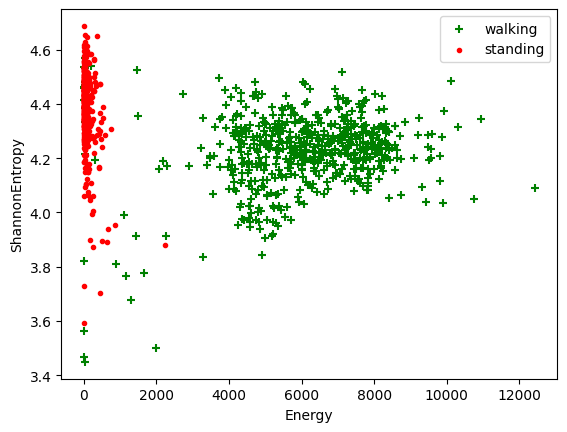

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline



plt.scatter(df_walking_standing[df_walking_standing["ActivityID"]==4]["Energy"],df_walking_standing[df_walking_standing["ActivityID"]==4]["ShannonEntropy"],color="green",marker="+", label="walking")
plt.scatter(df_walking_standing[df_walking_standing["ActivityID"]==3]["Energy"],df_walking_standing[df_walking_standing["ActivityID"]==3]["ShannonEntropy"],color="red",marker=".", label="standing")
plt.xlabel("Energy")
plt.ylabel("ShannonEntropy")
plt.legend()
plt.show()


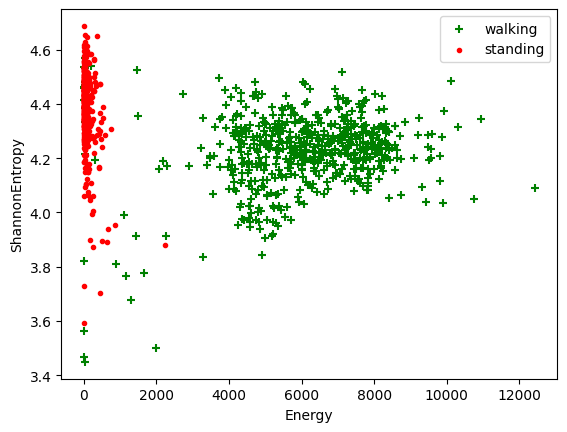

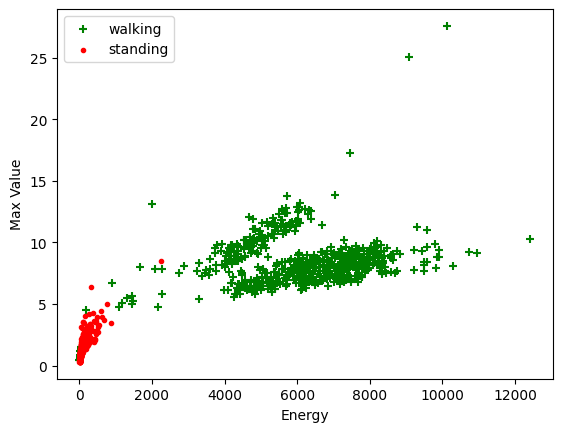

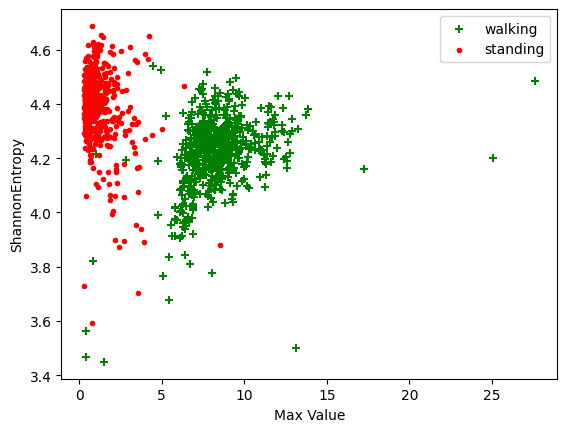

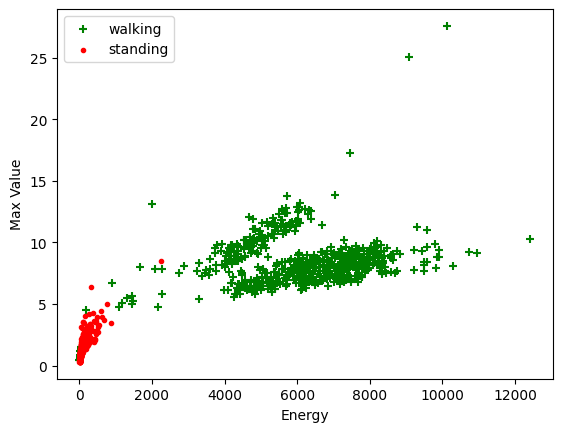

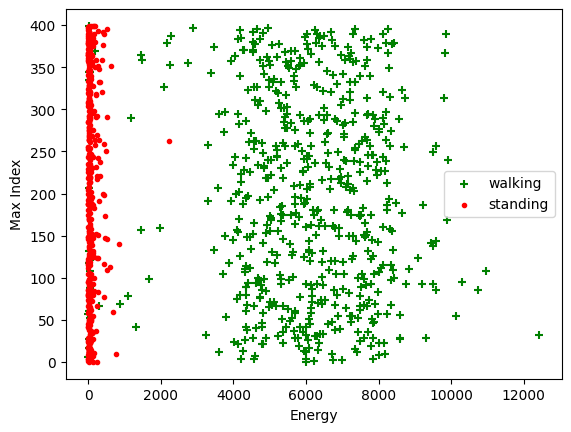

count     478.000000
mean       79.842410
std       153.678521
min         2.513067
25%        13.248090
50%        29.599588
75%        76.795480
max      2238.558124
Name: Energy, dtype: float64


In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

df_walking=df_walking_standing[df_walking_standing["ActivityID"]==4]
df_standing=df_walking_standing[df_walking_standing["ActivityID"]==3]

plt.scatter(df_walking_standing[df_walking_standing["ActivityID"]==4]["Energy"],df_walking_standing[df_walking_standing["ActivityID"]==4]["ShannonEntropy"],color="green",marker="+", label="walking")
plt.scatter(df_walking_standing[df_walking_standing["ActivityID"]==3]["Energy"],df_walking_standing[df_walking_standing["ActivityID"]==3]["ShannonEntropy"],color="red",marker=".", label="standing")
plt.xlabel("Energy")
plt.ylabel("ShannonEntropy")
plt.legend()
plt.show()


plt.scatter(df_walking_standing[df_walking_standing["ActivityID"]==4]["Energy"],df_walking_standing[df_walking_standing["ActivityID"]==4]["MaxValue"],color="green",marker="+", label="walking")
plt.scatter(df_walking_standing[df_walking_standing["ActivityID"]==3]["Energy"],df_walking_standing[df_walking_standing["ActivityID"]==3]["MaxValue"],color="red",marker=".", label="standing")
plt.xlabel("Energy")
plt.ylabel("Max Value")
plt.legend()
plt.show()


plt.scatter(df_walking["MaxValue"],df_walking["ShannonEntropy"],color="green",marker="+", label="walking")
plt.scatter(df_standing["MaxValue"],df_standing["ShannonEntropy"],color="red",marker=".", label="standing")
plt.xlabel("Max Value")
plt.ylabel("ShannonEntropy")
plt.legend()
plt.show()

plt.scatter(df_walking["Energy"],df_walking["MaxValue"],color="green",marker="+", label="walking")
plt.scatter(df_standing["Energy"],df_standing["MaxValue"],color="red",marker=".", label="standing")
plt.xlabel("Energy")
plt.ylabel("Max Value")
plt.legend()
plt.show()


plt.scatter(df_walking["Energy"],df_walking["MaxIndex"],color="green",marker="+", label="walking")
plt.scatter(df_standing["Energy"],df_standing["MaxIndex"],color="red",marker=".", label="standing")
plt.xlabel("Energy")
plt.ylabel("Max Index")
plt.legend()
plt.show()


print(df_standing["Energy"].describe())


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


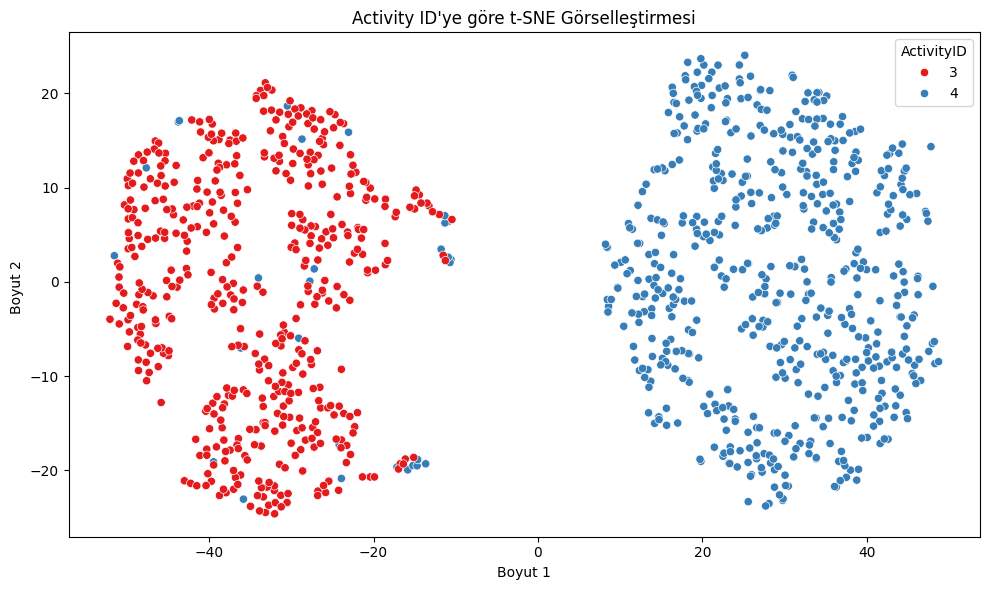

In [6]:
#t-SNE ile iki boyuta ingirgeyerek görselleştirme:
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt

#t-sne'ye vereceğim özellikler:
features_ml= ['Energy', 'ShannonEntropy', 'MaxValue', 'MaxIndex', 'MinValue', 'MinIndex']
X = df_walking_standing[features_ml].dropna()
y=df_walking_standing.loc[X.index, "ActivityID"]

#ölçeklendirme:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)

#t-SNE ile iki botyuta indirelim:
tsne=TSNE(n_components=2, random_state=42,perplexity=30, n_iter=1000)
X_tsne = tsne.fit_transform(X_scaled)

#sonuçları dataFrame olarak aktarıyorum:
tsne_df=pd.DataFrame(data=X_tsne, columns = ['Dim1', 'Dim2'])
tsne_df['ActivityID'] = y.values

#görselleştirelim:
plt.figure(figsize=(10,6))
sns.scatterplot(data=tsne_df, x="Dim1", y="Dim2", hue="ActivityID", palette="Set1")
plt.title("Activity ID'ye göre t-SNE Görselleştirmesi")
plt.xlabel("Boyut 1")
plt.ylabel("Boyut 2 ")
plt.tight_layout()
plt.show()


RuntimeError: No mappable was found to use for colorbar creation. First define a mappable such as an image (with imshow) or a contour set (with contourf).

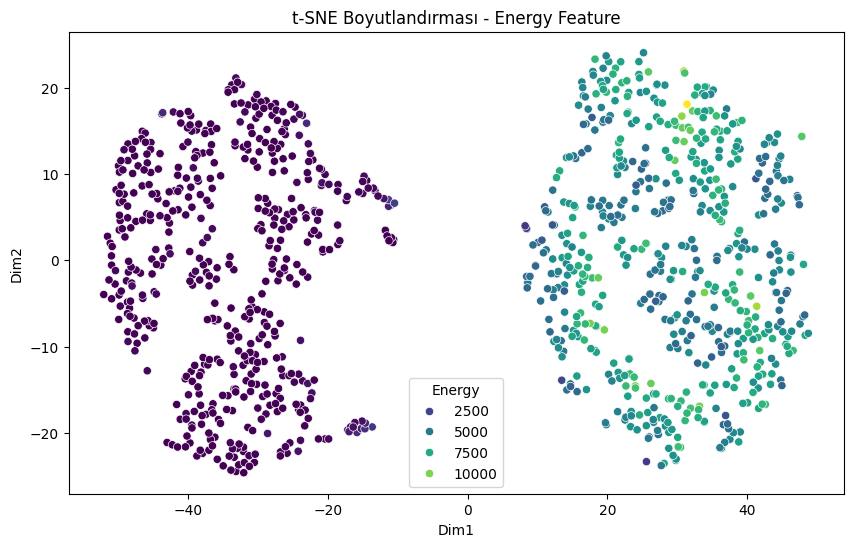

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

# Energy'i görselleştirelim
tsne_df["Energy"] = df_walking_standing.loc[X.index, "Energy"]

plt.figure(figsize=(10,6))
sns.scatterplot(x="Dim1", y="Dim2", hue="Energy", data=tsne_df, palette="viridis")
plt.title("t-SNE Boyutlandırması - Energy Feature")
plt.colorbar(label="Energy Değeri")
plt.show()


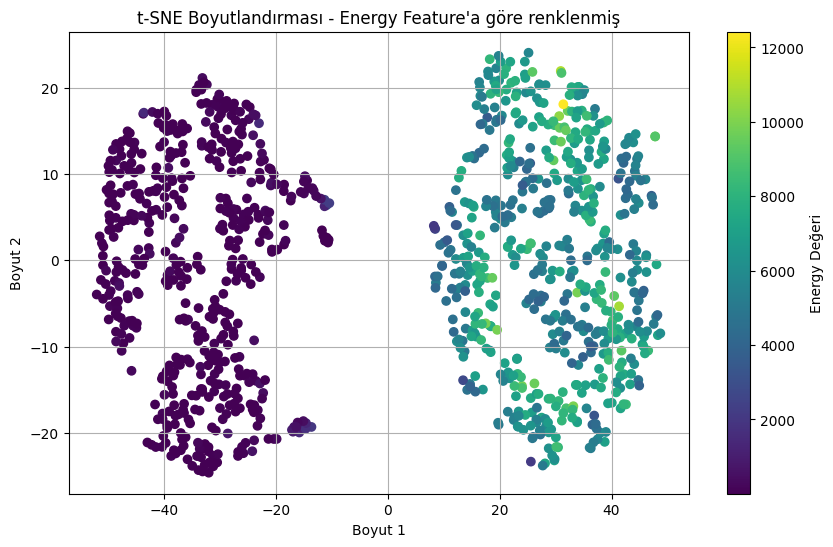

In [8]:
import matplotlib.pyplot as plt

# Energy değerlerine göre renklendir
energy_vals = df_walking_standing.loc[X.index, "Energy"]

plt.figure(figsize=(10, 6))
scatter = plt.scatter(tsne_df["Dim1"], tsne_df["Dim2"], c=energy_vals, cmap='viridis')
plt.colorbar(scatter, label="Energy Değeri")
plt.xlabel("Boyut 1")
plt.ylabel("Boyut 2")
plt.title("t-SNE Boyutlandırması - Energy Feature'a göre renklenmiş")
plt.grid(True)
plt.show()


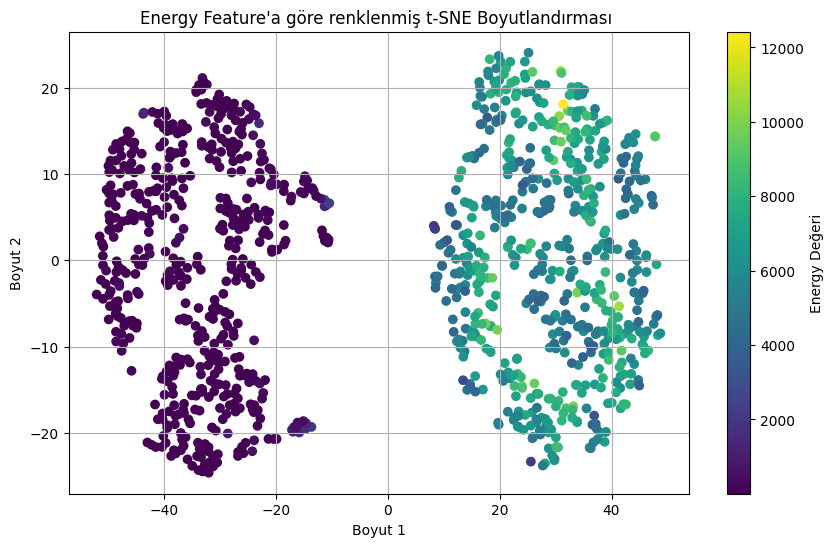

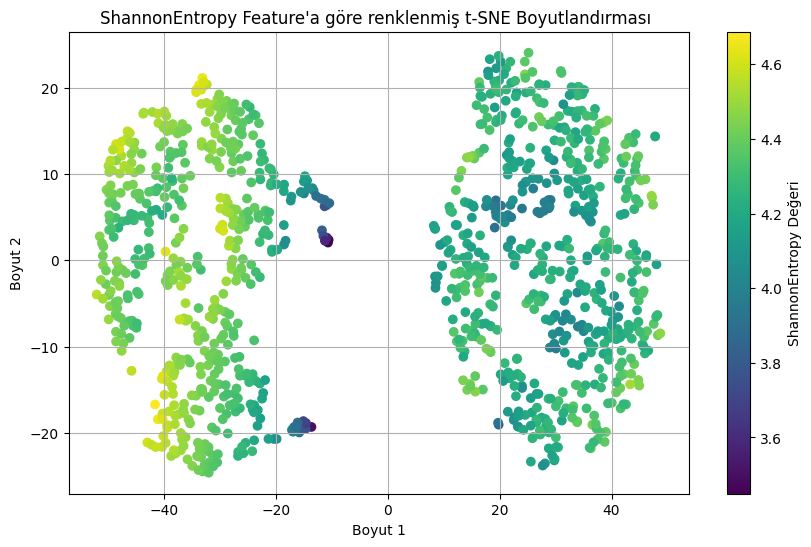

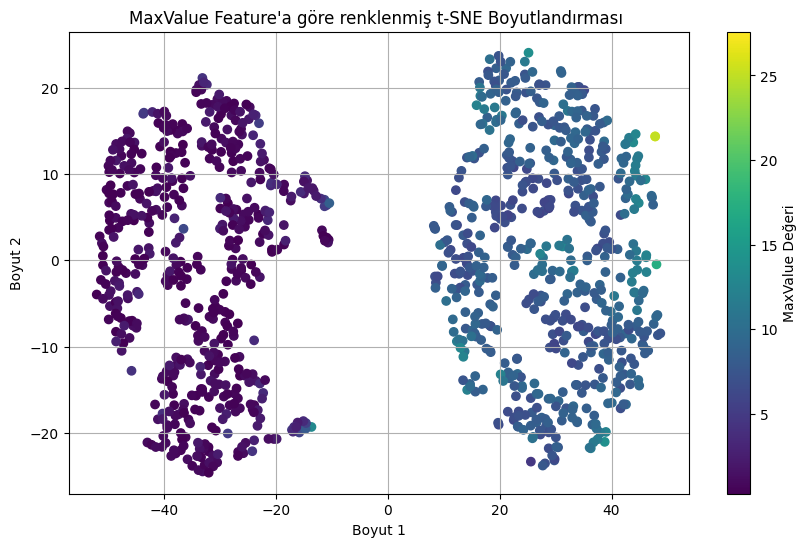

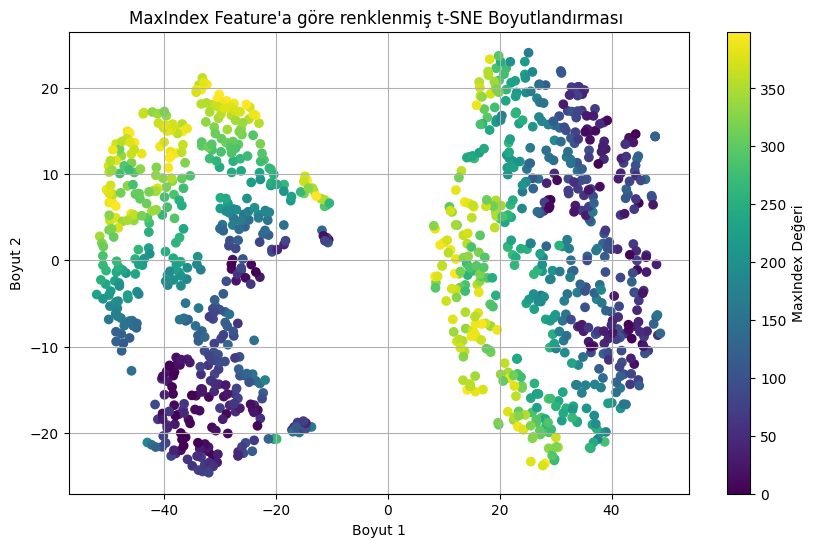

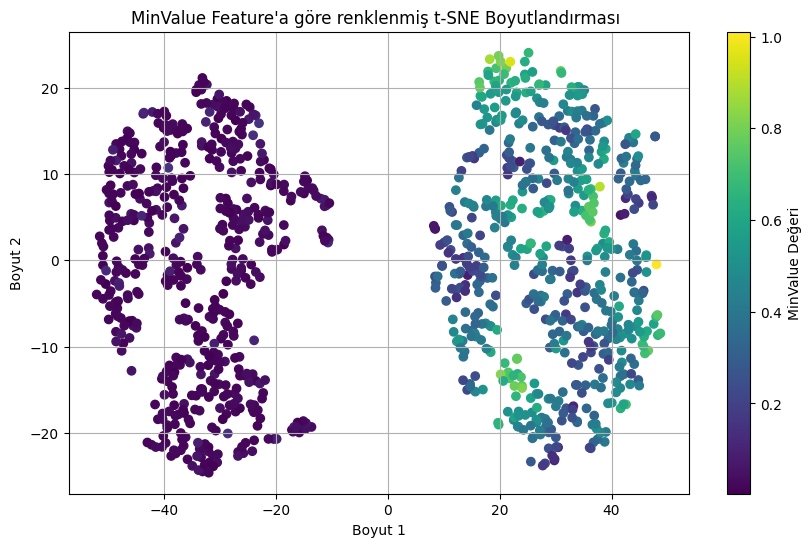

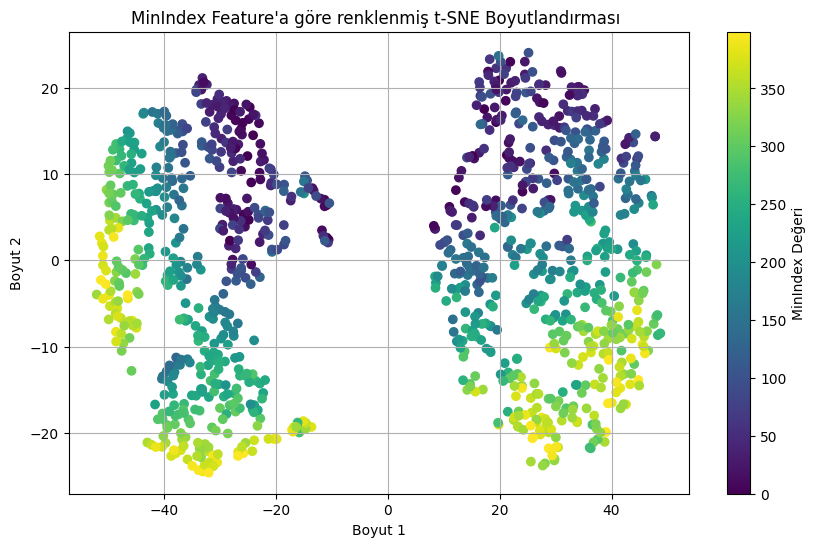

In [10]:
#tüm özelliklere göre ayrıştıralım
import matplotlib.pyplot as plt
for i in features_ml:
  vals=df_walking_standing.loc[X.index,i]

  plt.figure(figsize=(10, 6))
  scatter = plt.scatter(tsne_df["Dim1"], tsne_df["Dim2"], c=vals, cmap='viridis')
  plt.colorbar(scatter, label=f"{i} Değeri")
  plt.xlabel("Boyut 1")
  plt.ylabel("Boyut 2")
  plt.title(f"{i} Feature'a göre renklenmiş t-SNE Boyutlandırması ")
  plt.grid(True)
  plt.show()



peki neden sol ve sağda ayrı gruplar görünğyr? boyut 1 de - değerli ve + ddeğerli olan veri noktaları ne anlam ifade ediyor

Çok güzel bir soru! Şimdi bunu tam olarak t-SNE bağlamında açıklayayım:

---

### 🎯 **t-SNE Görselindeki Boyutlar (Boyut 1 & Boyut 2) ne anlama gelir?**

* `Boyut 1` ve `Boyut 2` dediğimiz eksenler **verinin gerçek öznitelikleri (örneğin Energy, Entropy, vb.) değil**, t-SNE algoritmasının **yüksek boyutlu uzaydaki benzerlikleri koruyarak ürettiği 2D koordinatlardır**.
* Yani `Boyut 1` ekseni örneğin “Energy artıyor” gibi yorumlanamaz.
* Ancak bu eksenlerdeki **göreli konum** (yani veri noktalarının birbirine olan yakınlığı veya uzaklığı) **benzerliğe göre** belirlenir.

---

### 📍 **Peki neden sol ve sağda iki grup (kümelenme) oluştu?**

Bu, t-SNE'nin şöyle düşündüğü anlamına gelir:

* **Soldaki noktalar**, kendi aralarında çok benzer → bu yüzden bir kümeye konulmuşlar.
* **Sağdaki noktalar** da kendi içinde benzer ama soldakilerle **yeterince benzer değil** → bu yüzden farklı bir yere yerleştirilmişler.
* Yani:

  > “Bu iki grup, feature'lar (Energy, Entropy, MaxValue...) açısından birbirine çok farklı davranışlar gösteriyor” demek **olasıdır.**

---

### ⚠️ Ancak dikkat!

* t-SNE **ölçek bağımsızdır**, yani Boyut 1’in -40 olması veya Boyut 2’nin +20 olması **hiçbir gerçek fiziksel anlam taşımaz**.
* Önemli olan şey:

  * Grupların **birbirinden ayrık** olup olmaması
  * Aynı gruptaki noktaların **yakın yerlerde kümelenmiş** olmasıdır.

---

### 🔎 Bir örnekle netleştirelim:

Diyelim ki:

* Sol taraftaki grup çoğunlukla **Standing (ActivityID=3)** verileri
* Sağ taraftaki grup çoğunlukla **Walking (ActivityID=4)** verileri içeriyor

Bu durumda t-SNE algoritması aslında şöyle demiştir:

> "Standing ve Walking verileri, seçilen feature'lar açısından (örneğin Energy, Entropy...) **farklı benzerlik yapıları taşıyor**, ben de bunları mümkün olduğunca ayrı yerleştirdim."

---

### 💡 Özetle:

| Soru                              | Cevap                                                                                   |
| --------------------------------- | --------------------------------------------------------------------------------------- |
| Boyut 1 ve Boyut 2 ne demek?      | t-SNE'nin oluşturduğu yapay 2D koordinatlar, gerçek feature değil.                      |
| Neden sol ve sağda iki küme var?  | Bu iki grup yüksek boyutlu uzayda birbirine benzemediği için t-SNE tarafından ayrılmış. |
| Bu - ve + değerler ne ifade eder? | Sadece görsel yerleşim içindir, gerçek fiziksel anlam taşımaz.                          |
| Ayrım anlamlı mı?                 | Renklerle (örneğin Energy) veya hue ile (ActivityID) net ayrım varsa anlamlı.           |

---

İstersen aynı görselle PCA üzerinden de boyut indirgeme yapıp karşılaştırabiliriz. Böylece yapay ayrım mı yoksa gerçekten anlamlı mı daha net olur. Devam edelim mi?


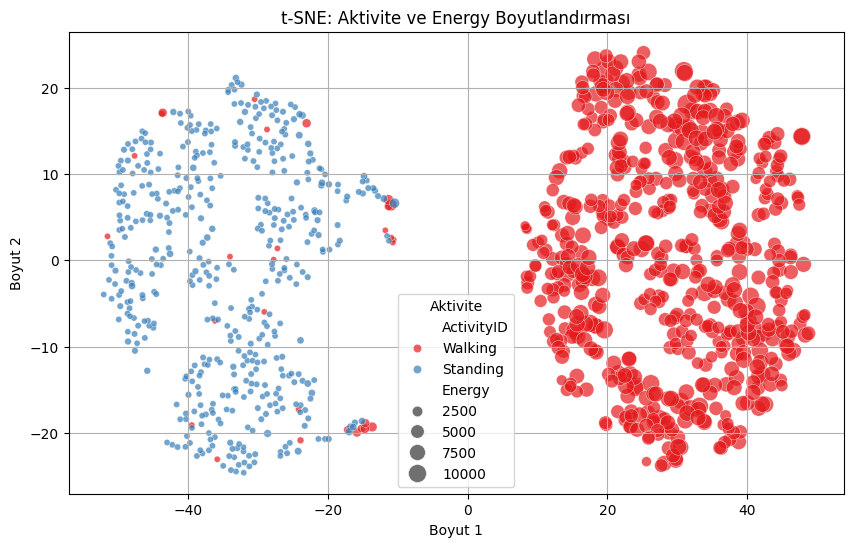

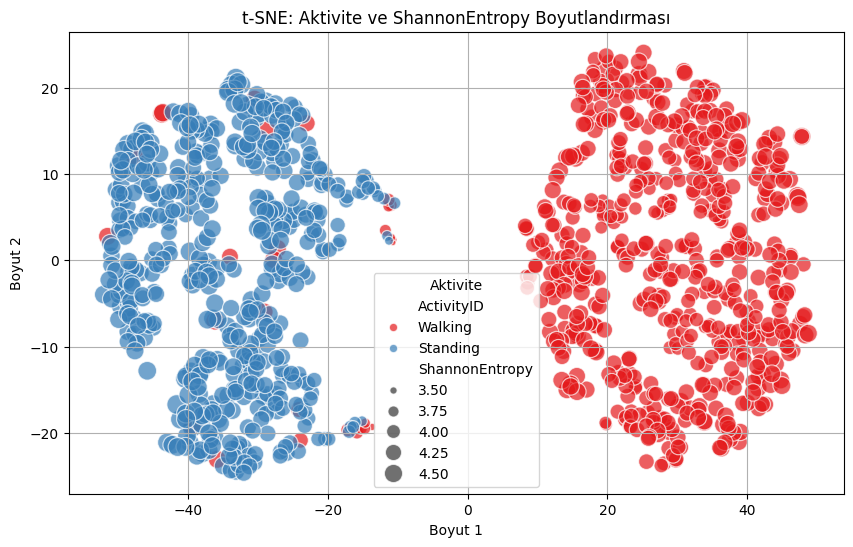

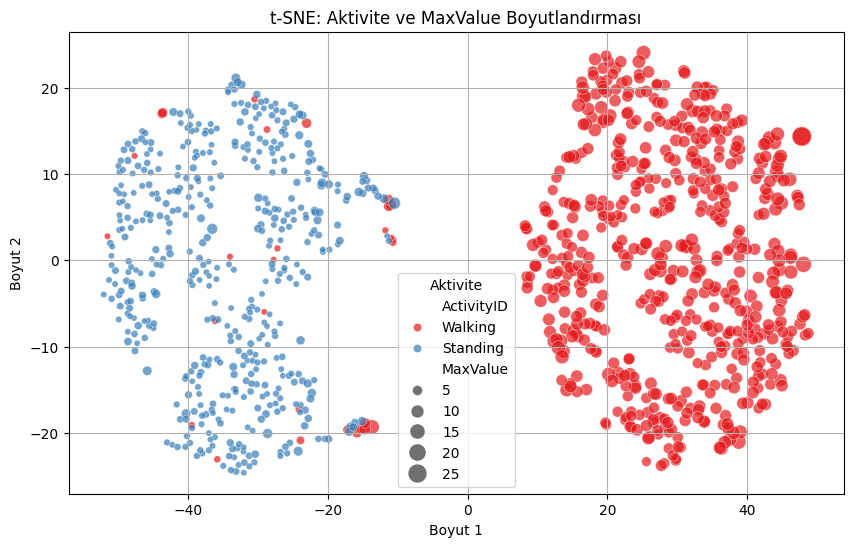

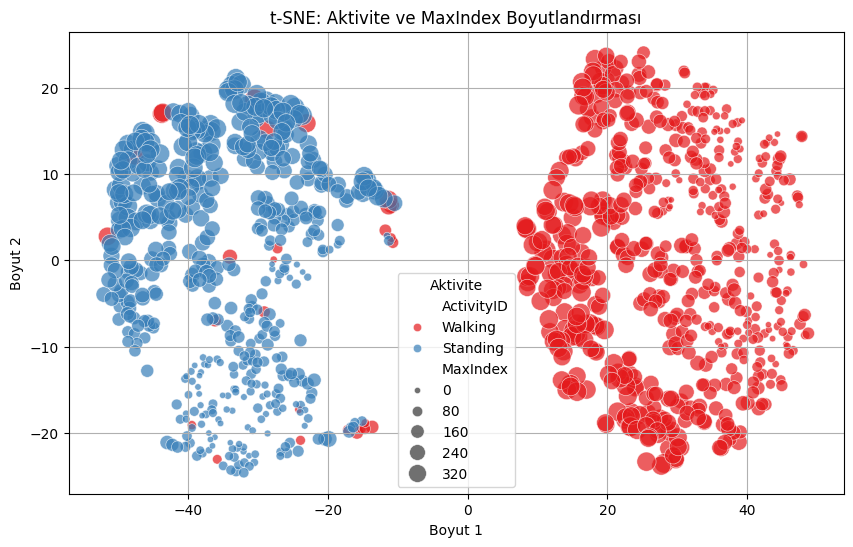

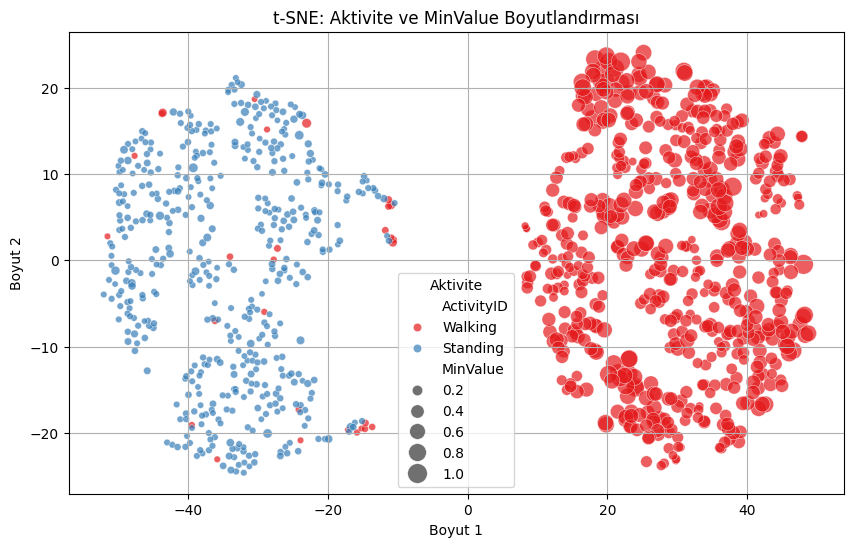

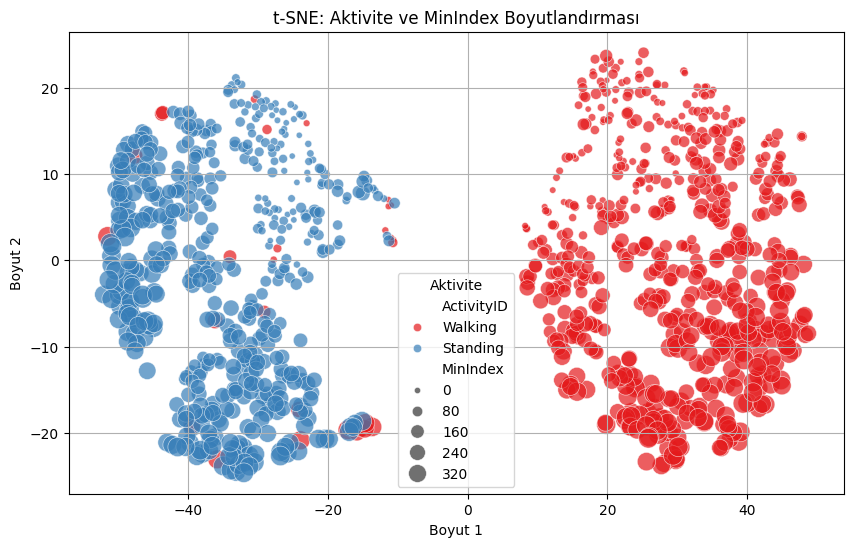

In [14]:
for i in features_ml:
  tsne_df[i] = df_walking_standing[i].values
  plt.figure(figsize=(10, 6))

  sns.scatterplot(
      x="Dim1", y="Dim2",
      data=tsne_df,
      hue=tsne_df["ActivityID"].map({3: "Standing", 4: "Walking"}),
      size=tsne_df[i],
      sizes=(20, 200),
      palette="Set1",
      alpha=0.7
)

  plt.title(f"t-SNE: Aktivite ve {i} Boyutlandırması")
  plt.xlabel("Boyut 1")
  plt.ylabel("Boyut 2")
  plt.legend(title="Aktivite")
  plt.grid(True)
  plt.show()


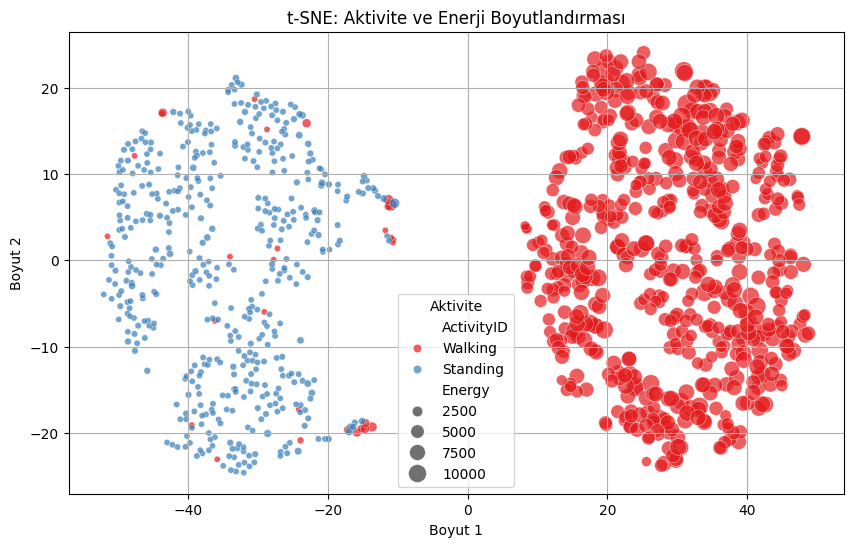

In [12]:
plt.figure(figsize=(10, 6))

sns.scatterplot(
    x="Dim1", y="Dim2",
    data=tsne_df,
    hue=tsne_df["ActivityID"].map({3: "Standing", 4: "Walking"}),
    size=tsne_df["Energy"],
    sizes=(20, 200),
    palette="Set1",
    alpha=0.7
)

plt.title("t-SNE: Aktivite ve Enerji Boyutlandırması")
plt.xlabel("Boyut 1")
plt.ylabel("Boyut 2")
plt.legend(title="Aktivite")
plt.grid(True)
plt.show()


In [ ]:
subject_names=df_walking_standing["subject_name"].unique()
print(subject_names)

['subject01' 'subject02' 'subject03' 'subject04' 'subject05' 'subject06'
 'subject07' 'subject08']


Energy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.911137610593832e-31


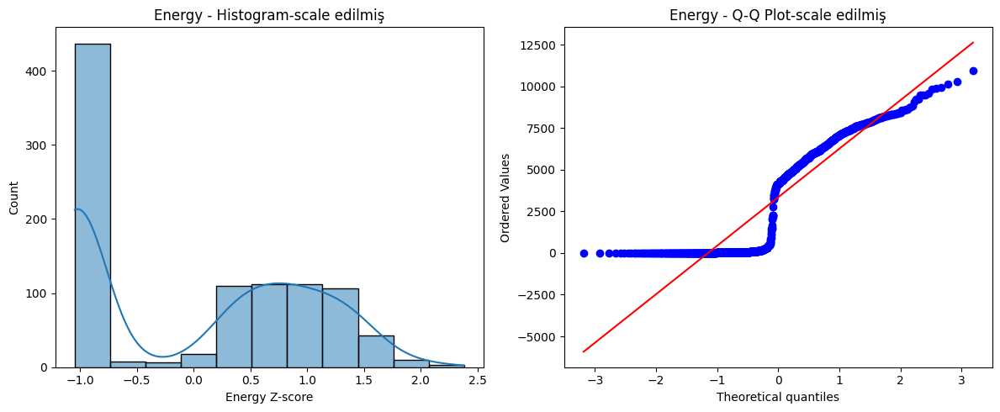

ShannonEntropy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.913151186143804e-15


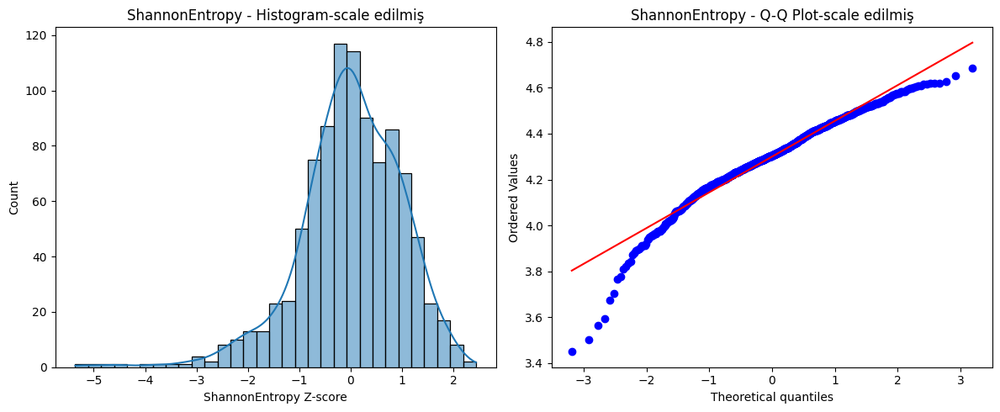

MaxValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 4.331739068786744e-27


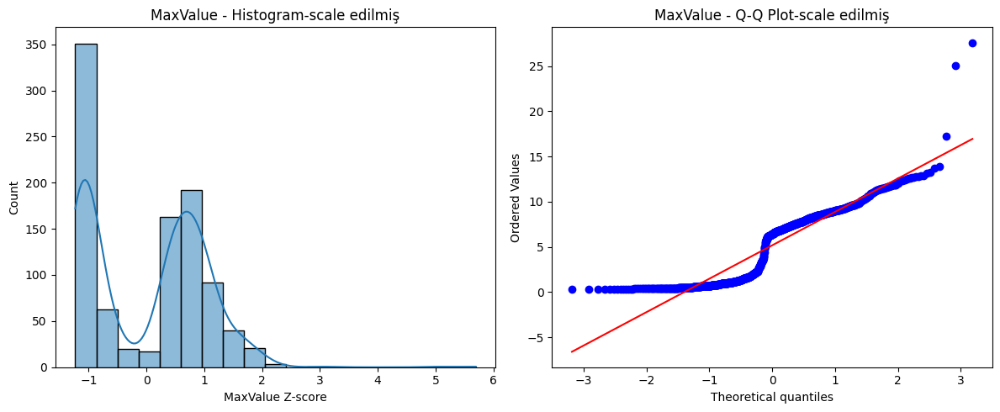

MaxIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 9.880260667959046e-19


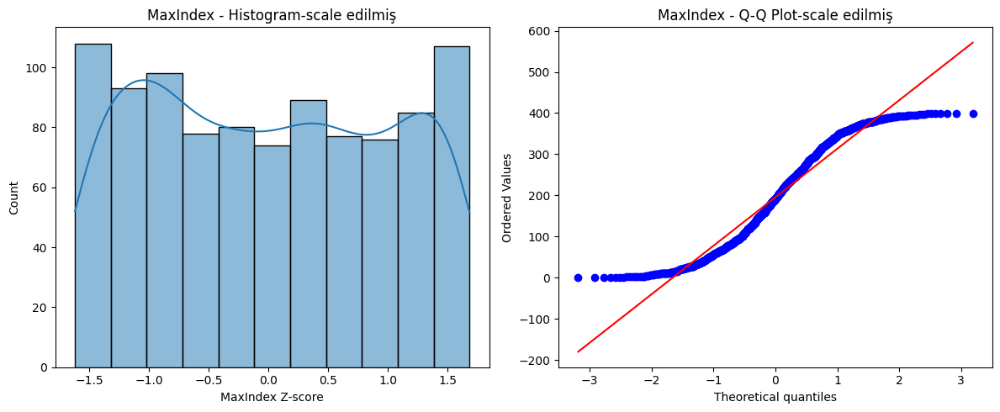

MinValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 3.9981496927475253e-28


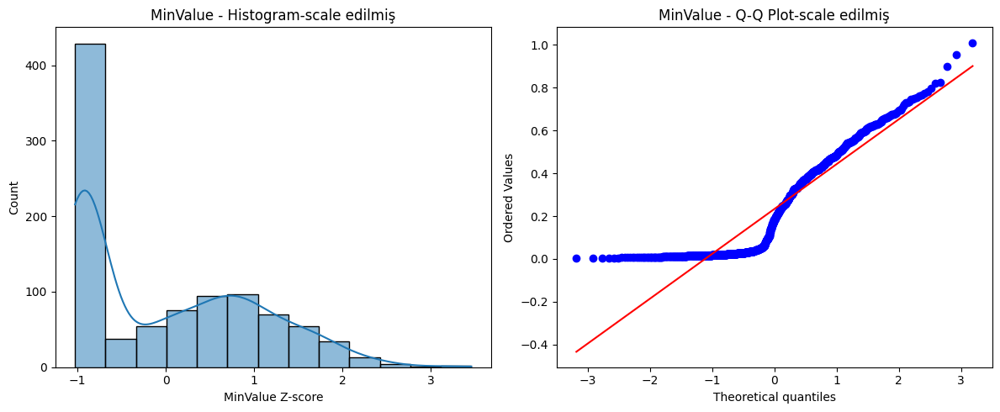

MinIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.909290501308472e-17


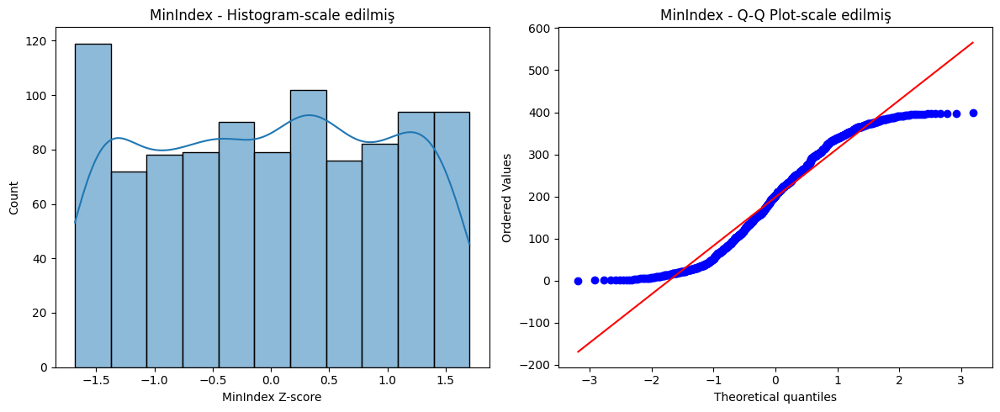

Energy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.9111376105934574e-31


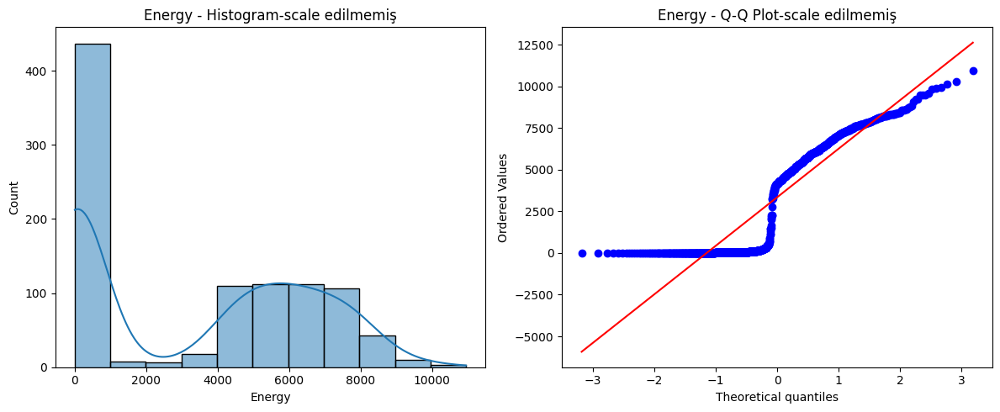

ShannonEntropy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.913151186144032e-15


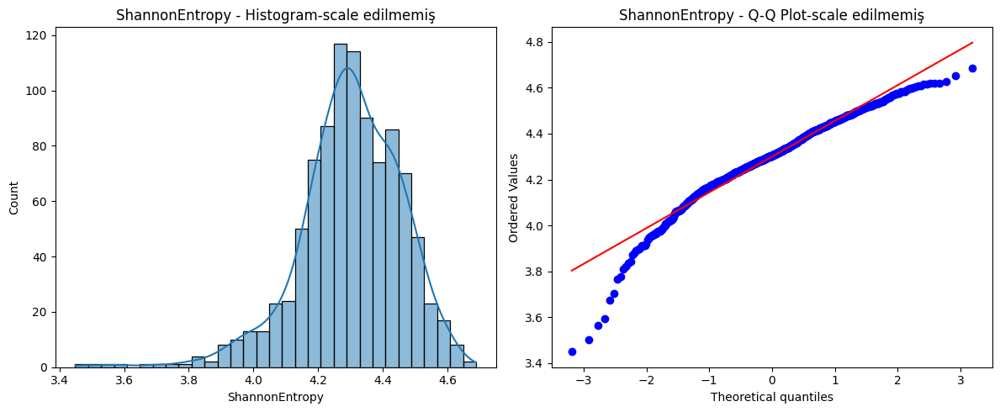

MaxValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 4.3317390687863405e-27


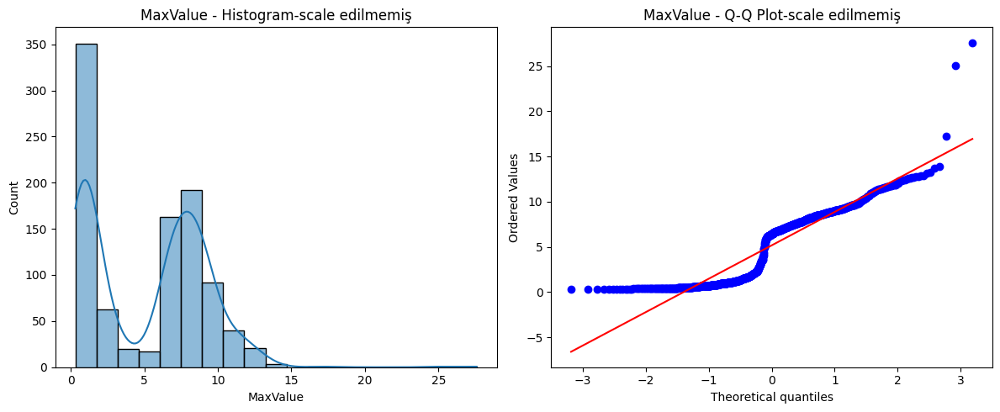

MaxIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 9.880260667959046e-19


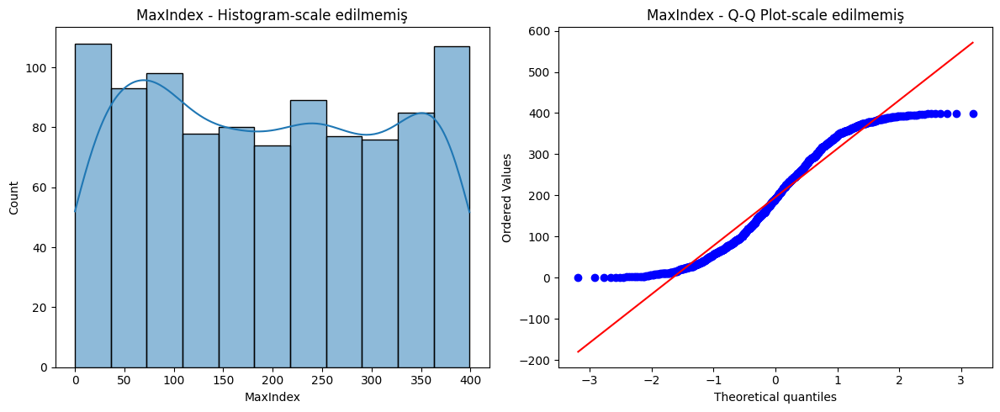

MinValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 3.998149692747754e-28


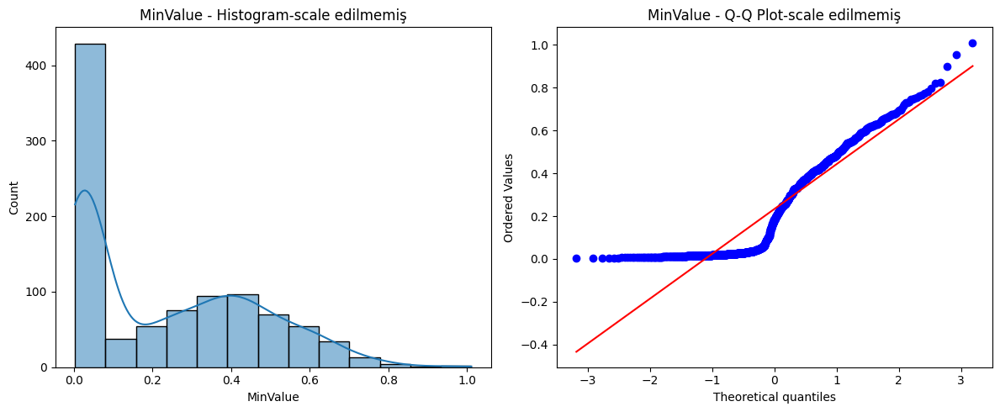

MinIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.909290501308788e-17


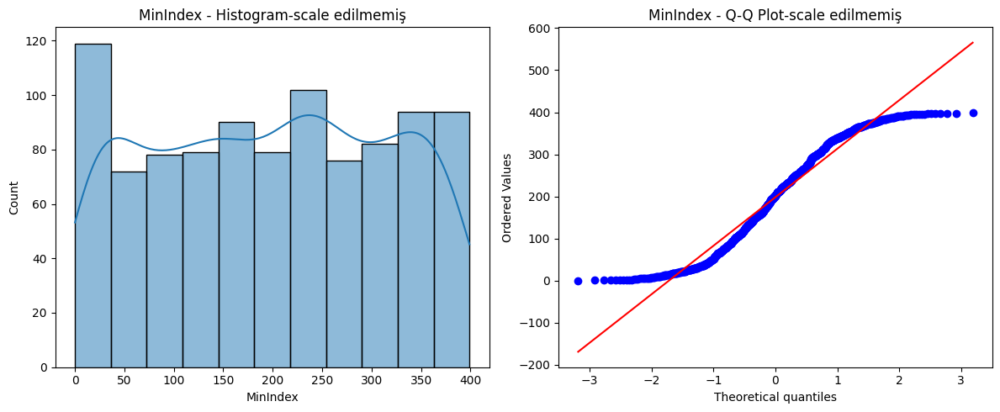


   SVM Sonuçları (Test Subject: subject01):
Accuracy: 0.9640
Precision: 0.9815
Recall: 0.9464
F1 Score: 0.9636
              precision    recall  f1-score   support

           0       0.95      0.98      0.96        55
           1       0.98      0.95      0.96        56

    accuracy                           0.96       111
   macro avg       0.96      0.96      0.96       111
weighted avg       0.96      0.96      0.96       111

[[54  1]
 [ 3 53]]


<Figure size 500x500 with 0 Axes>

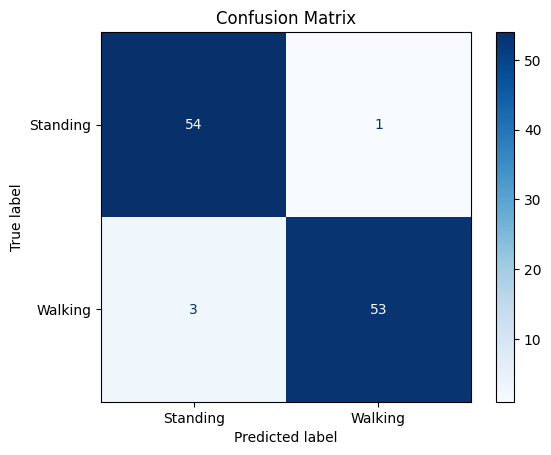


   Random Forest Sonuçları (Test Subject= subject01):
Accuracy: 0.9730
Precision: 1.0000
Recall: 0.9464
F1 Score: 0.9725
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        55
           1       1.00      0.95      0.97        56

    accuracy                           0.97       111
   macro avg       0.97      0.97      0.97       111
weighted avg       0.97      0.97      0.97       111

[[55  0]
 [ 3 53]]


<Figure size 500x500 with 0 Axes>

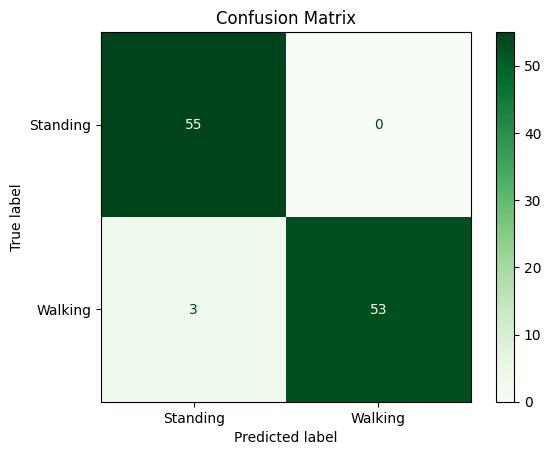

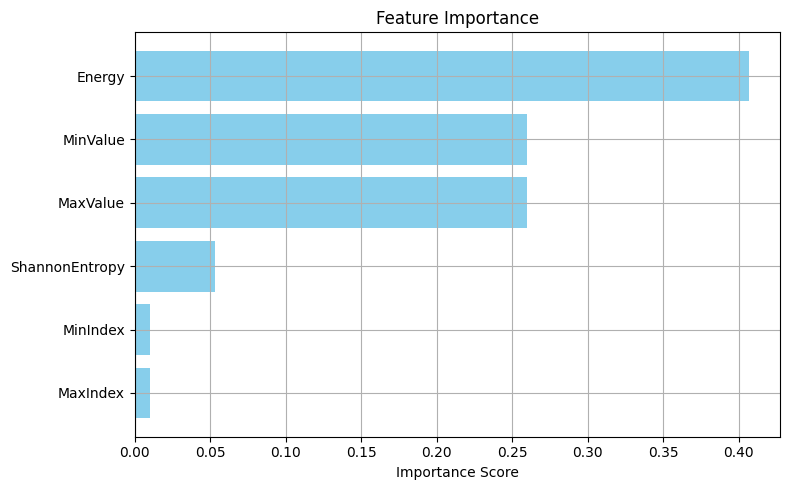


   XGBoost Sonuçları (Test Subject= subject01):
Accuracy: 0.9730
Precision: 1.0000
Recall: 0.9464
F1 Score: 0.9725
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        55
           1       1.00      0.95      0.97        56

    accuracy                           0.97       111
   macro avg       0.97      0.97      0.97       111
weighted avg       0.97      0.97      0.97       111

[[55  0]
 [ 3 53]]


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:11:21] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

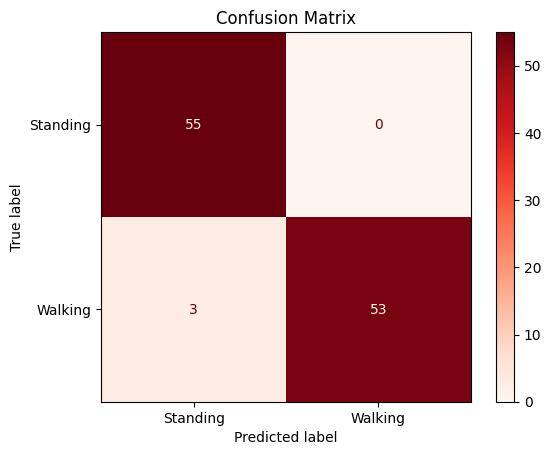

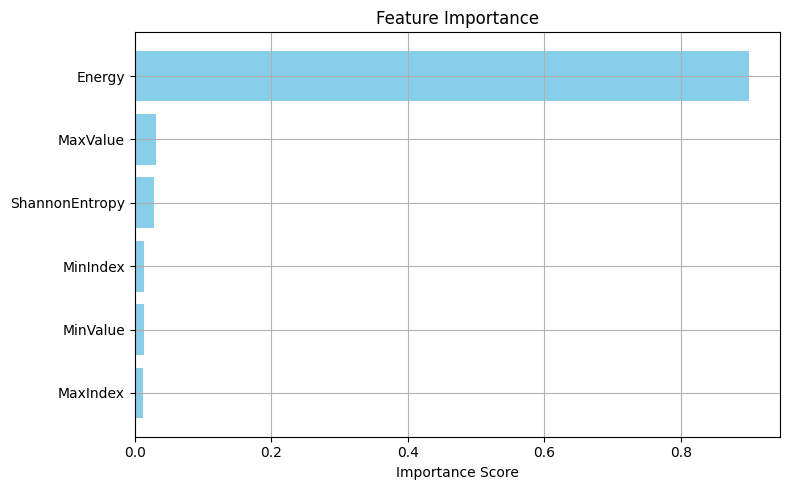

Energy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.3193552712897175e-30


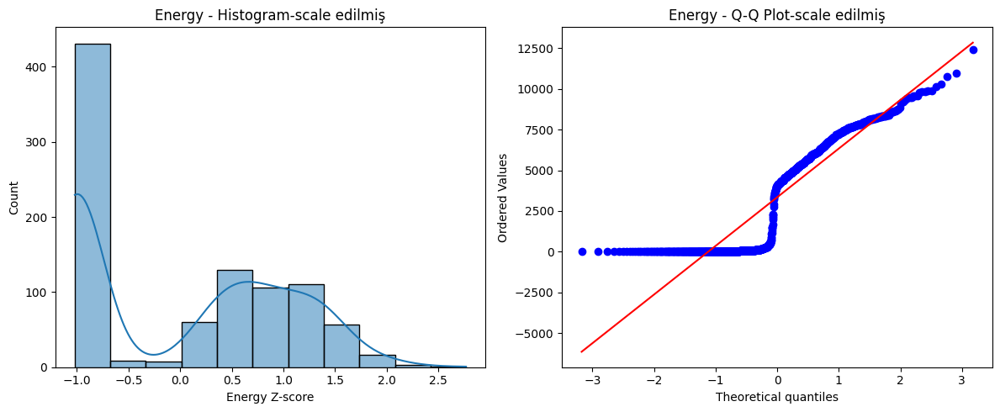

ShannonEntropy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.9099050015972593e-14


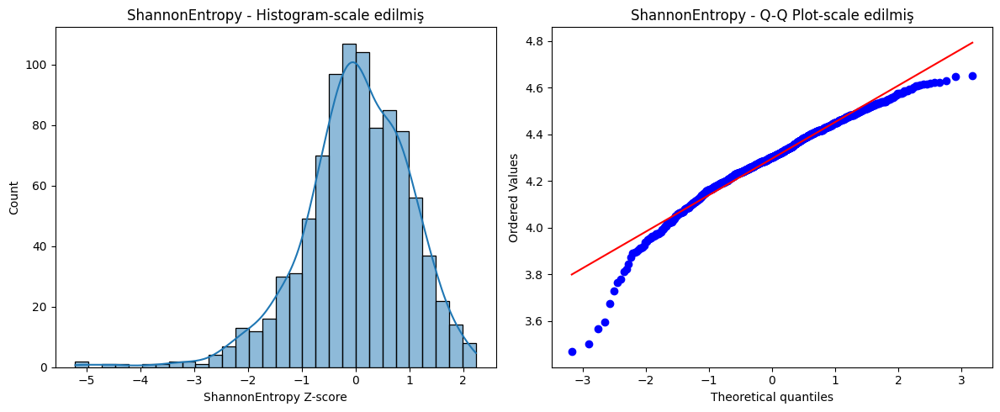

MaxValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.7953655863197883e-27


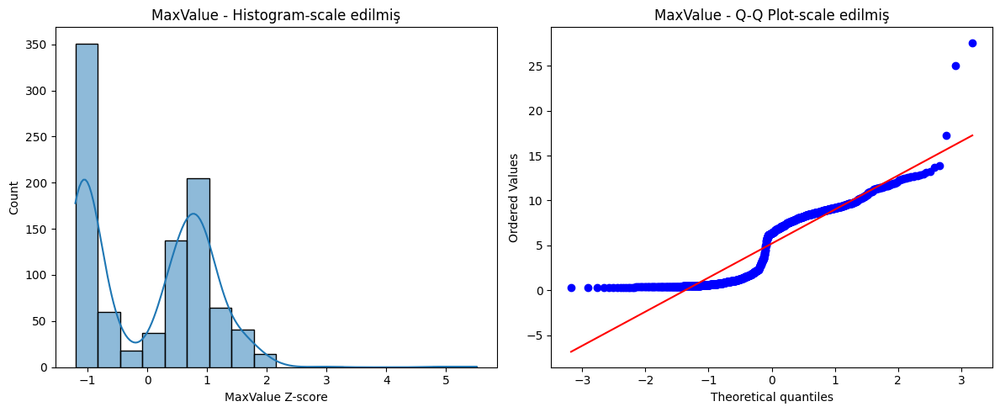

MaxIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.3618962764725807e-19


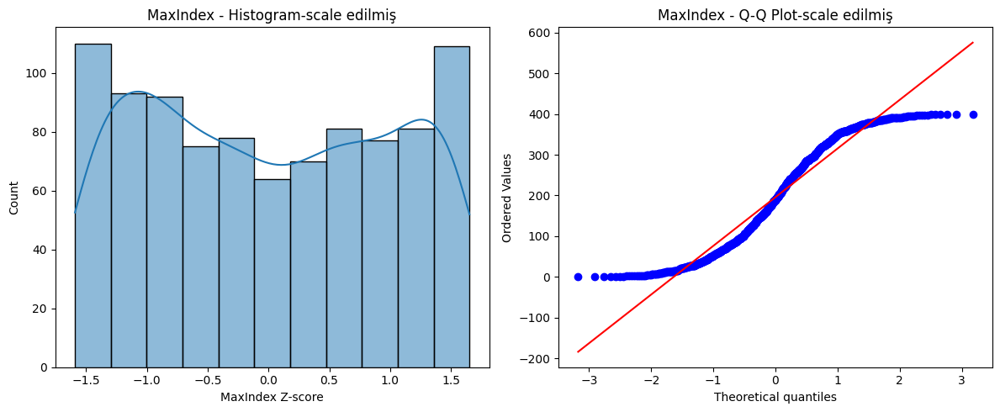

MinValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 6.223379244627397e-28


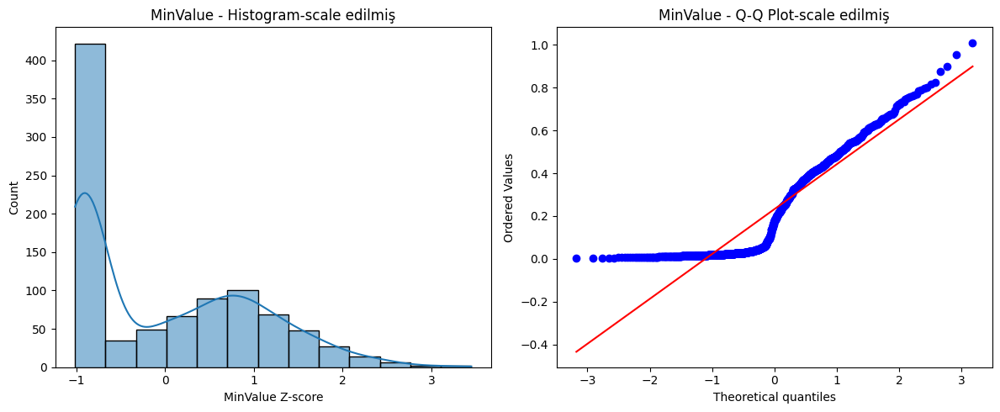

MinIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.7470289666920098e-17


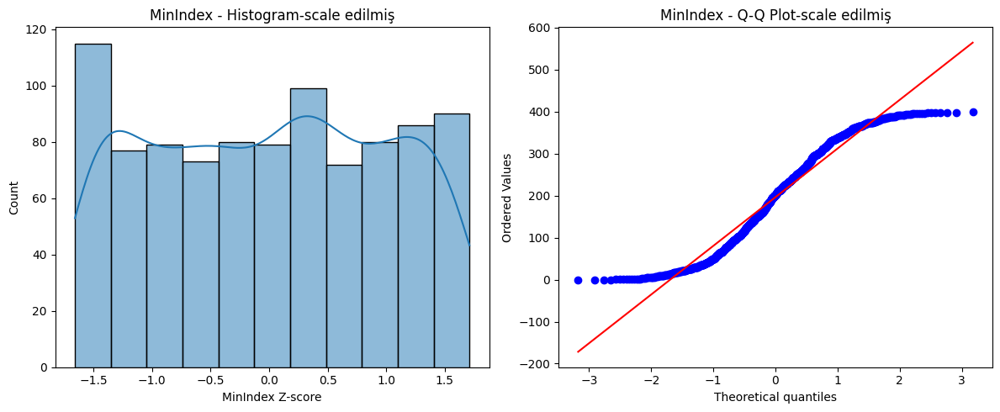

Energy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.3193552712897175e-30


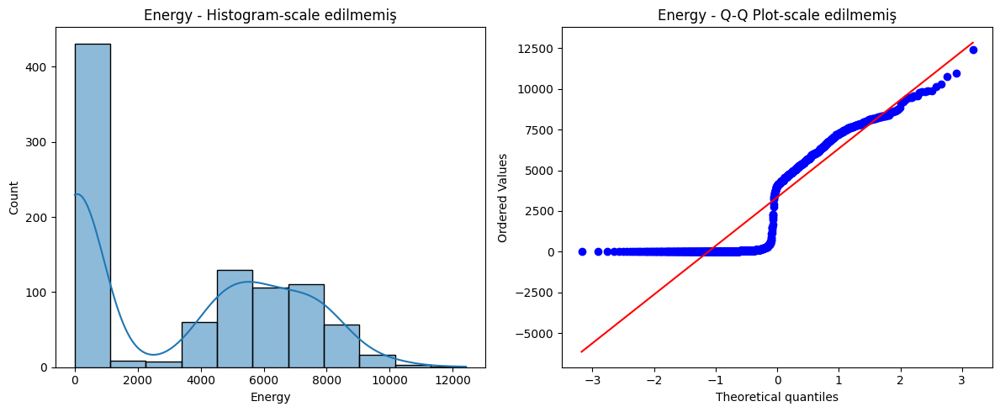

ShannonEntropy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.9099050015968106e-14


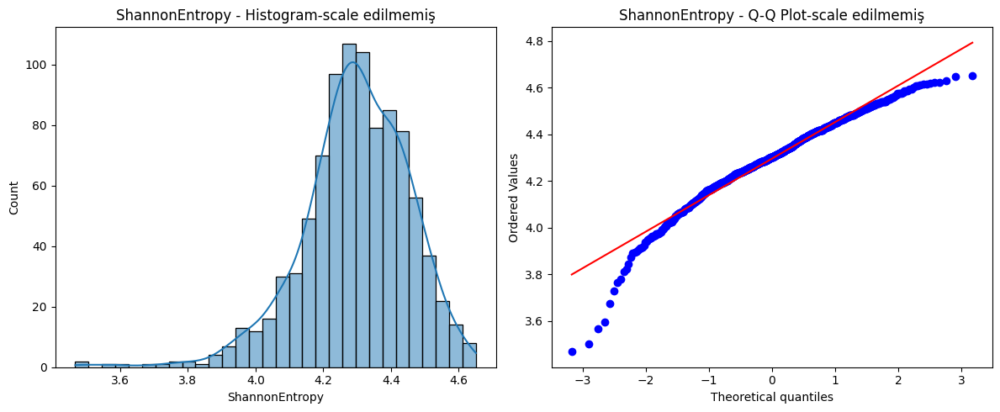

MaxValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.7953655863197883e-27


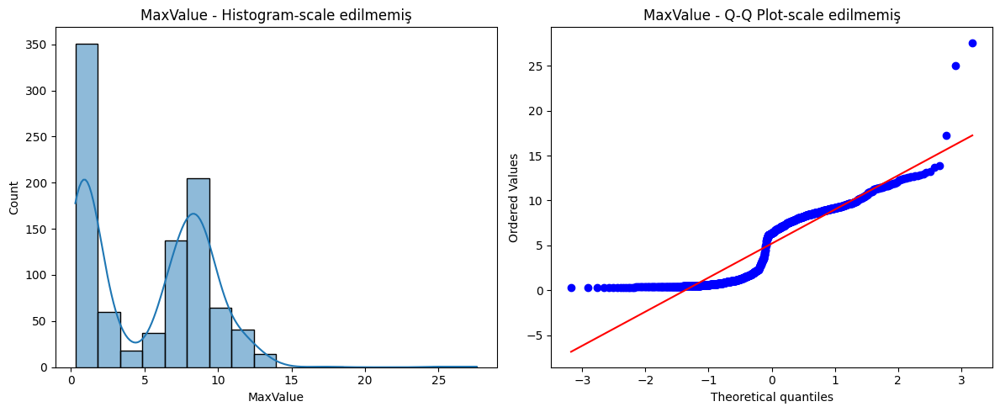

MaxIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.361896276472241e-19


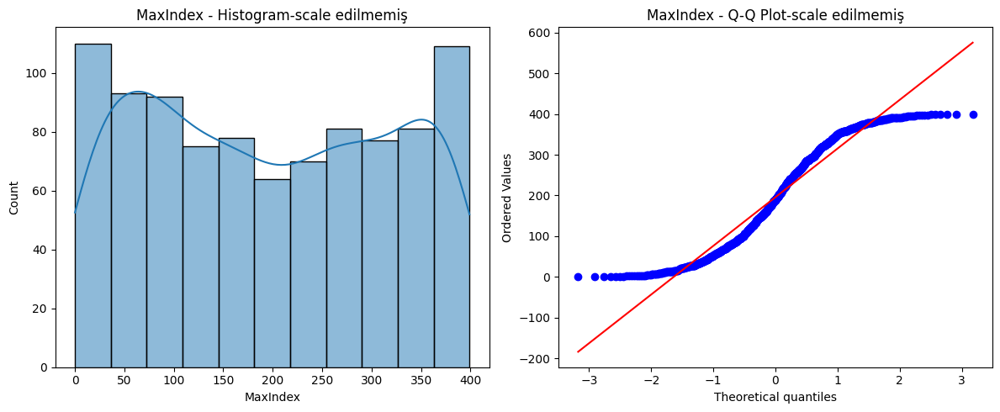

MinValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 6.223379244627397e-28


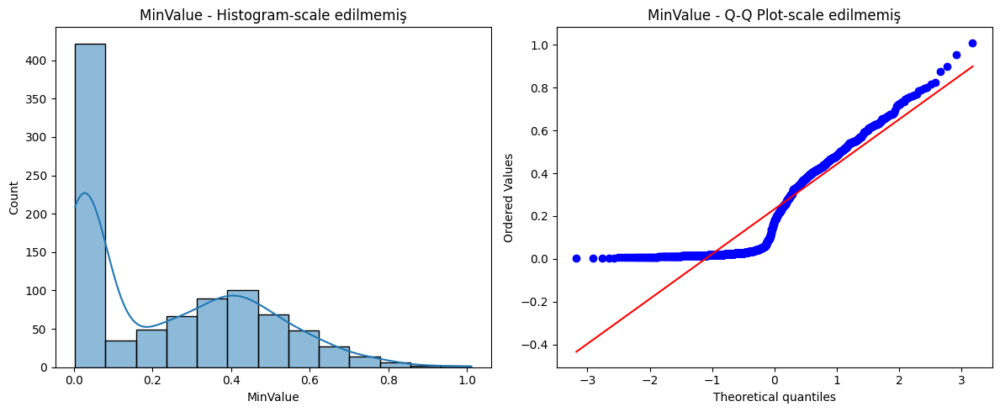

MinIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.7470289666911784e-17


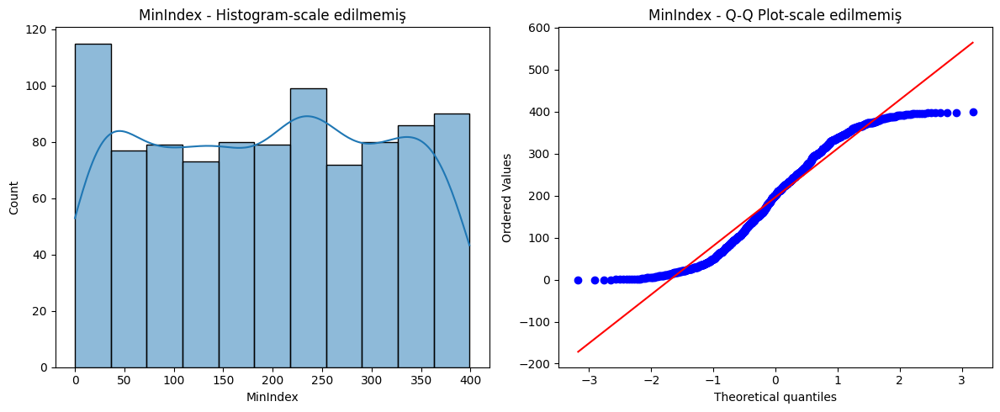


   SVM Sonuçları (Test Subject: subject02):
Accuracy: 0.9726
Precision: 0.9756
Recall: 0.9756
F1 Score: 0.9756
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        64
           1       0.98      0.98      0.98        82

    accuracy                           0.97       146
   macro avg       0.97      0.97      0.97       146
weighted avg       0.97      0.97      0.97       146

[[62  2]
 [ 2 80]]


<Figure size 500x500 with 0 Axes>

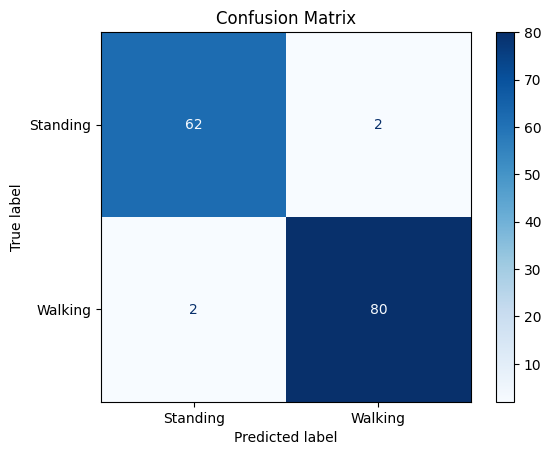


   Random Forest Sonuçları (Test Subject= subject02):
Accuracy: 0.9726
Precision: 0.9875
Recall: 0.9634
F1 Score: 0.9753
              precision    recall  f1-score   support

           0       0.95      0.98      0.97        64
           1       0.99      0.96      0.98        82

    accuracy                           0.97       146
   macro avg       0.97      0.97      0.97       146
weighted avg       0.97      0.97      0.97       146

[[63  1]
 [ 3 79]]


<Figure size 500x500 with 0 Axes>

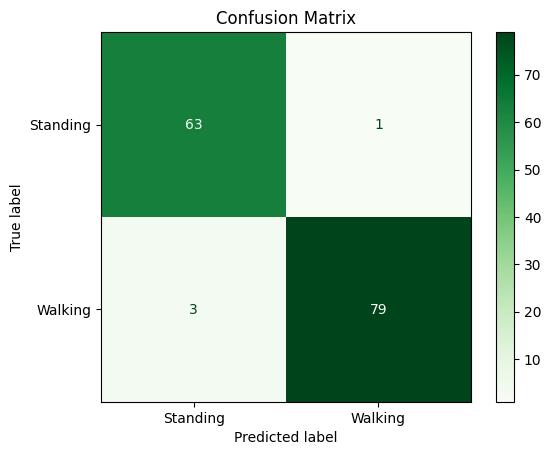

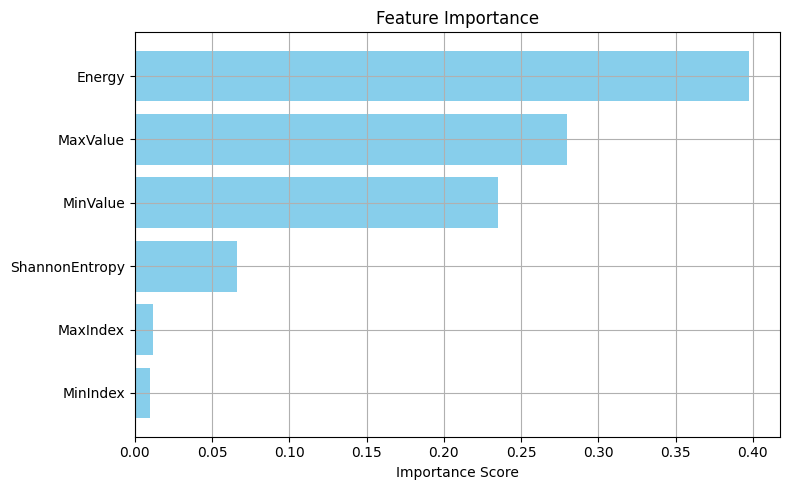


   XGBoost Sonuçları (Test Subject= subject02):
Accuracy: 0.9795
Precision: 0.9877
Recall: 0.9756
F1 Score: 0.9816
              precision    recall  f1-score   support

           0       0.97      0.98      0.98        64
           1       0.99      0.98      0.98        82

    accuracy                           0.98       146
   macro avg       0.98      0.98      0.98       146
weighted avg       0.98      0.98      0.98       146

[[63  1]
 [ 2 80]]


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:11:26] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

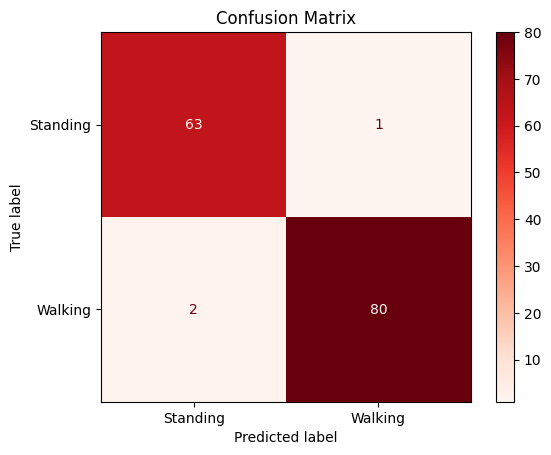

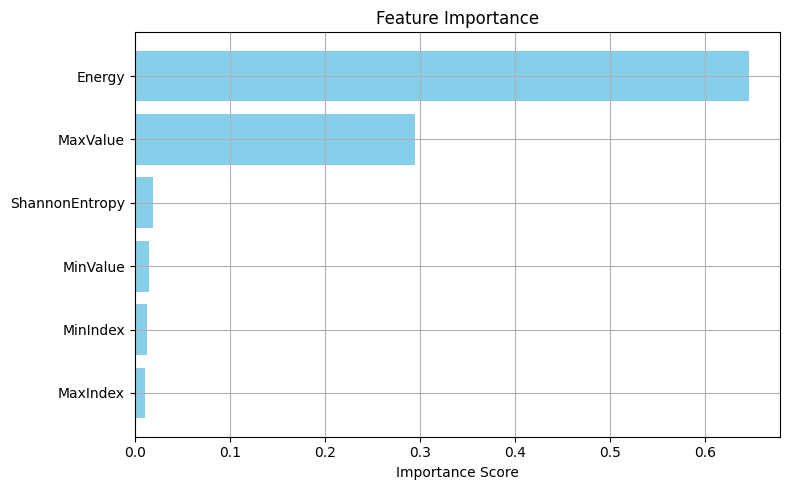

Energy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.107844655069683e-31


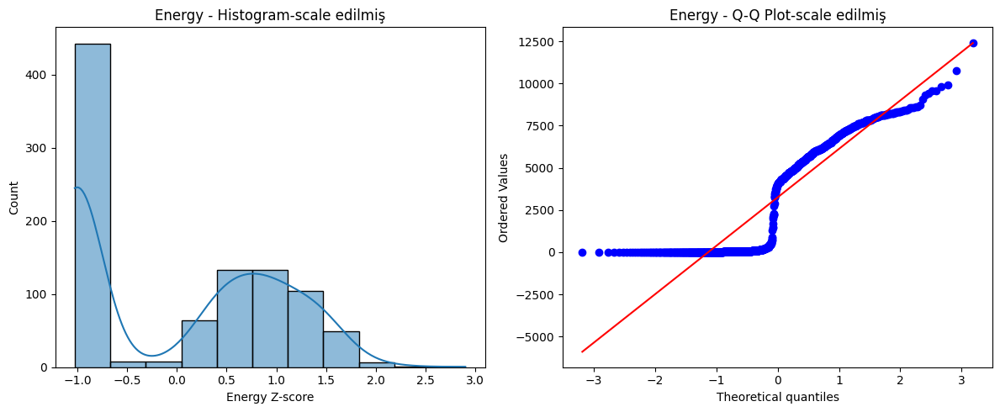

ShannonEntropy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 7.258959953376211e-15


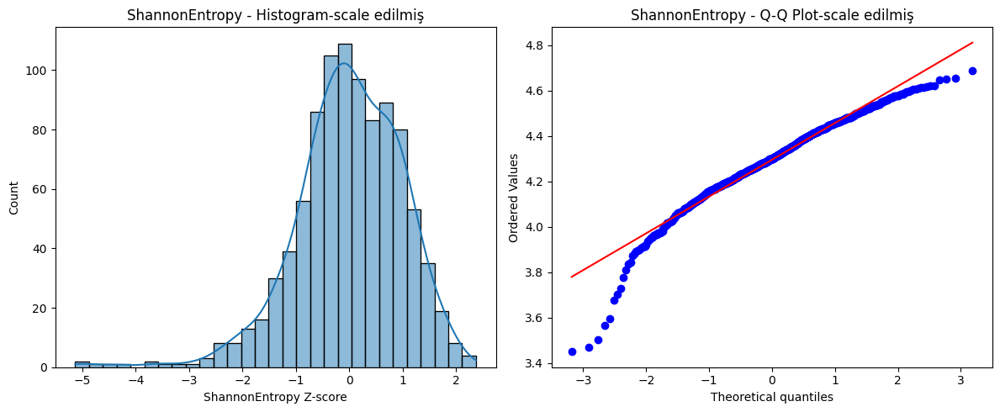

MaxValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 3.551727658405354e-27


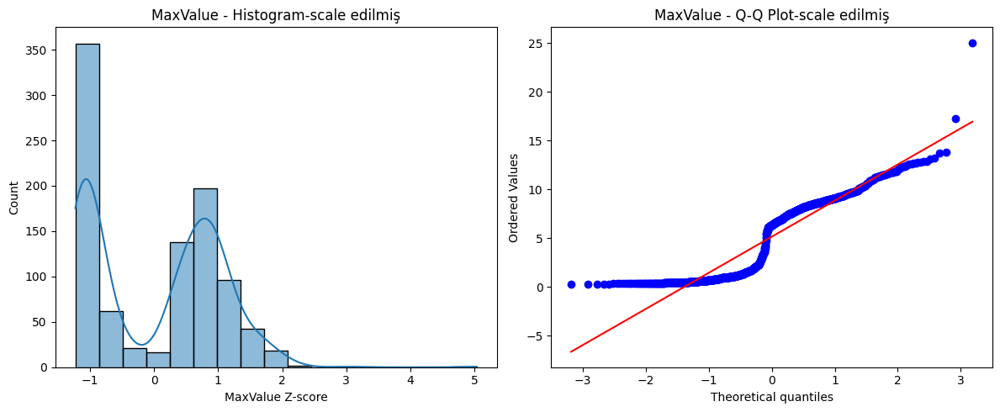

MaxIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 7.118864663259903e-19


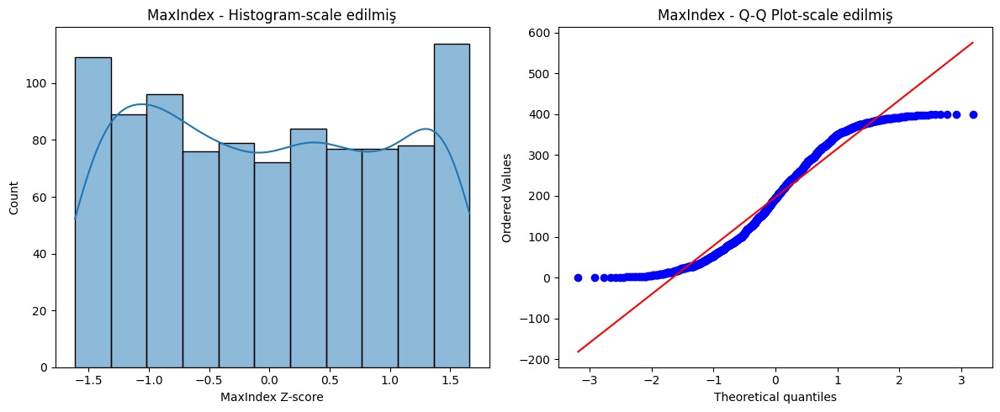

MinValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.8367667456661176e-28


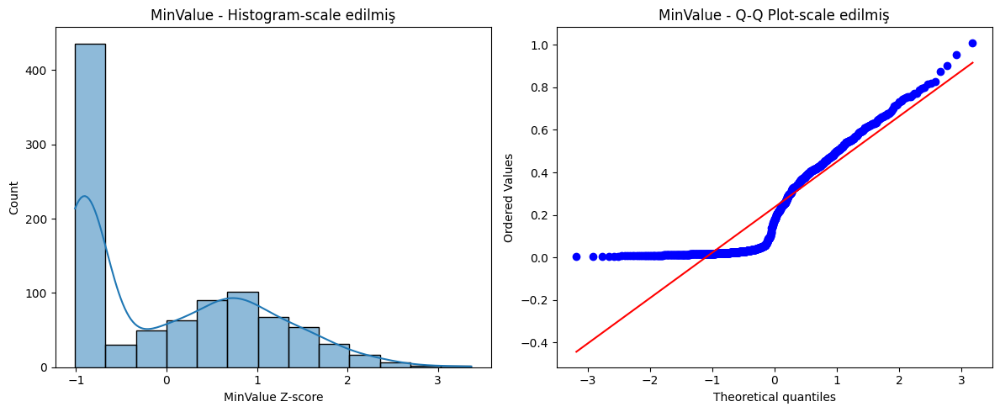

MinIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 4.576959758472361e-17


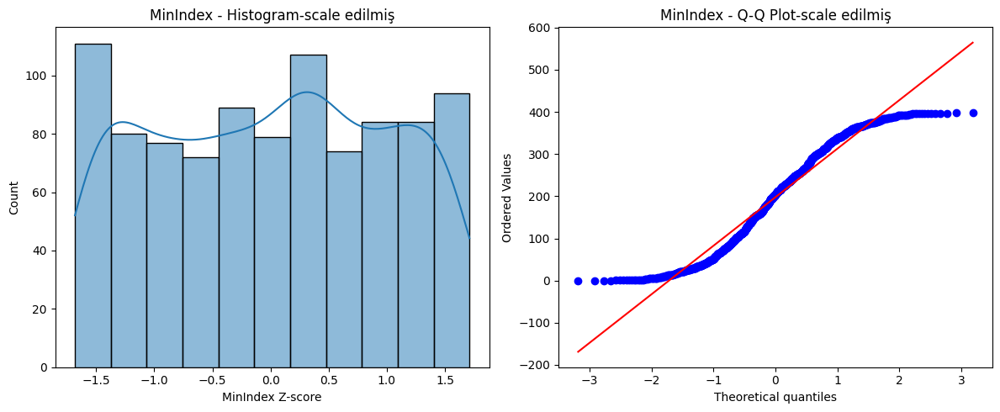

Energy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.107844655069683e-31


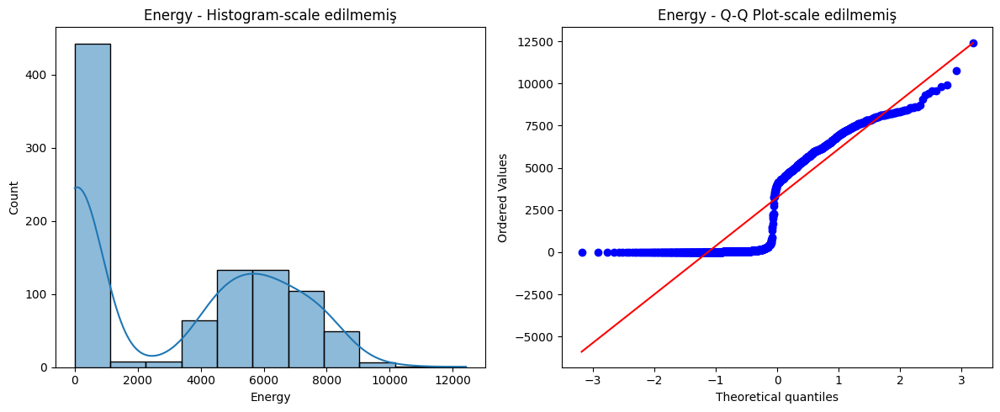

ShannonEntropy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 7.258959953374663e-15


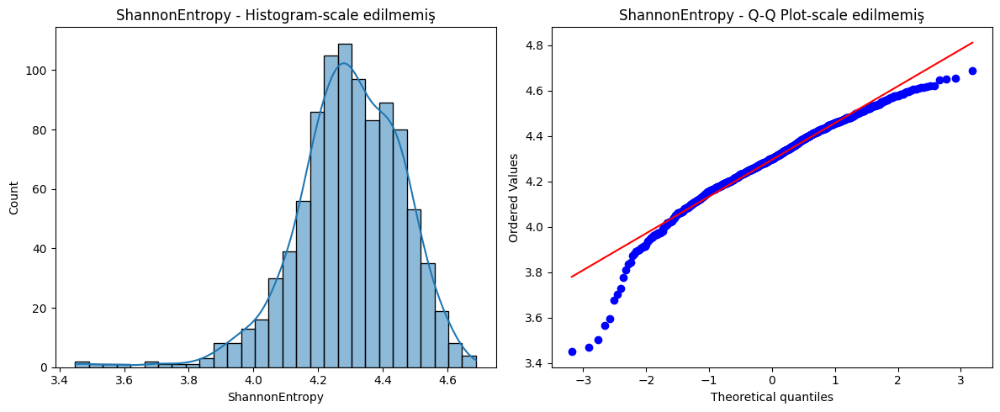

MaxValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 3.551727658405838e-27


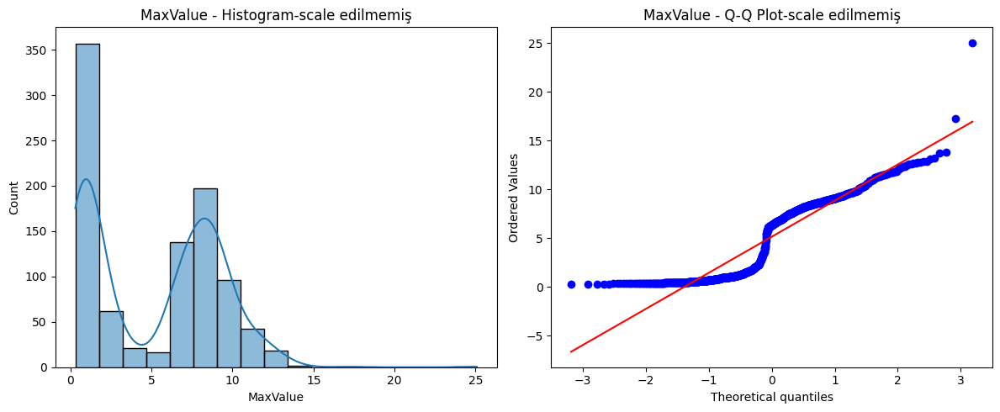

MaxIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 7.118864663259903e-19


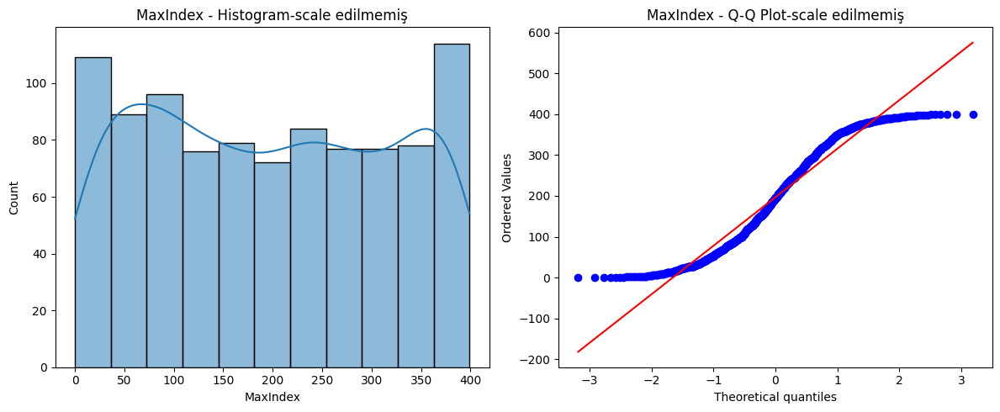

MinValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.8367667456661176e-28


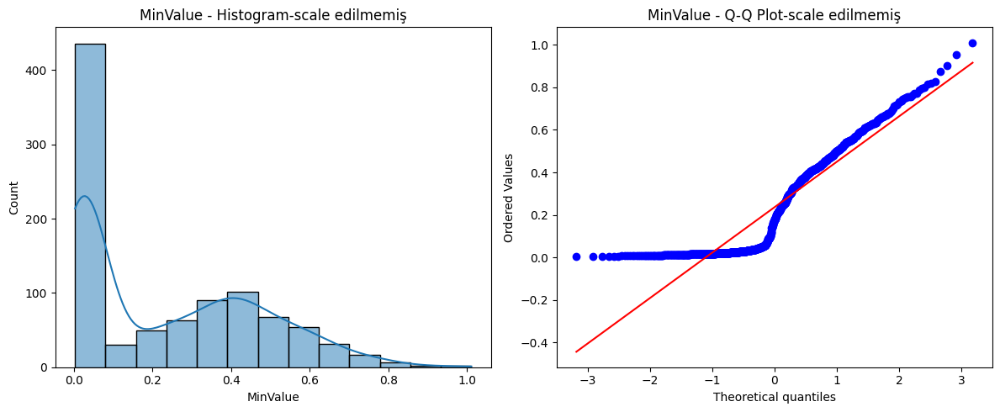

MinIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 4.576959758472361e-17


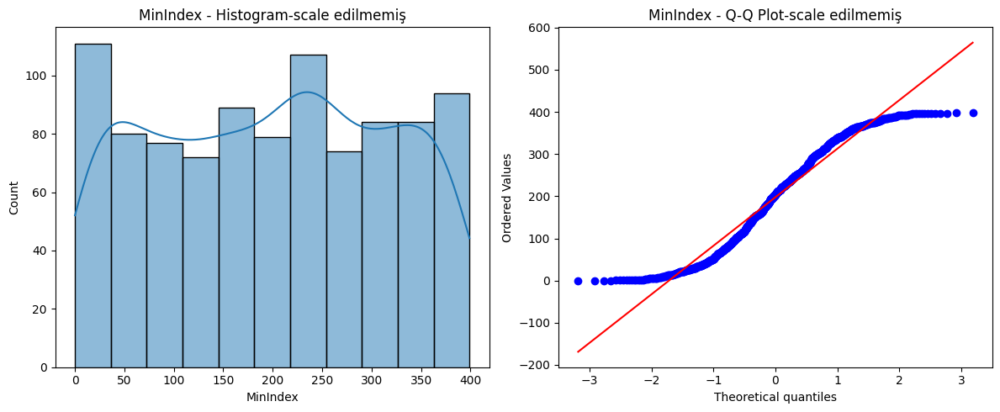


   SVM Sonuçları (Test Subject: subject03):
Accuracy: 0.9760
Precision: 1.0000
Recall: 0.9589
F1 Score: 0.9790
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        52
           1       1.00      0.96      0.98        73

    accuracy                           0.98       125
   macro avg       0.97      0.98      0.98       125
weighted avg       0.98      0.98      0.98       125

[[52  0]
 [ 3 70]]


<Figure size 500x500 with 0 Axes>

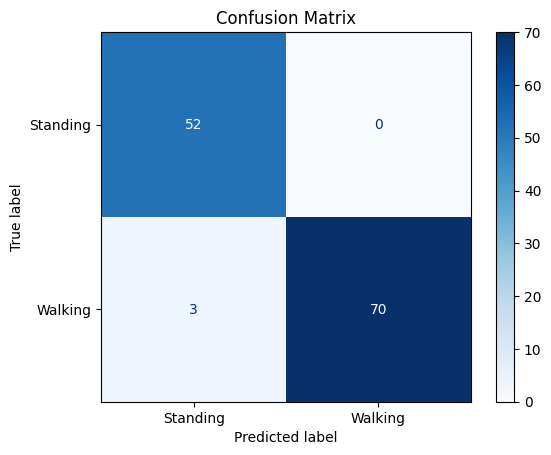


   Random Forest Sonuçları (Test Subject= subject03):
Accuracy: 0.9920
Precision: 1.0000
Recall: 0.9863
F1 Score: 0.9931
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        52
           1       1.00      0.99      0.99        73

    accuracy                           0.99       125
   macro avg       0.99      0.99      0.99       125
weighted avg       0.99      0.99      0.99       125

[[52  0]
 [ 1 72]]


<Figure size 500x500 with 0 Axes>

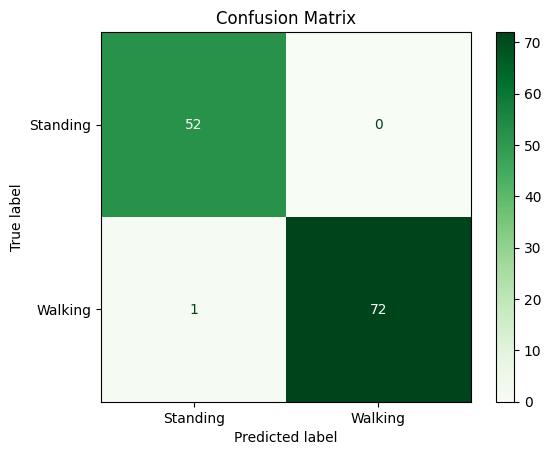

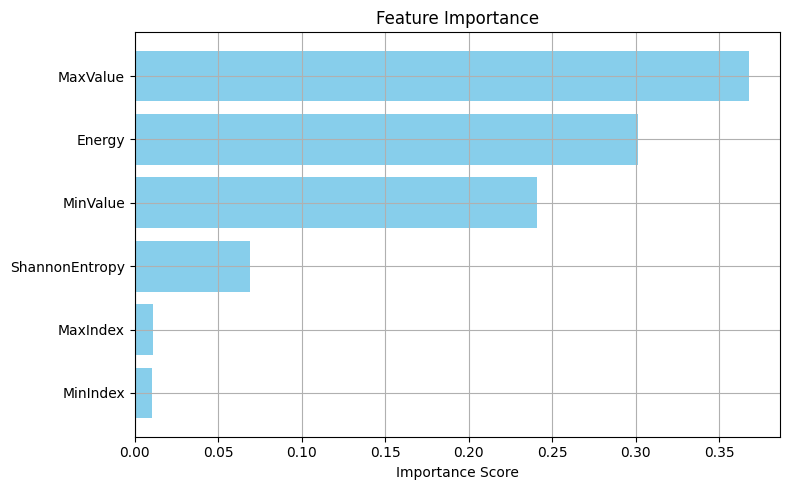


   XGBoost Sonuçları (Test Subject= subject03):
Accuracy: 0.9920
Precision: 1.0000
Recall: 0.9863
F1 Score: 0.9931
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        52
           1       1.00      0.99      0.99        73

    accuracy                           0.99       125
   macro avg       0.99      0.99      0.99       125
weighted avg       0.99      0.99      0.99       125

[[52  0]
 [ 1 72]]


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:11:31] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

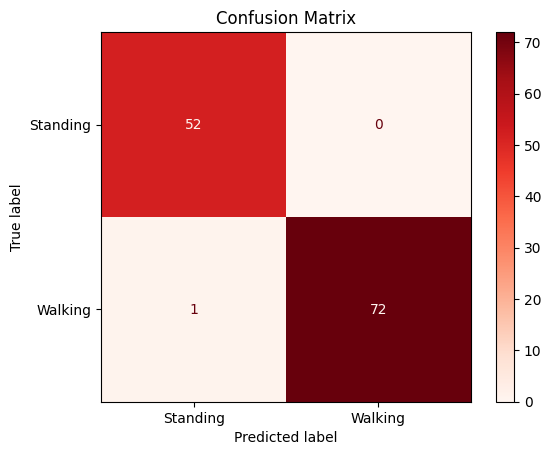

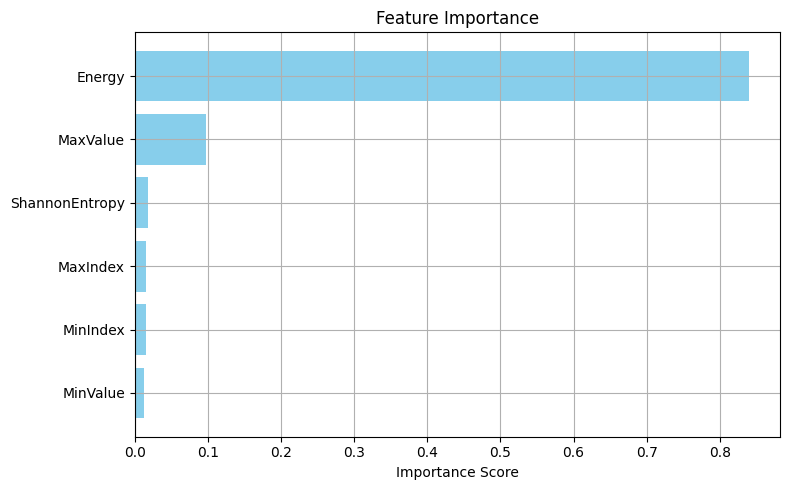

Energy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.7984325379877504e-31


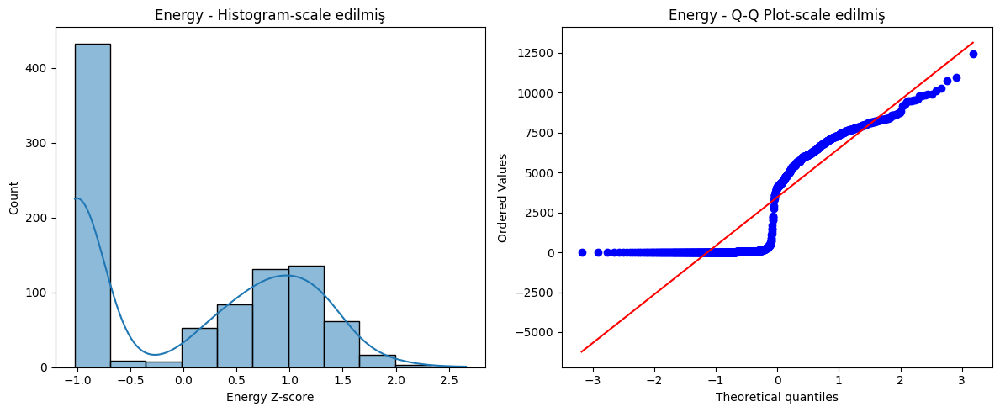

ShannonEntropy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 3.330476389172597e-20


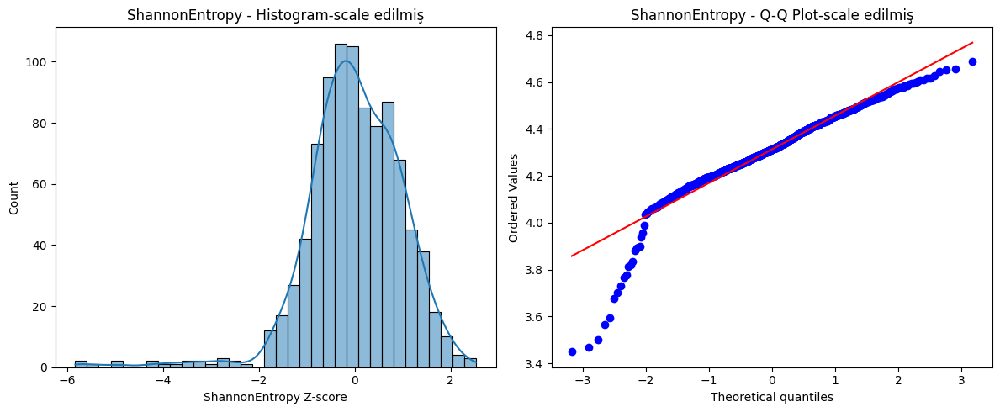

MaxValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.4940827267671087e-28


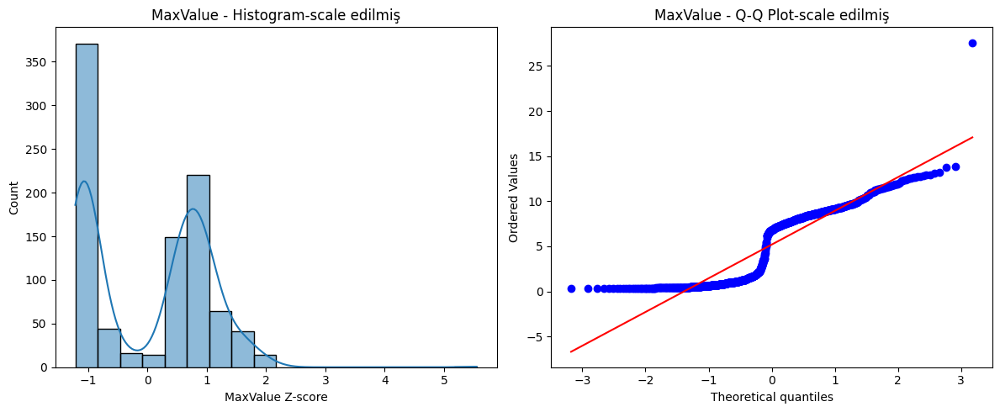

MaxIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 9.787916522452673e-19


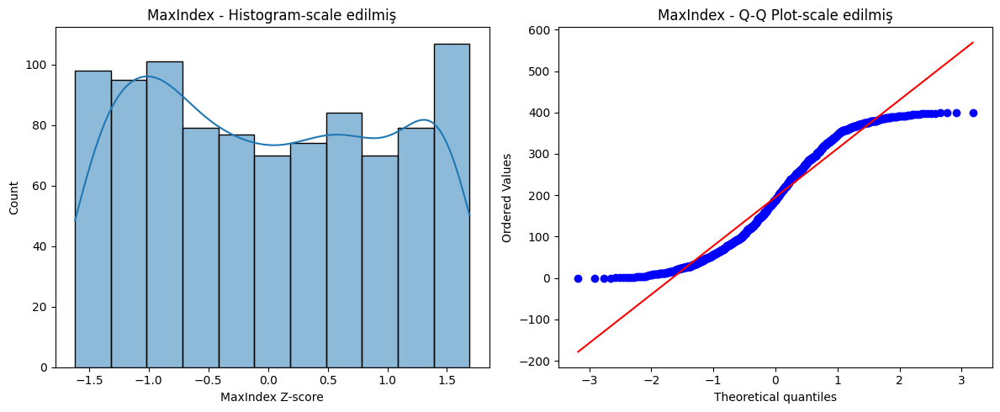

MinValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.9631558497237403e-28


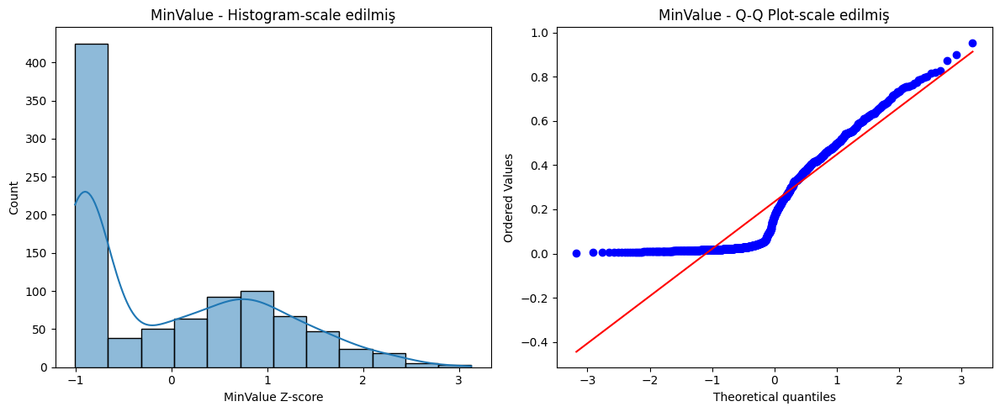

MinIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 3.233676803287365e-17


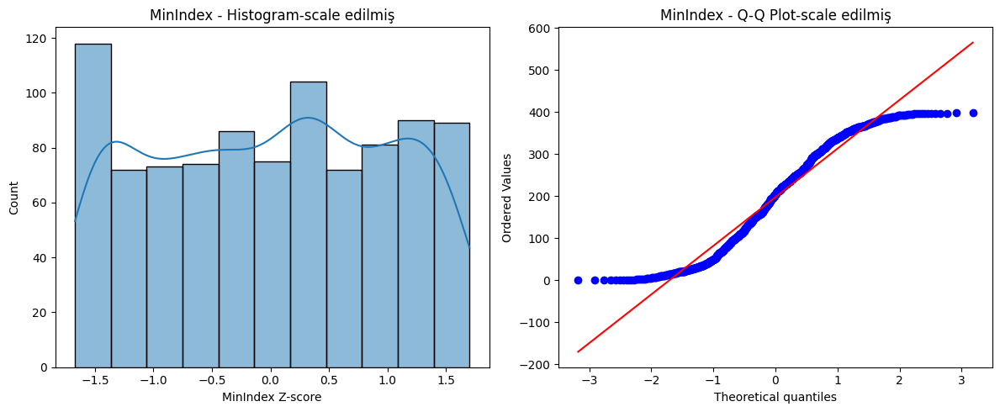

Energy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.798432537987699e-31


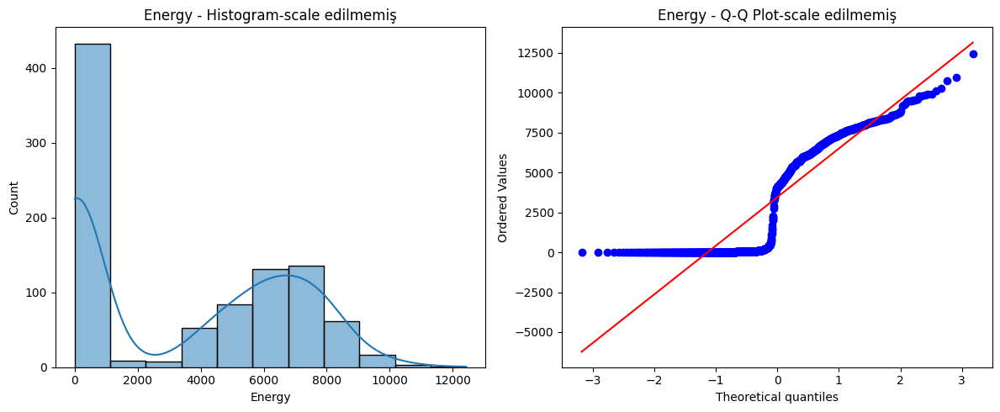

ShannonEntropy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 3.330476389172597e-20


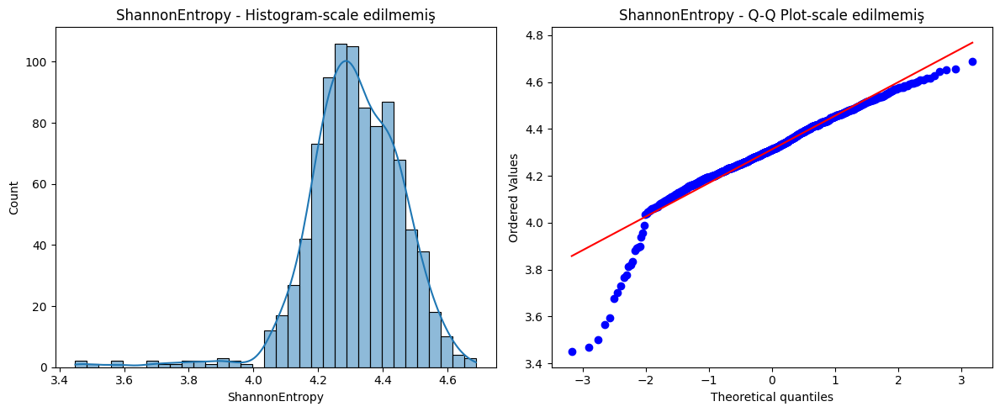

MaxValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.4940827267672262e-28


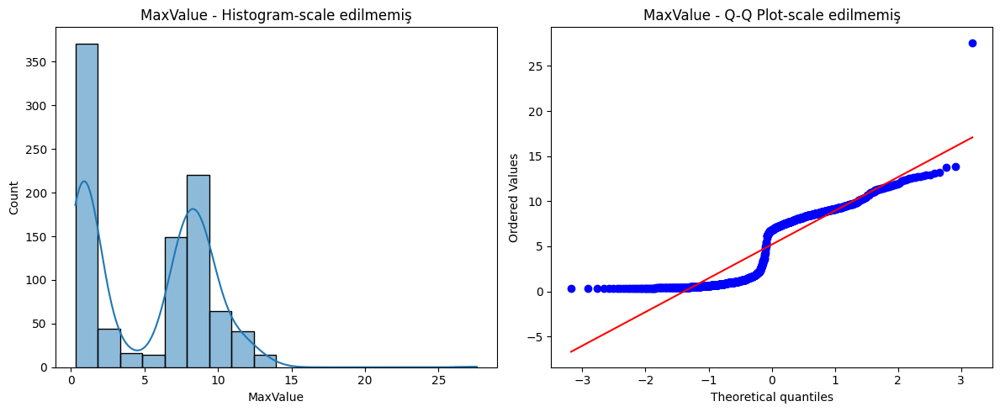

MaxIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 9.787916522452673e-19


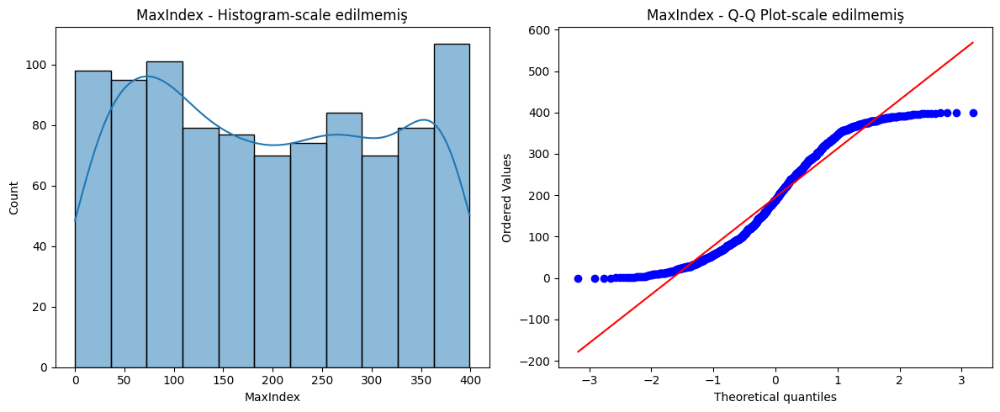

MinValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.9631558497237403e-28


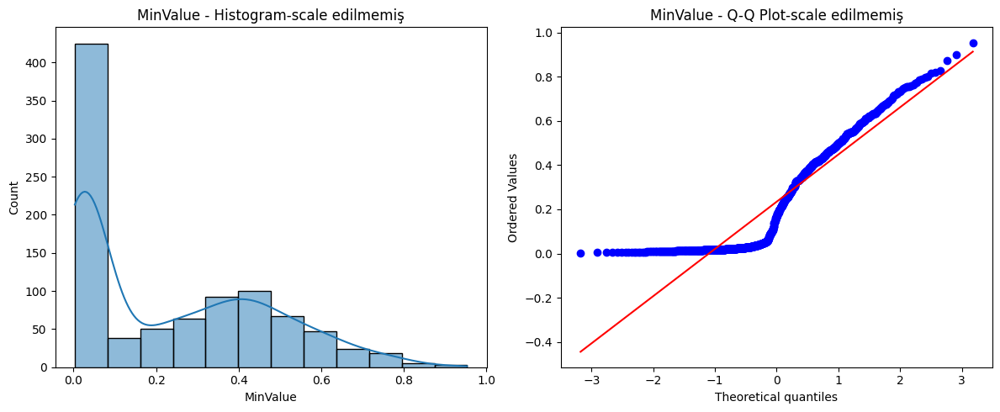

MinIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 3.233676803286829e-17


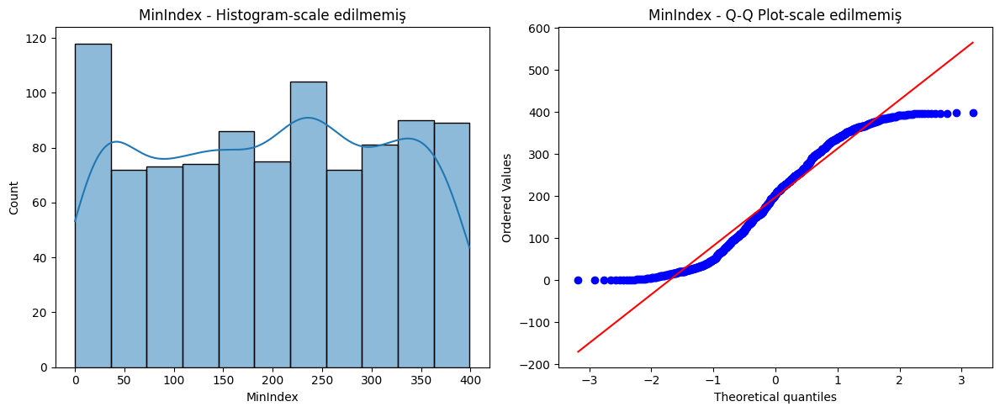


   SVM Sonuçları (Test Subject: subject04):
Accuracy: 0.9789
Precision: 1.0000
Recall: 0.9625
F1 Score: 0.9809
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        62
           1       1.00      0.96      0.98        80

    accuracy                           0.98       142
   macro avg       0.98      0.98      0.98       142
weighted avg       0.98      0.98      0.98       142

[[62  0]
 [ 3 77]]


<Figure size 500x500 with 0 Axes>

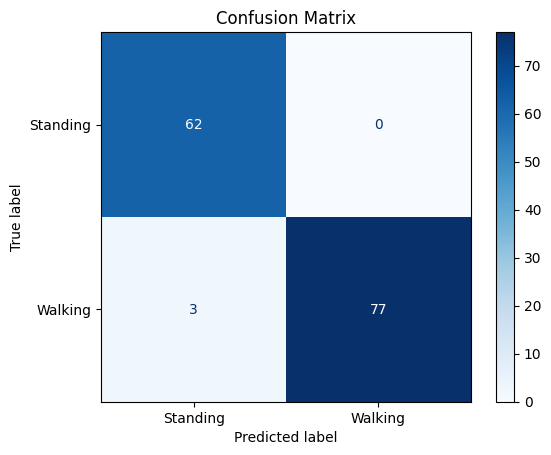


   Random Forest Sonuçları (Test Subject= subject04):
Accuracy: 0.9859
Precision: 1.0000
Recall: 0.9750
F1 Score: 0.9873
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        62
           1       1.00      0.97      0.99        80

    accuracy                           0.99       142
   macro avg       0.98      0.99      0.99       142
weighted avg       0.99      0.99      0.99       142

[[62  0]
 [ 2 78]]


<Figure size 500x500 with 0 Axes>

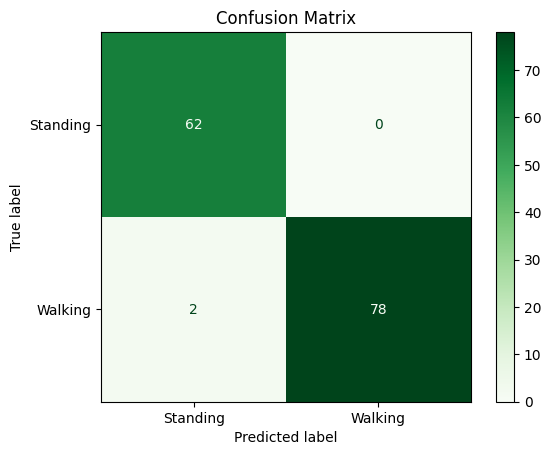

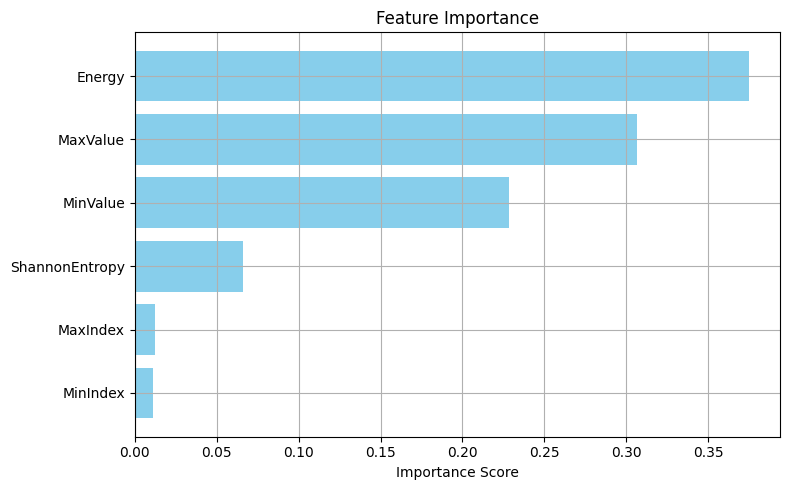


   XGBoost Sonuçları (Test Subject= subject04):
Accuracy: 0.9859
Precision: 1.0000
Recall: 0.9750
F1 Score: 0.9873
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        62
           1       1.00      0.97      0.99        80

    accuracy                           0.99       142
   macro avg       0.98      0.99      0.99       142
weighted avg       0.99      0.99      0.99       142

[[62  0]
 [ 2 78]]


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:11:37] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

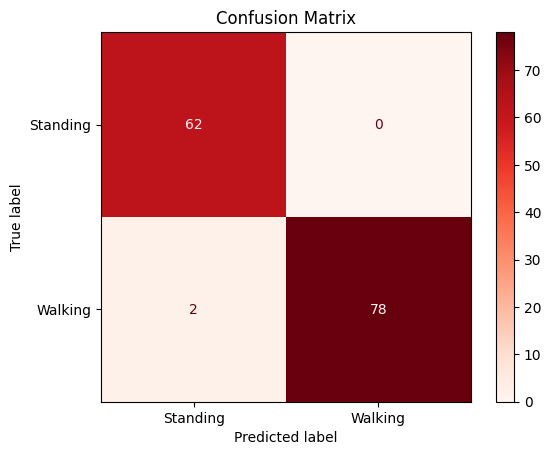

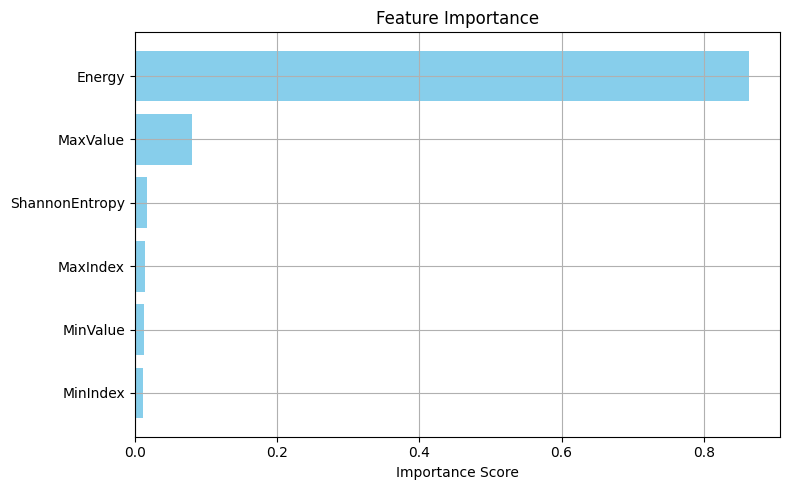

Energy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 5.511086275214594e-31


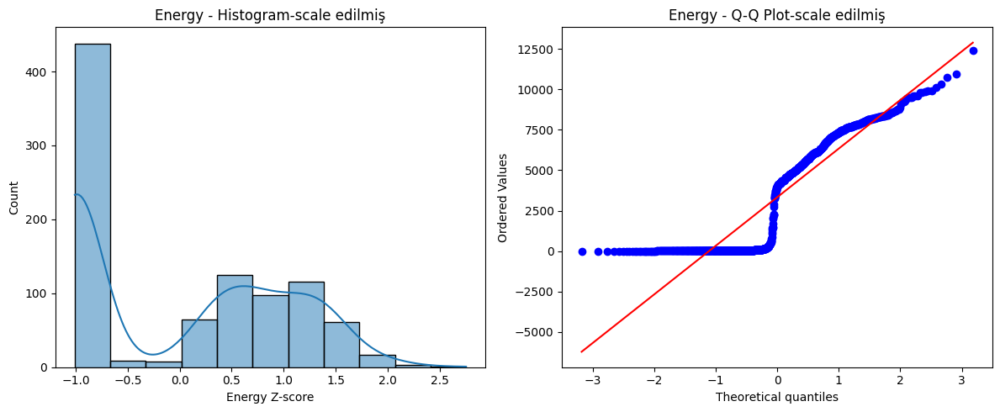

ShannonEntropy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.4271186155026298e-14


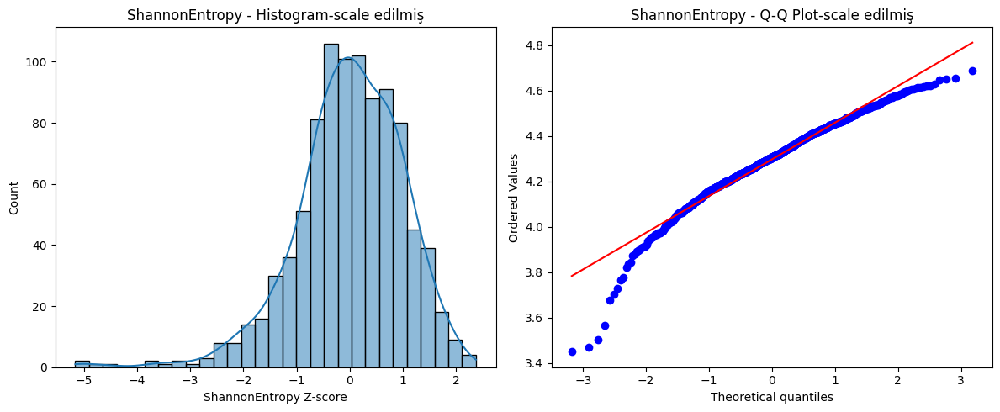

MaxValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.0890218686213736e-27


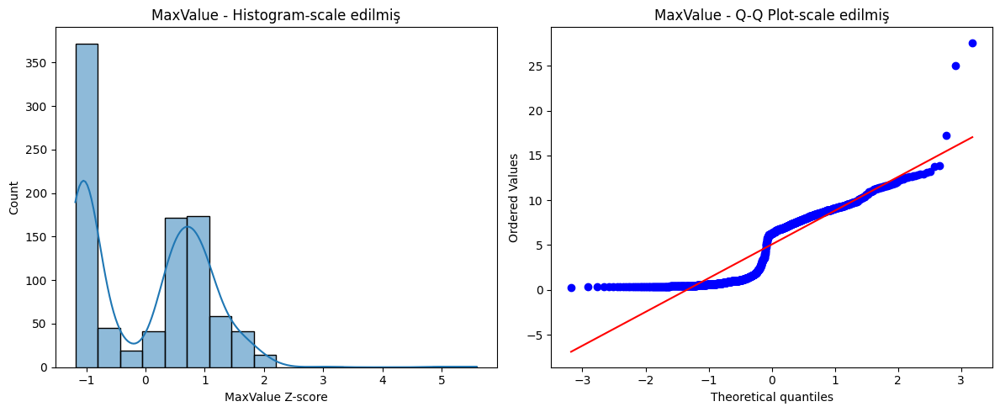

MaxIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.6540141725602165e-18


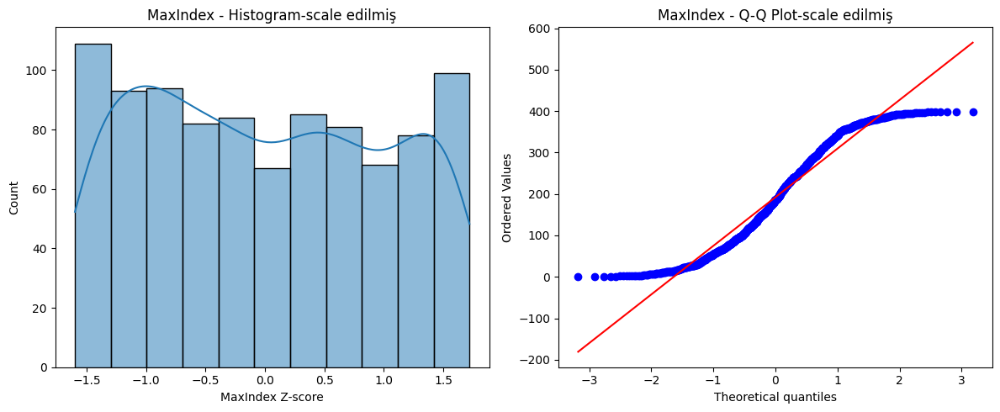

MinValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 6.918043093510368e-29


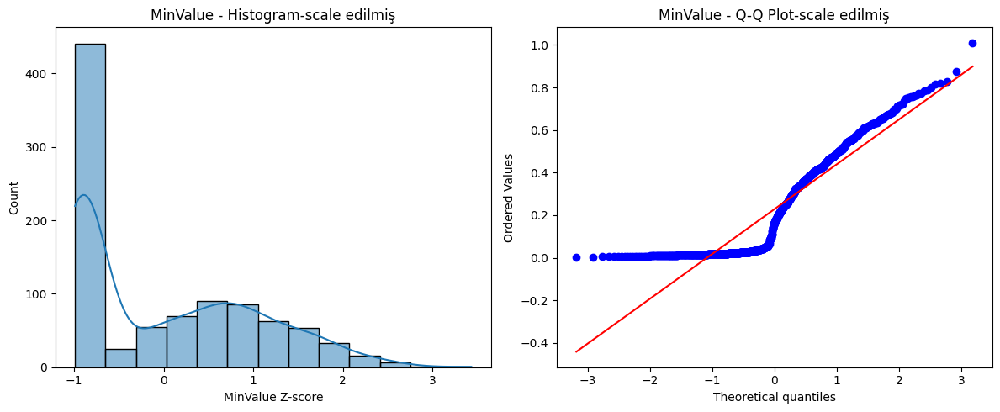

MinIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.0360455046060008e-17


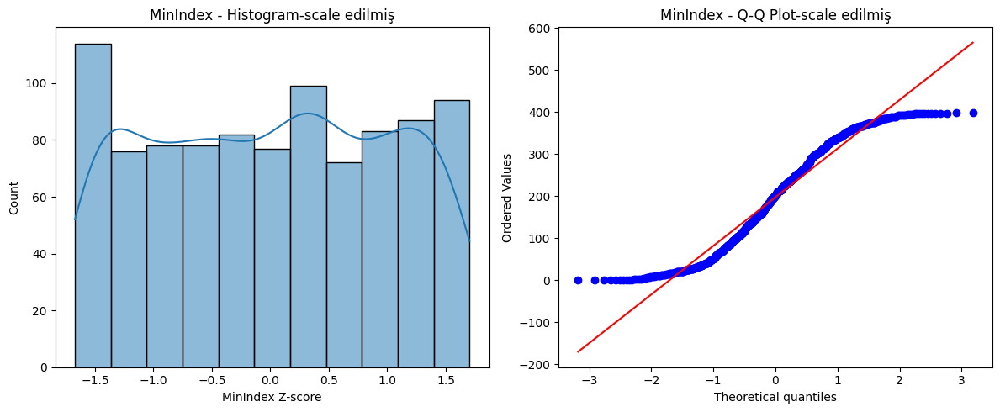

Energy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 5.511086275214594e-31


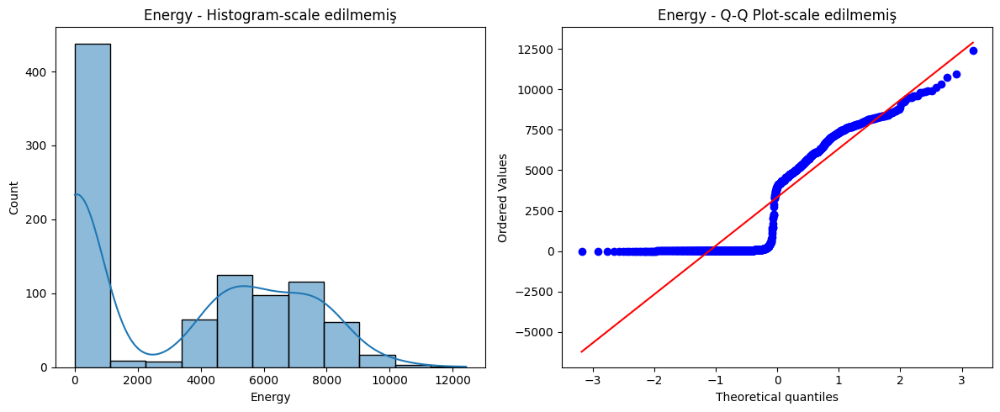

ShannonEntropy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.4271186155026298e-14


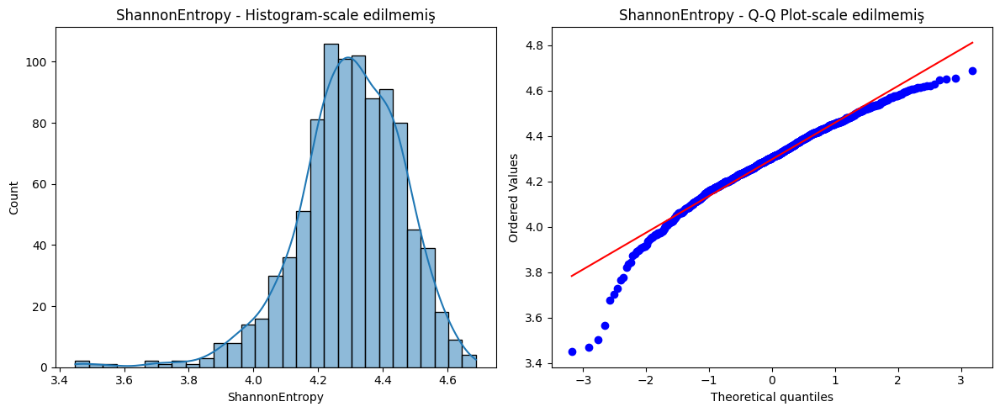

MaxValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.0890218686213736e-27


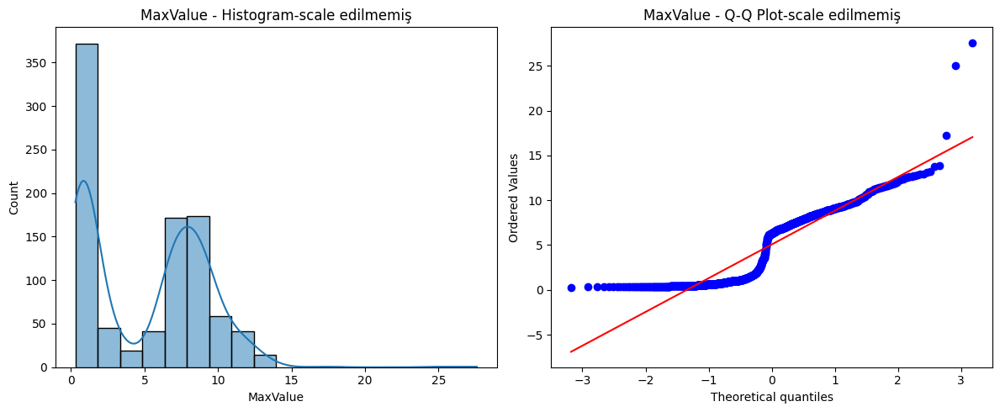

MaxIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.654014172560943e-18


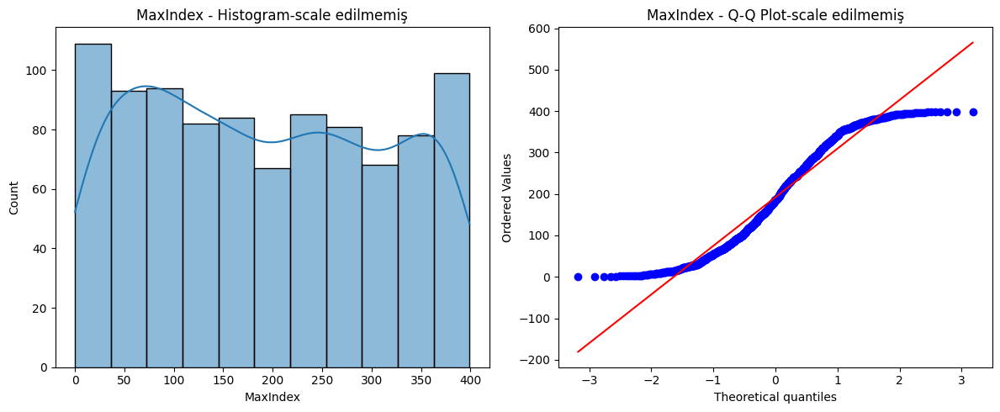

MinValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 6.918043093509377e-29


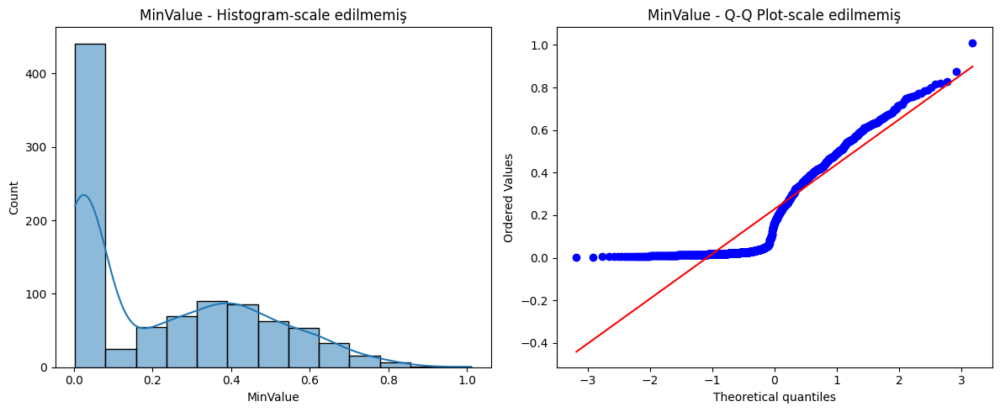

MinIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.0360455046060008e-17


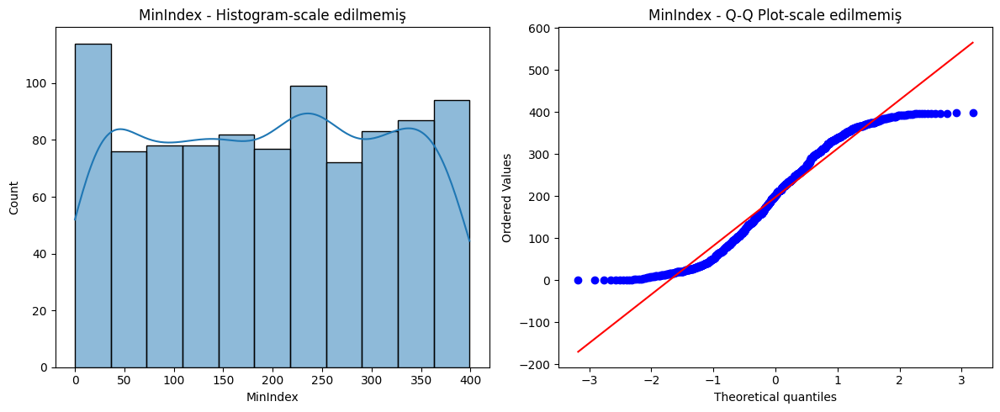


   SVM Sonuçları (Test Subject: subject05):
Accuracy: 0.9779
Precision: 0.9873
Recall: 0.9750
F1 Score: 0.9811
              precision    recall  f1-score   support

           0       0.96      0.98      0.97        56
           1       0.99      0.97      0.98        80

    accuracy                           0.98       136
   macro avg       0.98      0.98      0.98       136
weighted avg       0.98      0.98      0.98       136

[[55  1]
 [ 2 78]]


<Figure size 500x500 with 0 Axes>

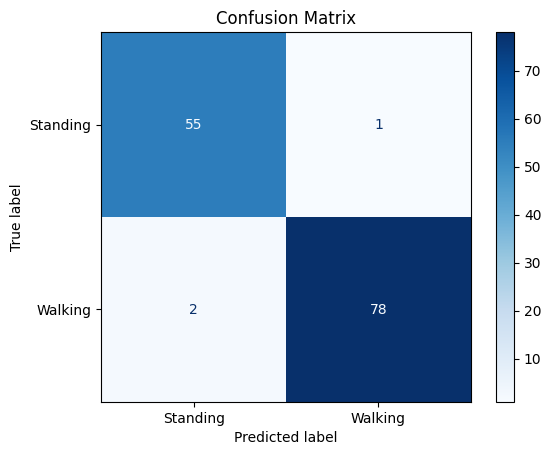


   Random Forest Sonuçları (Test Subject= subject05):
Accuracy: 0.9779
Precision: 1.0000
Recall: 0.9625
F1 Score: 0.9809
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        56
           1       1.00      0.96      0.98        80

    accuracy                           0.98       136
   macro avg       0.97      0.98      0.98       136
weighted avg       0.98      0.98      0.98       136

[[56  0]
 [ 3 77]]


<Figure size 500x500 with 0 Axes>

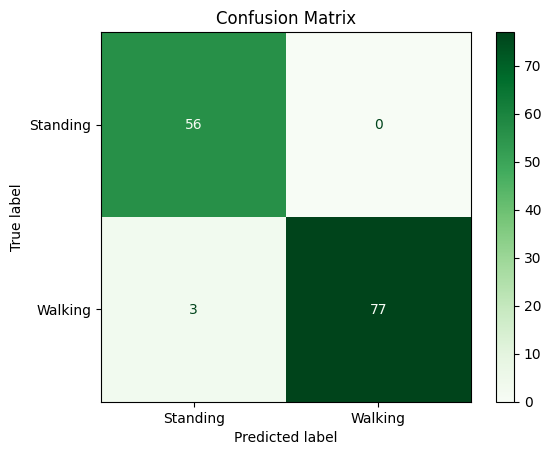

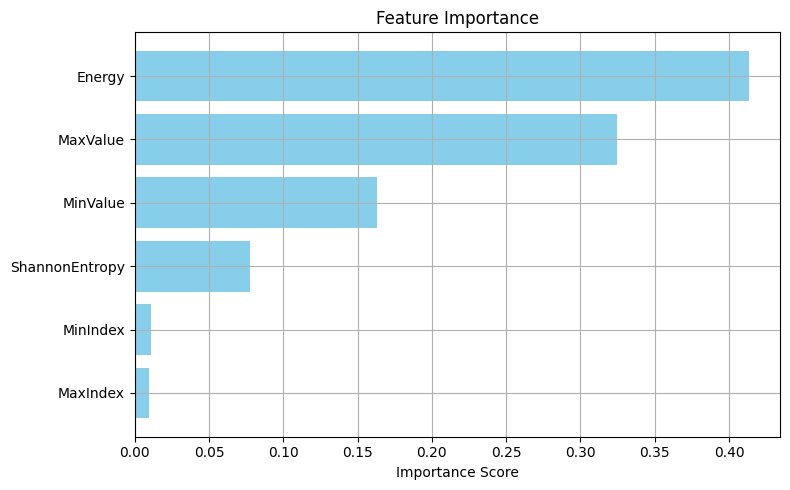


   XGBoost Sonuçları (Test Subject= subject05):
Accuracy: 0.9706
Precision: 0.9872
Recall: 0.9625
F1 Score: 0.9747
              precision    recall  f1-score   support

           0       0.95      0.98      0.96        56
           1       0.99      0.96      0.97        80

    accuracy                           0.97       136
   macro avg       0.97      0.97      0.97       136
weighted avg       0.97      0.97      0.97       136

[[55  1]
 [ 3 77]]


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:11:42] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

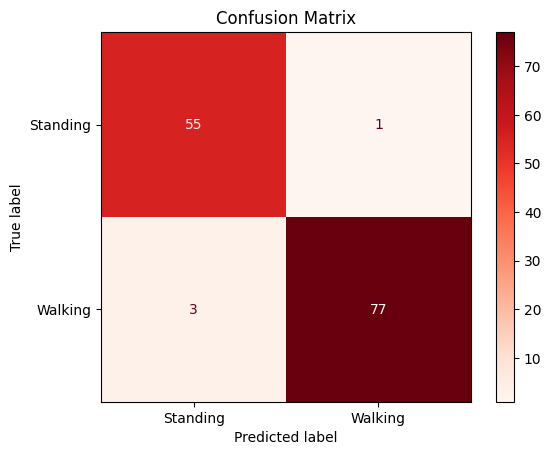

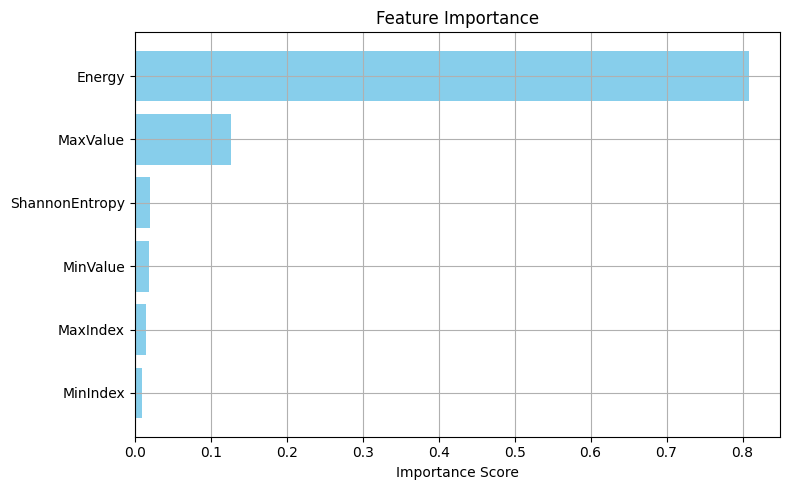

Energy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 7.31322066086862e-32


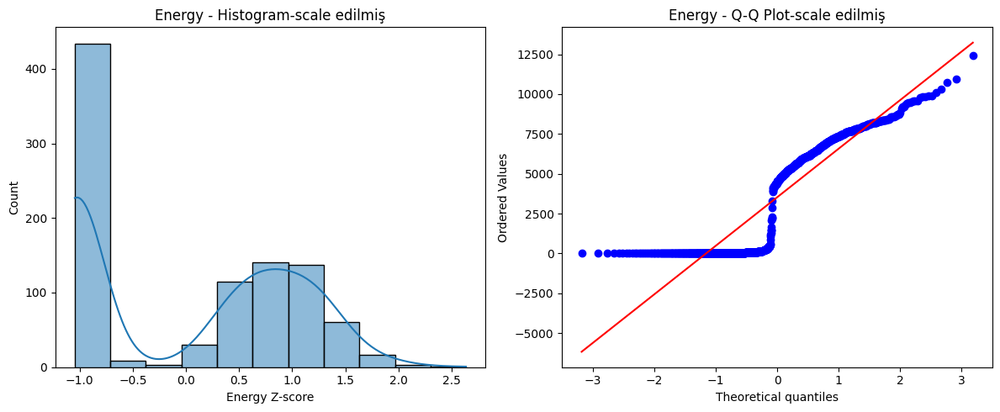

ShannonEntropy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 5.853664575712987e-14


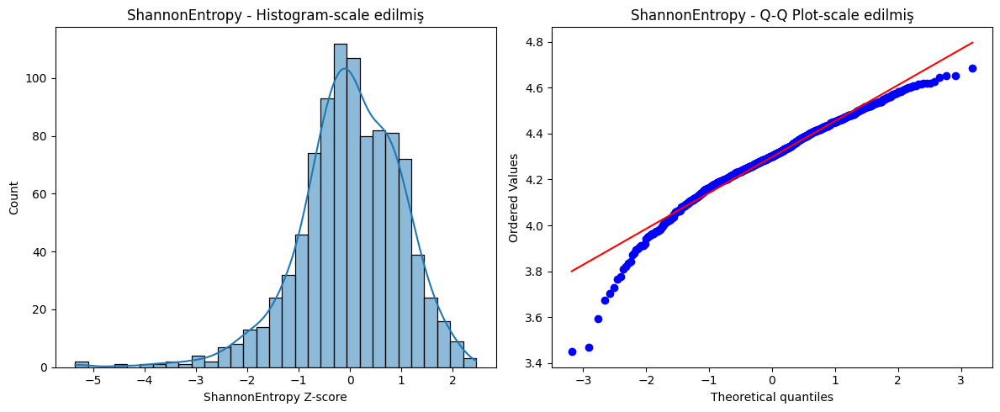

MaxValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 9.367045368377177e-28


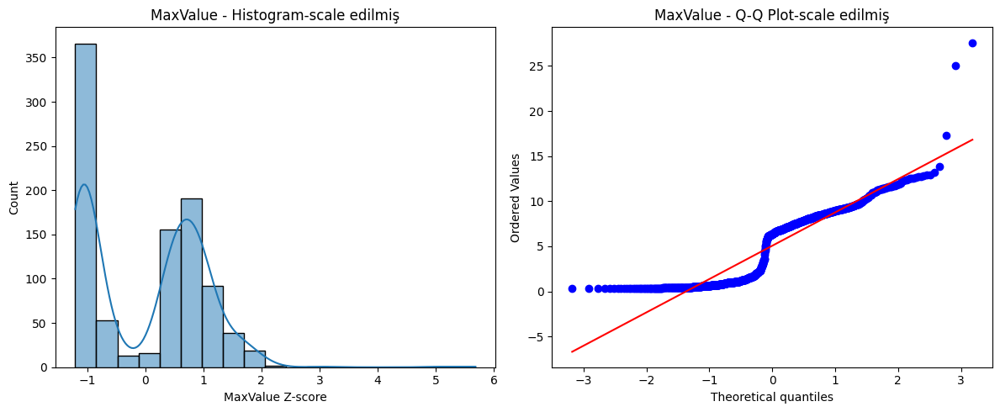

MaxIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.134856985301992e-18


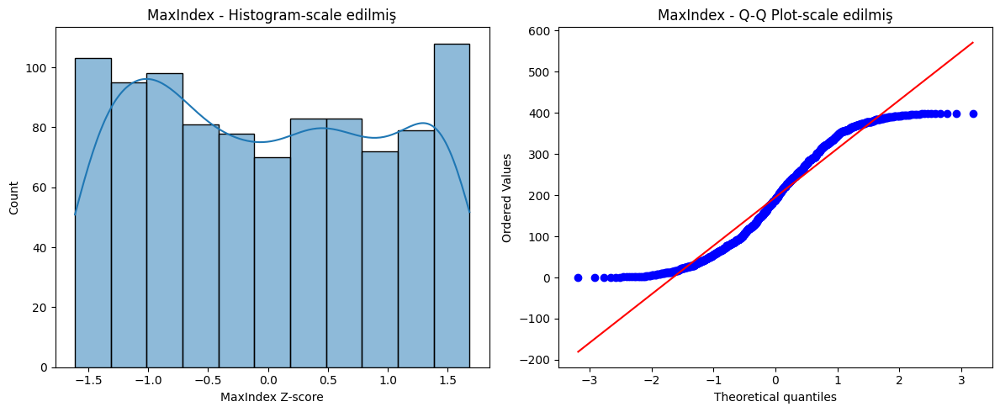

MinValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.930738943515929e-28


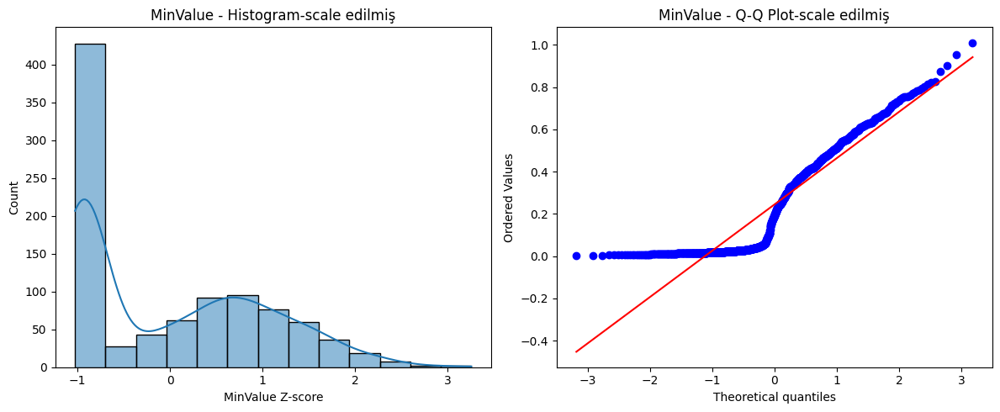

MinIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.395576792405841e-17


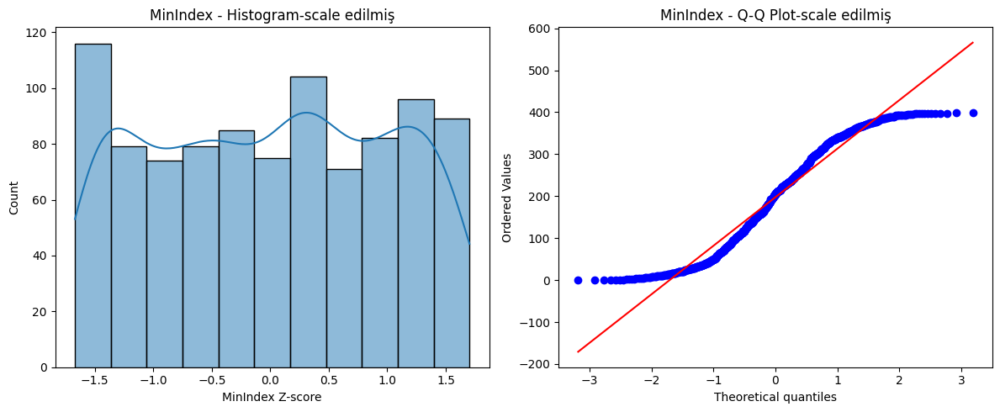

Energy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 7.313220660868515e-32


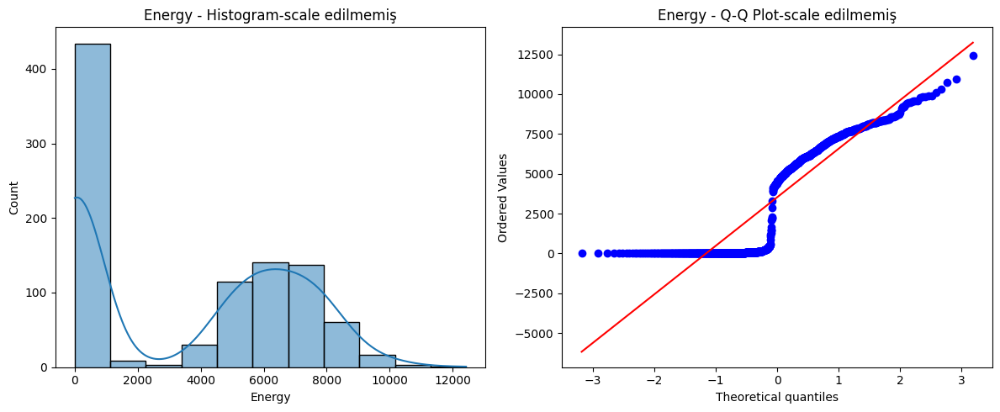

ShannonEntropy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 5.853664575712183e-14


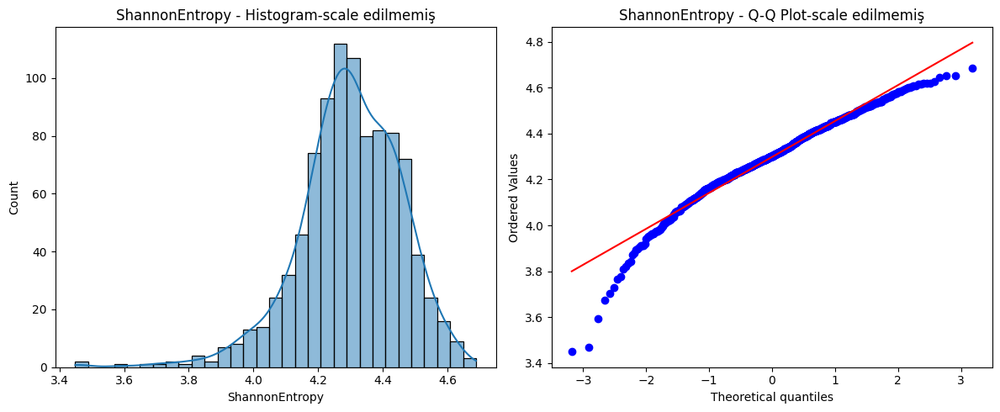

MaxValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 9.367045368377177e-28


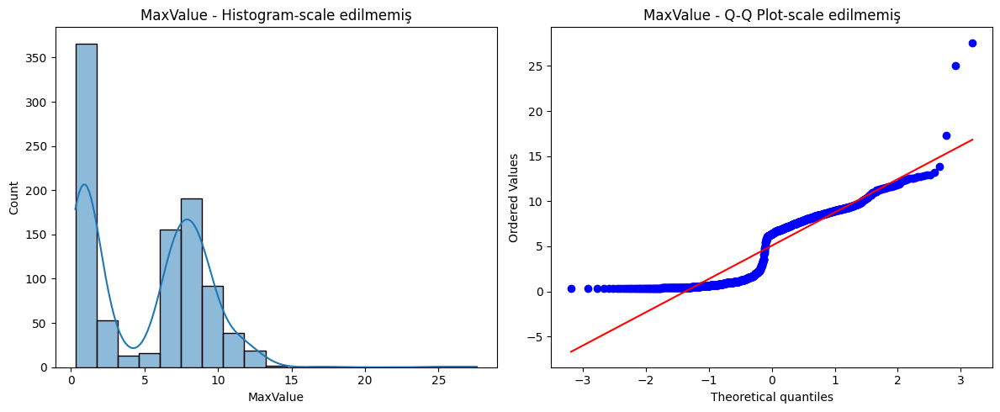

MaxIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.1348569853024575e-18


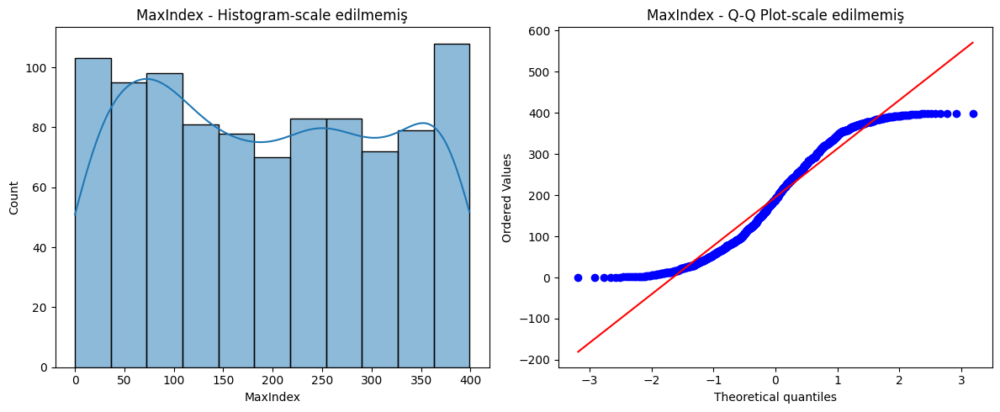

MinValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.930738943515929e-28


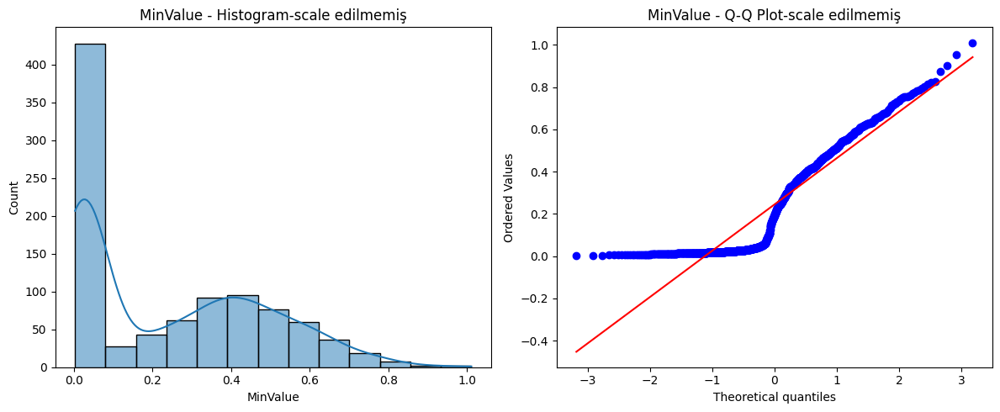

MinIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.395576792405841e-17


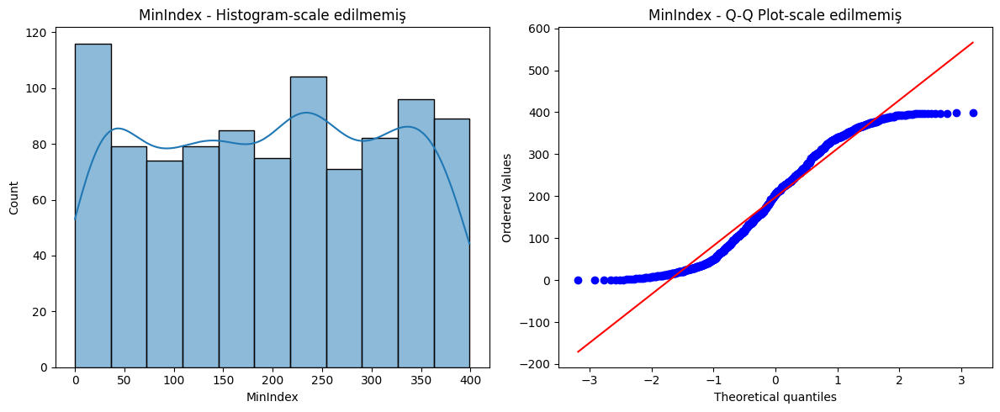


   SVM Sonuçları (Test Subject: subject06):
Accuracy: 0.9841
Precision: 0.9846
Recall: 0.9846
F1 Score: 0.9846
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        61
           1       0.98      0.98      0.98        65

    accuracy                           0.98       126
   macro avg       0.98      0.98      0.98       126
weighted avg       0.98      0.98      0.98       126

[[60  1]
 [ 1 64]]


<Figure size 500x500 with 0 Axes>

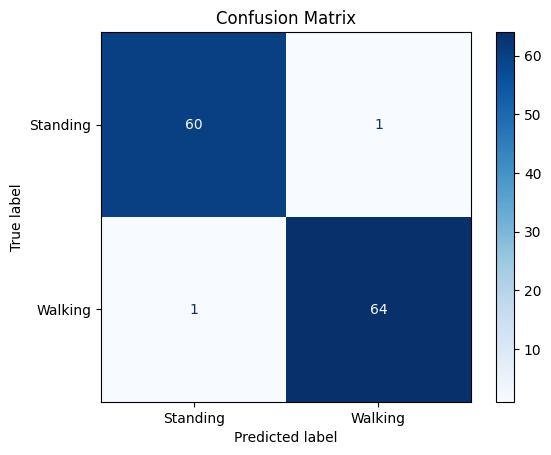


   Random Forest Sonuçları (Test Subject= subject06):
Accuracy: 0.9762
Precision: 0.9697
Recall: 0.9846
F1 Score: 0.9771
              precision    recall  f1-score   support

           0       0.98      0.97      0.98        61
           1       0.97      0.98      0.98        65

    accuracy                           0.98       126
   macro avg       0.98      0.98      0.98       126
weighted avg       0.98      0.98      0.98       126

[[59  2]
 [ 1 64]]


<Figure size 500x500 with 0 Axes>

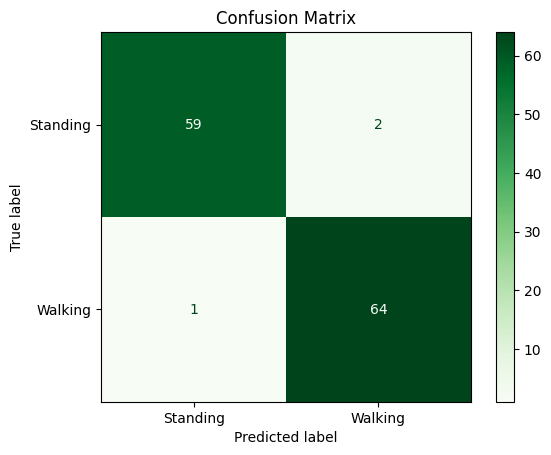

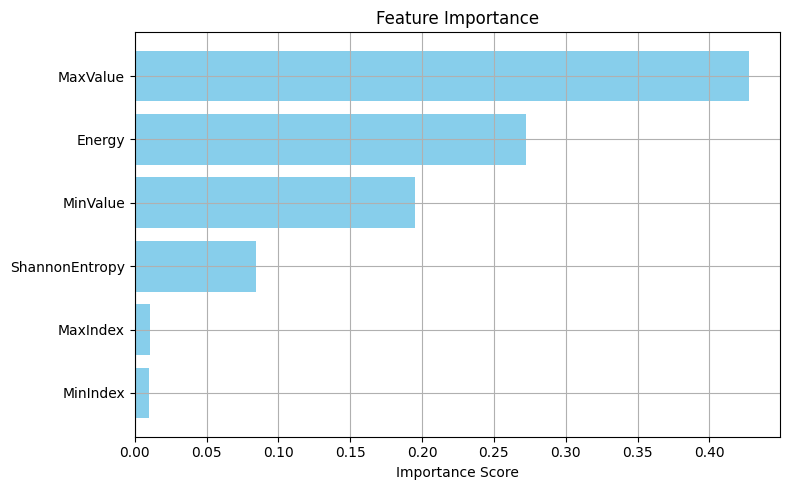


   XGBoost Sonuçları (Test Subject= subject06):
Accuracy: 0.9762
Precision: 0.9697
Recall: 0.9846
F1 Score: 0.9771
              precision    recall  f1-score   support

           0       0.98      0.97      0.98        61
           1       0.97      0.98      0.98        65

    accuracy                           0.98       126
   macro avg       0.98      0.98      0.98       126
weighted avg       0.98      0.98      0.98       126

[[59  2]
 [ 1 64]]


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:11:48] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

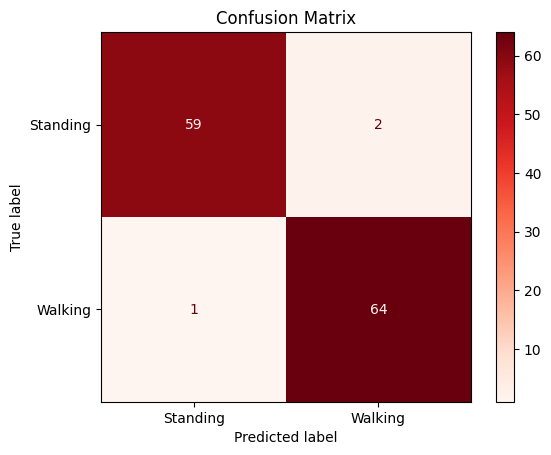

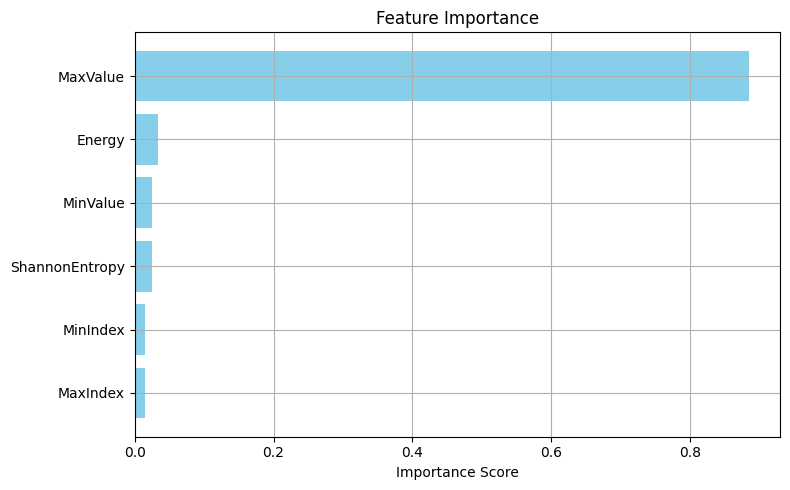

Energy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 4.2787716131580685e-31


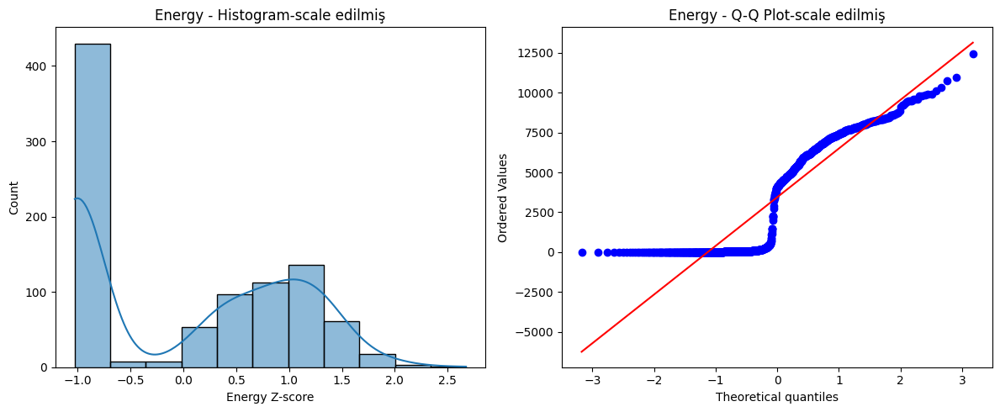

ShannonEntropy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 3.740598650157899e-15


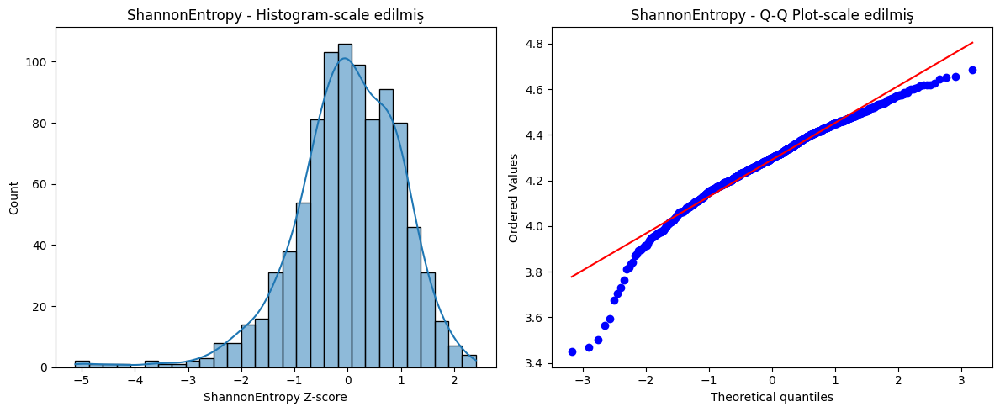

MaxValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.1514580677413508e-29


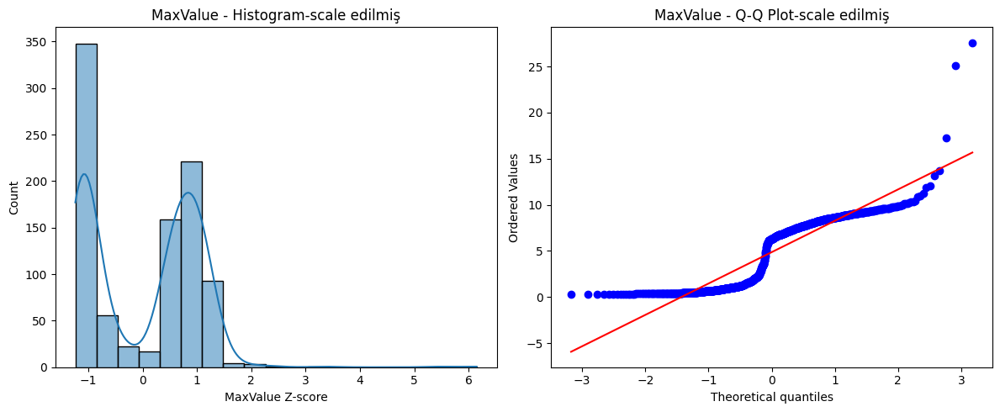

MaxIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.6216429706560587e-18


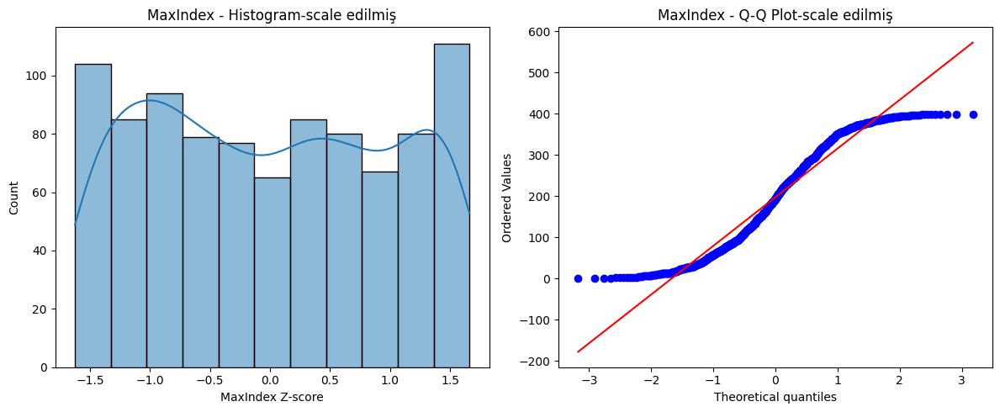

MinValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 4.840557476886843e-28


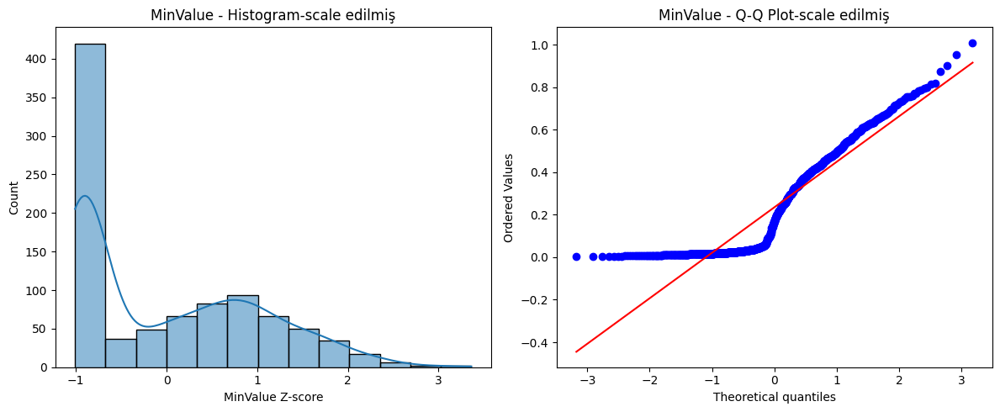

MinIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.3528814306265724e-17


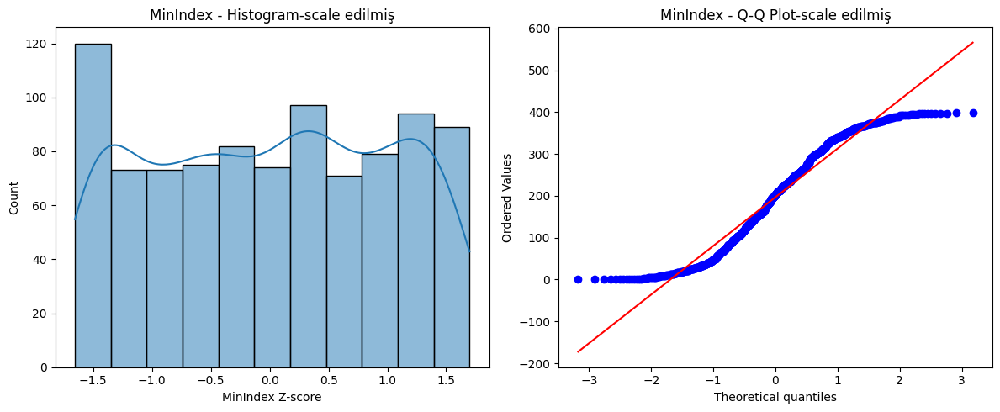

Energy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 4.2787716131580685e-31


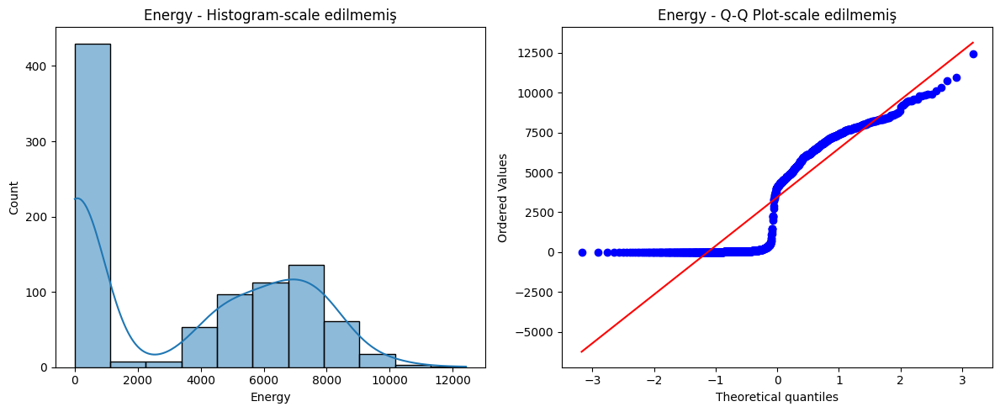

ShannonEntropy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 3.740598650157481e-15


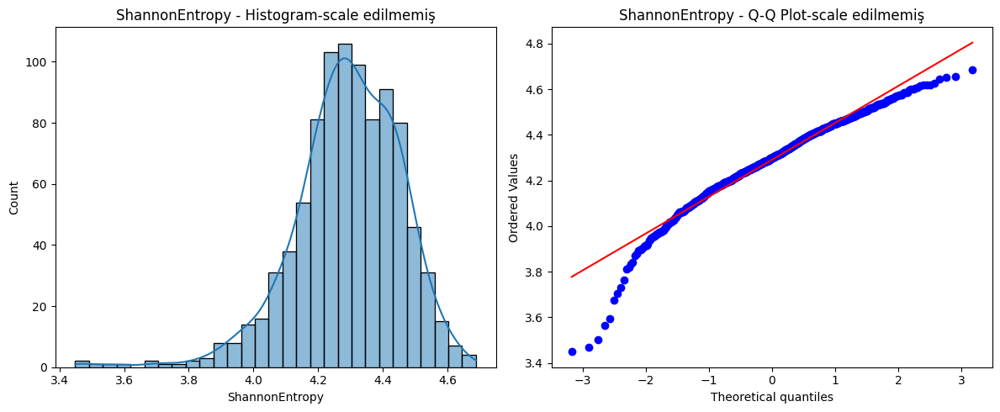

MaxValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.151458067741474e-29


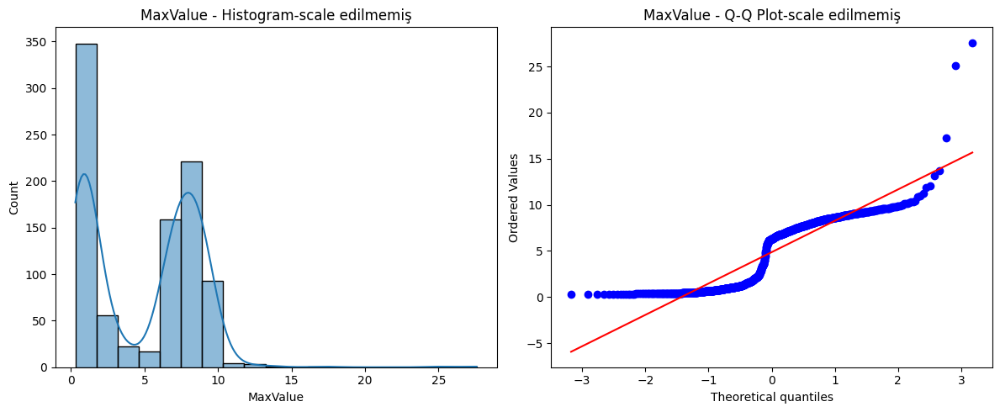

MaxIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.6216429706556036e-18


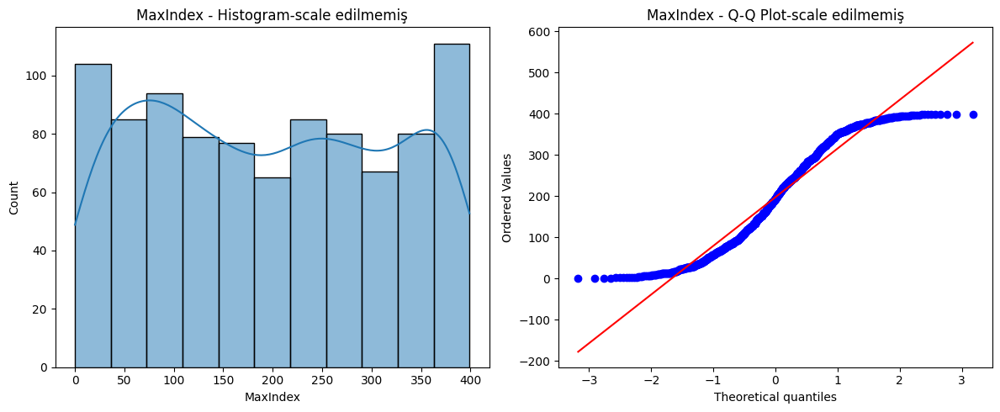

MinValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 4.840557476886843e-28


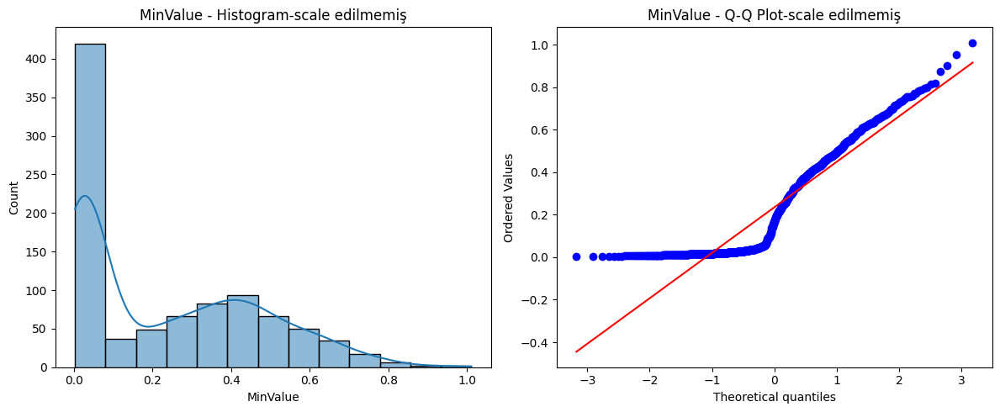

MinIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.3528814306263485e-17


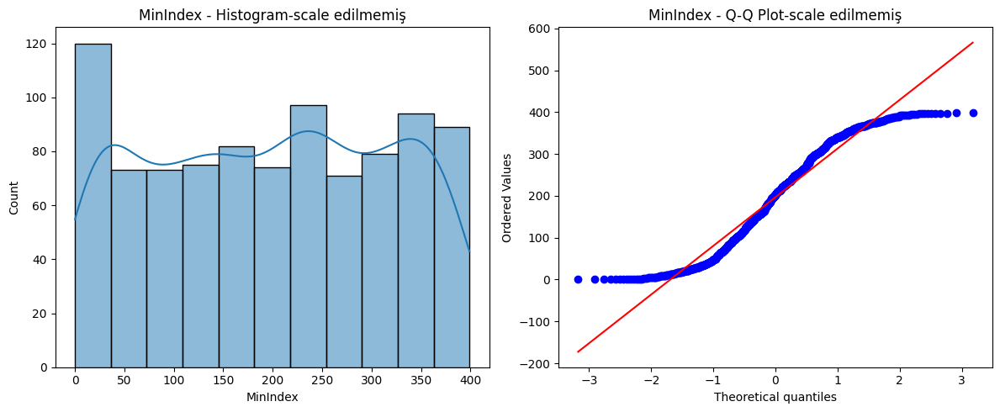


   SVM Sonuçları (Test Subject: subject07):
Accuracy: 0.9866
Precision: 1.0000
Recall: 0.9762
F1 Score: 0.9880
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        65
           1       1.00      0.98      0.99        84

    accuracy                           0.99       149
   macro avg       0.99      0.99      0.99       149
weighted avg       0.99      0.99      0.99       149

[[65  0]
 [ 2 82]]


<Figure size 500x500 with 0 Axes>

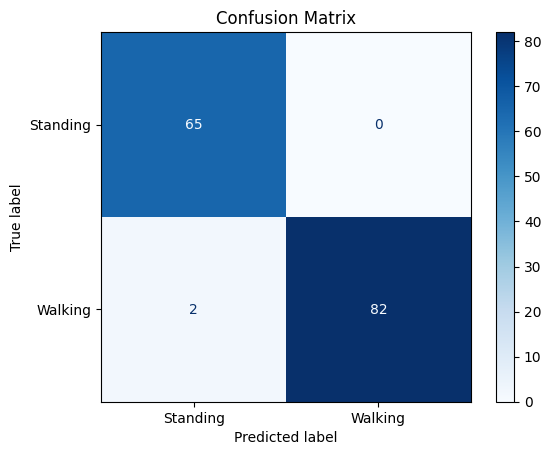


   Random Forest Sonuçları (Test Subject= subject07):
Accuracy: 0.9866
Precision: 1.0000
Recall: 0.9762
F1 Score: 0.9880
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        65
           1       1.00      0.98      0.99        84

    accuracy                           0.99       149
   macro avg       0.99      0.99      0.99       149
weighted avg       0.99      0.99      0.99       149

[[65  0]
 [ 2 82]]


<Figure size 500x500 with 0 Axes>

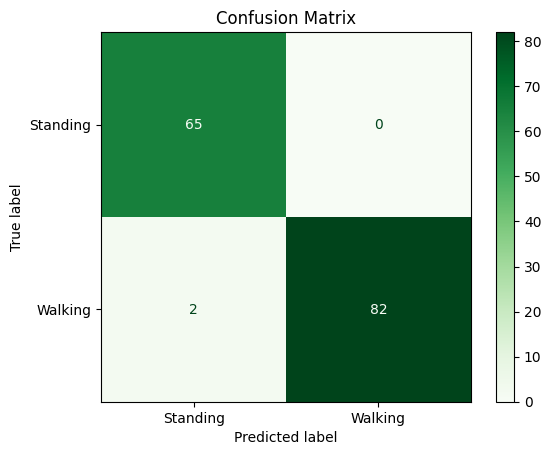

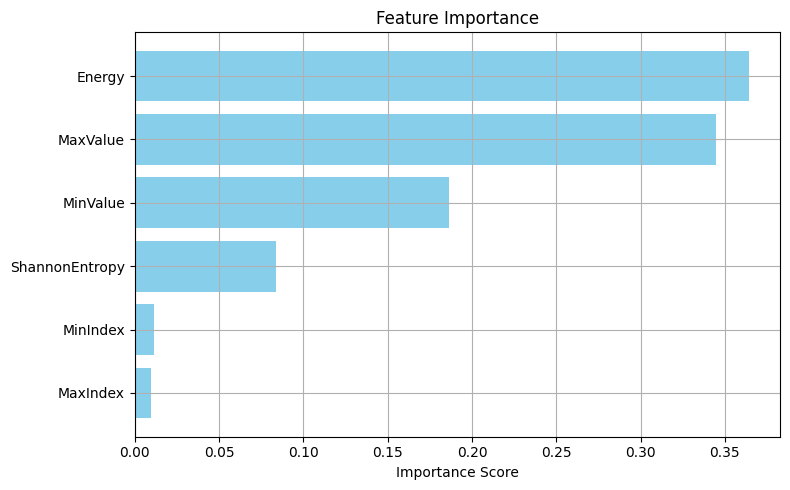


   XGBoost Sonuçları (Test Subject= subject07):
Accuracy: 0.9799
Precision: 0.9880
Recall: 0.9762
F1 Score: 0.9820
              precision    recall  f1-score   support

           0       0.97      0.98      0.98        65
           1       0.99      0.98      0.98        84

    accuracy                           0.98       149
   macro avg       0.98      0.98      0.98       149
weighted avg       0.98      0.98      0.98       149

[[64  1]
 [ 2 82]]


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:11:54] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

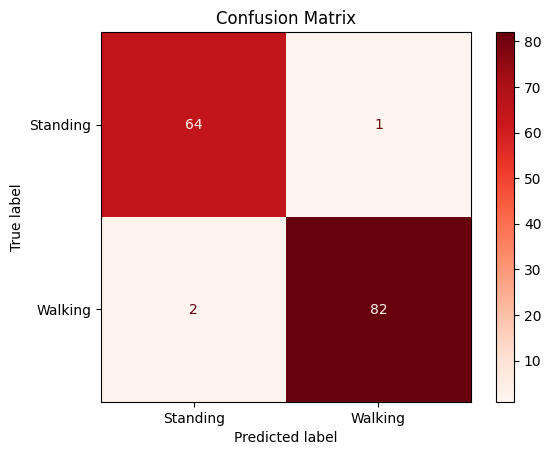

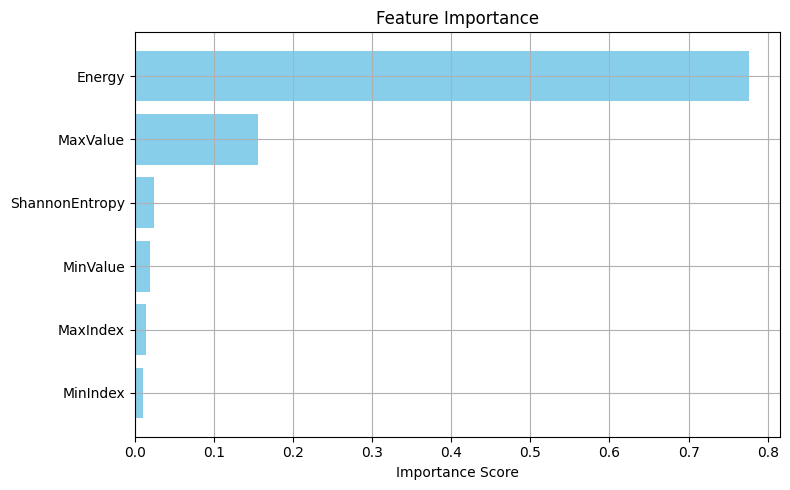

Energy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.49101796795745e-30


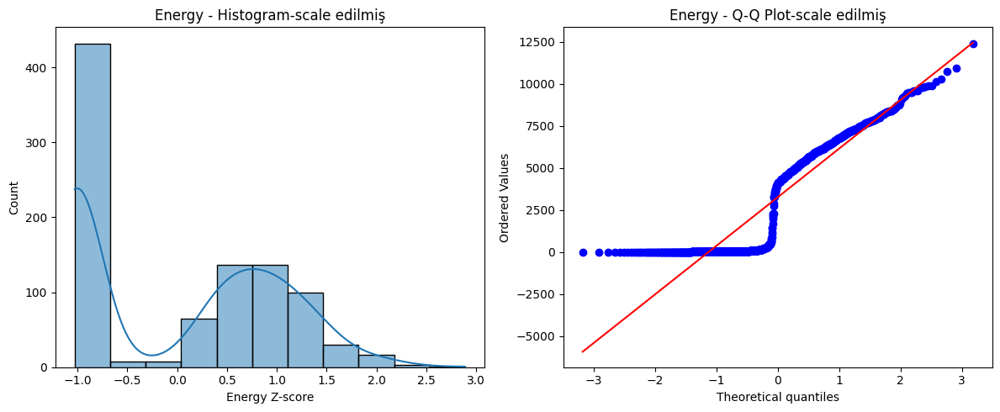

ShannonEntropy (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.146448196394586e-15


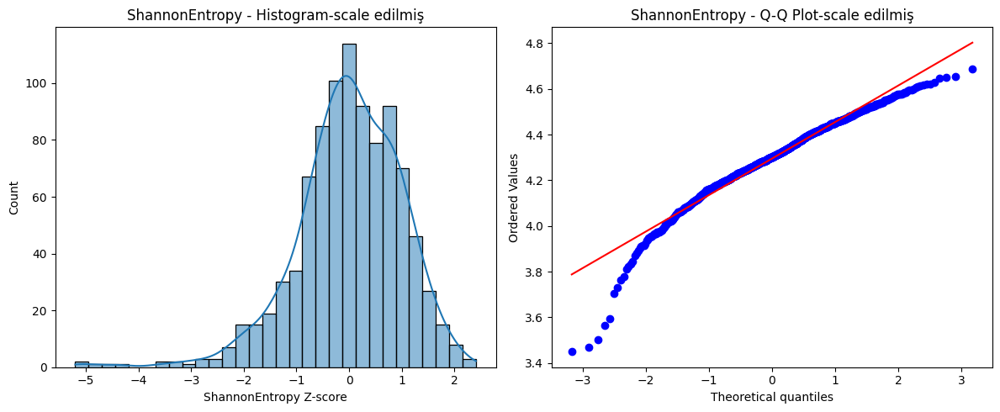

MaxValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 8.522509128871065e-27


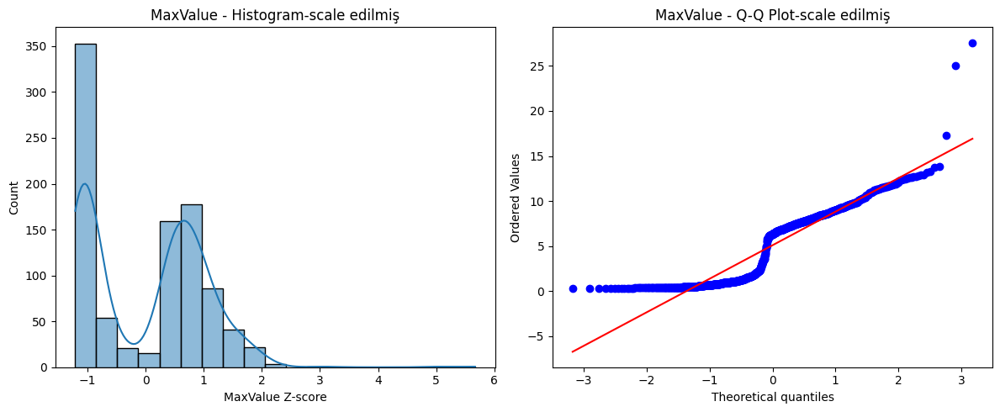

MaxIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.0199621935219828e-18


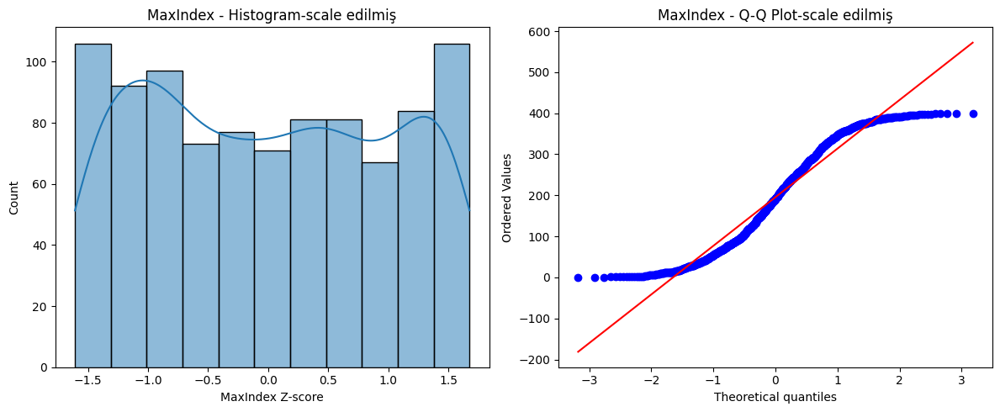

MinValue (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 3.4220846795965034e-28


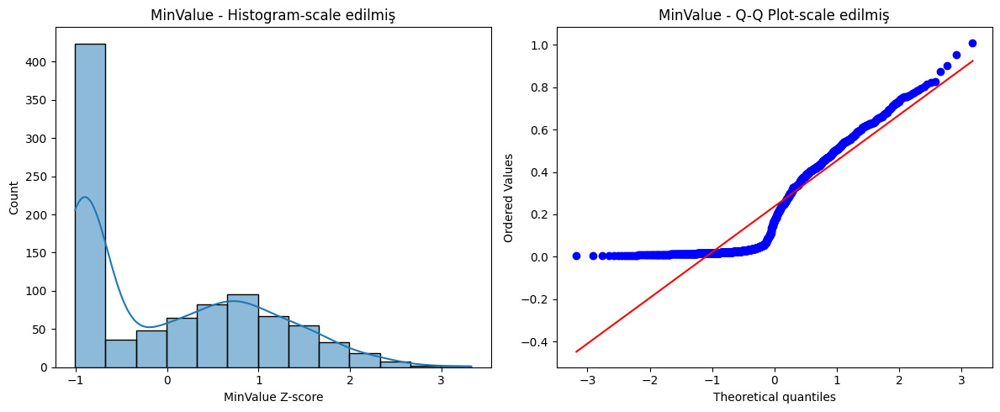

MinIndex (scale edilmiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 8.562433644532992e-18


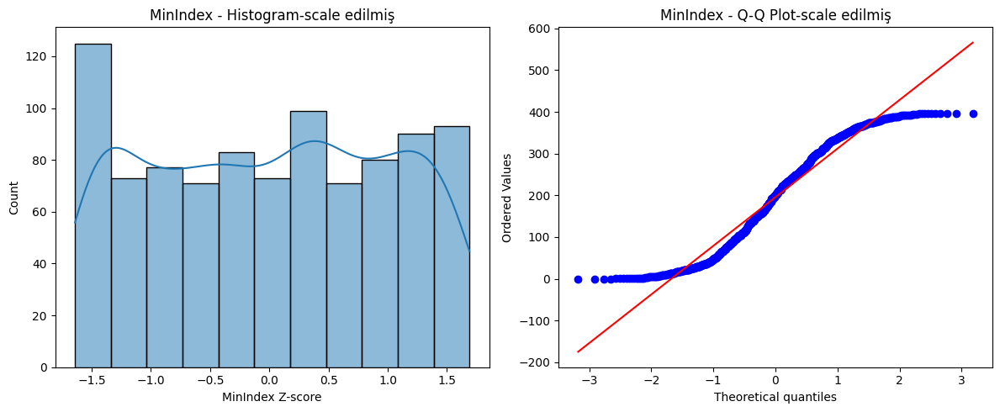

Energy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.4910179679575994e-30


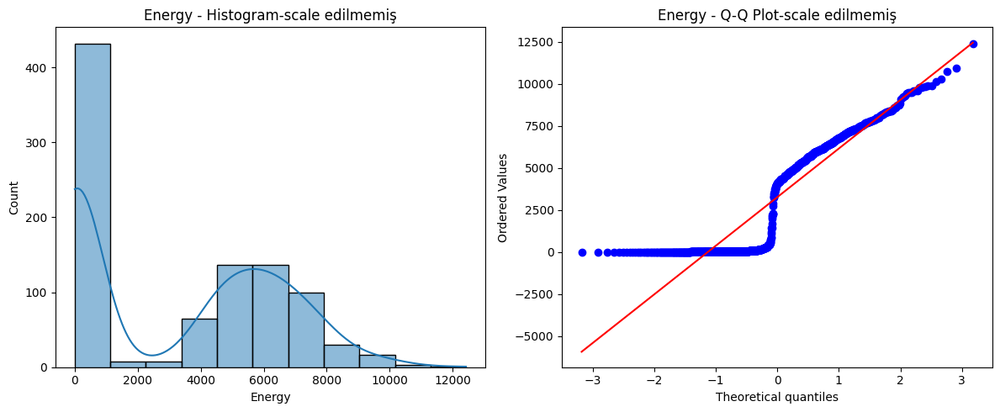

ShannonEntropy (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 2.146448196394586e-15


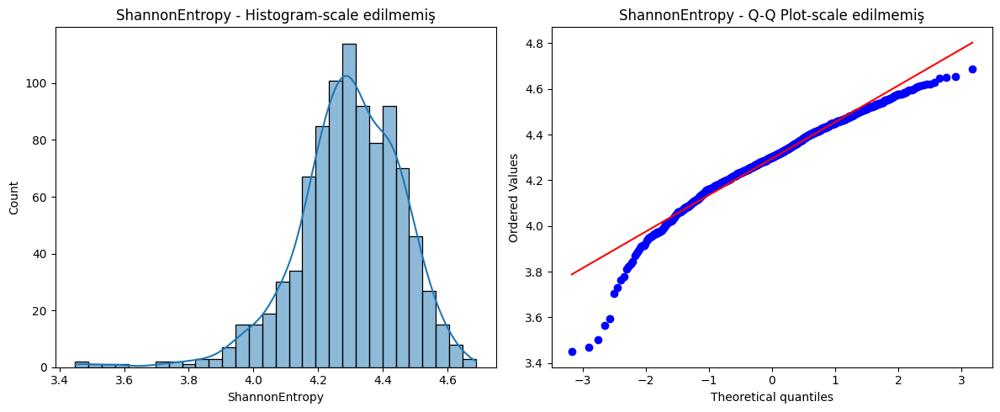

MaxValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 8.522509128871065e-27


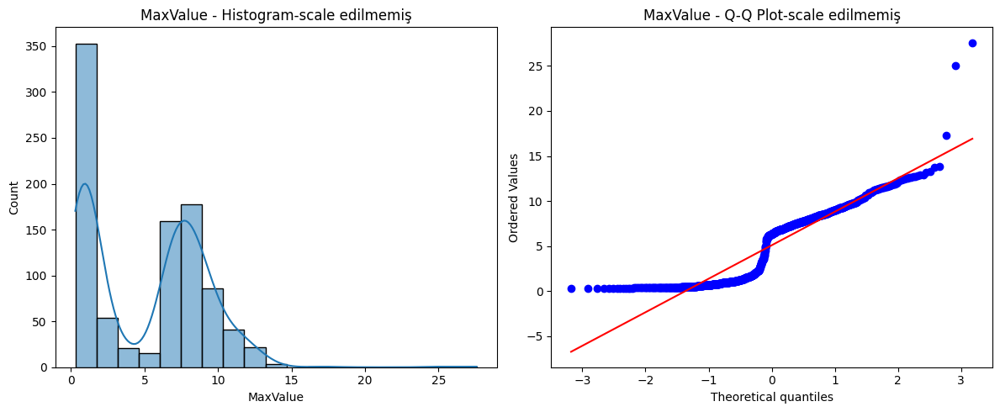

MaxIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 1.019962193521836e-18


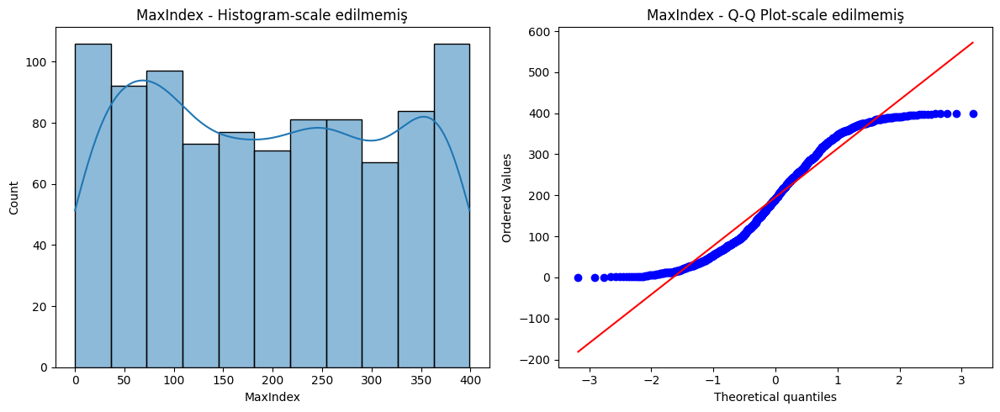

MinValue (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 3.42208467959643e-28


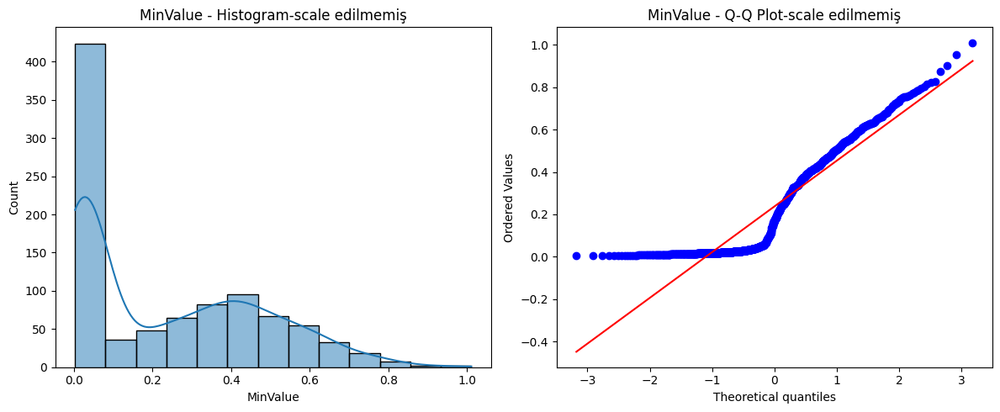

MinIndex (scale edilmemiş features üzerinden): p= 0.0000 --> Normal değil 
P değeri: 8.562433644532992e-18


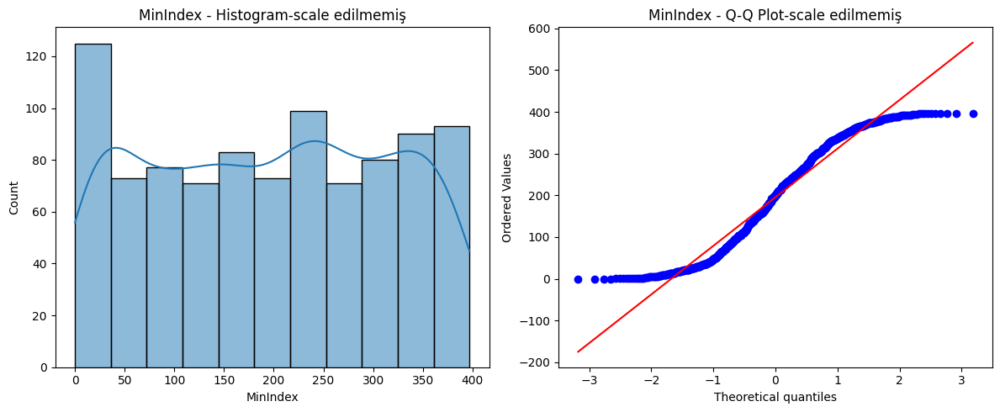


   SVM Sonuçları (Test Subject: subject08):
Accuracy: 0.9787
Precision: 1.0000
Recall: 0.9615
F1 Score: 0.9804
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        63
           1       1.00      0.96      0.98        78

    accuracy                           0.98       141
   macro avg       0.98      0.98      0.98       141
weighted avg       0.98      0.98      0.98       141

[[63  0]
 [ 3 75]]


<Figure size 500x500 with 0 Axes>

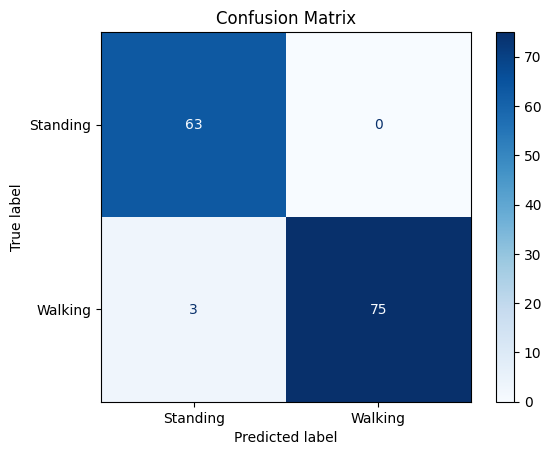


   Random Forest Sonuçları (Test Subject= subject08):
Accuracy: 0.9858
Precision: 1.0000
Recall: 0.9744
F1 Score: 0.9870
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        63
           1       1.00      0.97      0.99        78

    accuracy                           0.99       141
   macro avg       0.98      0.99      0.99       141
weighted avg       0.99      0.99      0.99       141

[[63  0]
 [ 2 76]]


<Figure size 500x500 with 0 Axes>

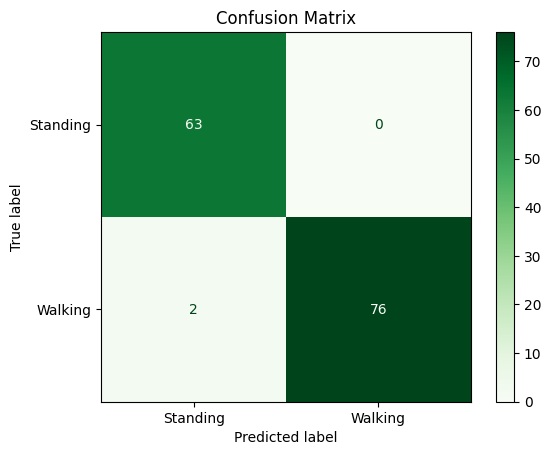

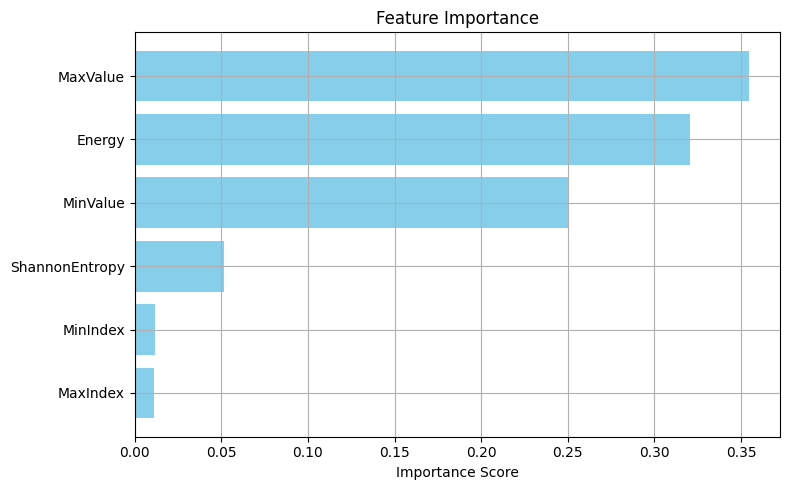


   XGBoost Sonuçları (Test Subject= subject08):
Accuracy: 0.9858
Precision: 1.0000
Recall: 0.9744
F1 Score: 0.9870
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        63
           1       1.00      0.97      0.99        78

    accuracy                           0.99       141
   macro avg       0.98      0.99      0.99       141
weighted avg       0.99      0.99      0.99       141

[[63  0]
 [ 2 76]]


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:12:00] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

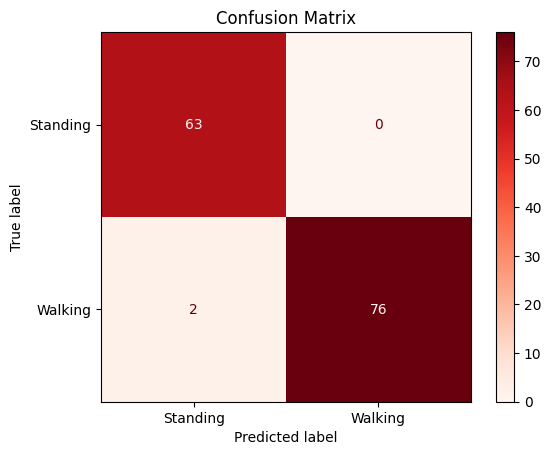

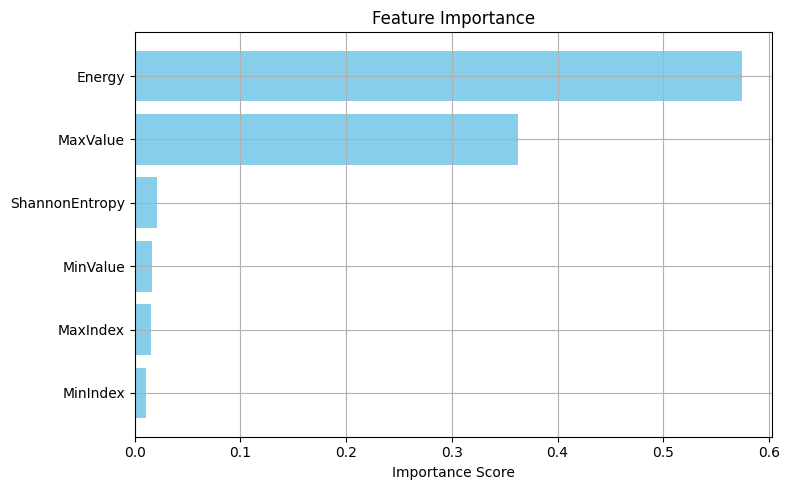

In [ ]:
features_ml=["Energy", "ShannonEntropy", "MaxValue", "MaxIndex", "MinValue", "MinIndex"]
svc_acc=[]
svc_prec=[]
svc_rec=[]
svc_f1=[]

rf_acc=[]
rf_prec=[]
rf_rec=[]
rf_f1=[]

xgb_acc=[]
xgb_prec=[]
xgb_rec=[]
xgb_f1=[]

for i in subject_names:
  # Train verisi: test_subject hariç herkes
  df_train= df_walking_standing[df_walking_standing["subject_name"] != i]

  # Test verisi: sadece test_subject
  df_test= df_walking_standing[df_walking_standing["subject_name"] == i]

  # train verileri
  X_train=df_train[features_ml]
  y_train=df_train["ActivityID"].replace({3:0, 4:1}) #3: standing(0), 4:walking(1) bunu yazmayınca precision da sıkıntı çıktı

  #test verileri
  X_test=df_test[features_ml]
  y_test=df_test["ActivityID"].replace({3:0, 4:1}) #3: standing(0), 4:walking(1) bunu yazmayınca precision da sıkıntı çıktı

  # Özellikleri ölçeklendir
  from sklearn.preprocessing import StandardScaler
  scaler = StandardScaler()
  X_train_scaled = scaler.fit_transform(X_train)
  X_test_scaled = scaler.transform(X_test)

  #shapiro for Features:
  X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=features_ml) #Önce scale edildikten sonra numpy araay'e dönen dosyayı dataframe e çeviriyorum
  from scipy.stats import shapiro
  for feature in features_ml:
    stat, p = shapiro(X_train_scaled_df[feature])
    print(f"{feature} (scale edilmiş features üzerinden): p= {p:.4f} -->", "Normal değil " if p<0.05 else "Normal" )
    print(f"P değeri: {p}")

    #SCALE EDİLMiş FEATURES DE Dğılım ve p değeri gerçektne doğru muyu değerlendirebişmek için Q-Q ve histogram grafiği çizme:
    import seaborn as sns
    import matplotlib.pyplot as plt
    import scipy.stats as stats

    plt.figure(figsize=(12,5))

    plt.subplot(1,2,1)
    sns.histplot(X_train_scaled_df[feature], kde=True)
    plt.title(f"{feature} - Histogram-scale edilmiş")
    plt.xlabel(f"{feature} Z-score")  # X eksenine Z-score yaz

    plt.subplot(1,2,2)
    stats.probplot(X_train[feature], dist="norm", plot=plt)
    plt.title(f"{feature} - Q-Q Plot-scale edilmiş")

    plt.tight_layout()
    plt.show()

  for feature in features_ml:
    stat, p = shapiro(X_train[feature])
    print(f"{feature} (scale edilmemiş features üzerinden): p= {p:.4f} -->", "Normal değil " if p<0.05 else "Normal" )
    print(f"P değeri: {p}")

    #SCALE EDİLMEMİŞ FEATURES DE Dğılım ve p değeri gerçektne doğru muyu değerlendirebişmek için Q-Q ve histogram grafiği çizme:
    import seaborn as sns
    import matplotlib.pyplot as plt
    import scipy.stats as stats

    plt.figure(figsize=(12,5))

    plt.subplot(1,2,1)
    sns.histplot(X_train[feature], kde=True)
    plt.title(f"{feature} - Histogram-scale edilmemiş")

    plt.subplot(1,2,2)
    stats.probplot(X_train[feature], dist="norm", plot=plt)
    plt.title(f"{feature} - Q-Q Plot-scale edilmemiş")

    plt.tight_layout()
    plt.show()




  #SVM
  from sklearn.svm import SVC
  model = SVC()
  model.fit(X_train_scaled, y_train)
  y_pred = model.predict(X_test_scaled)

  from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

  acc=accuracy_score(y_test, y_pred)#model.score(X_train_scaled, y_train) de accuracy sonu unu veriyor
  prec=precision_score(y_test, y_pred)
  rec=recall_score(y_test, y_pred)
  f1=f1_score(y_test, y_pred)

  svc_acc.append(acc)
  svc_prec.append(prec)
  svc_rec.append(rec)
  svc_f1.append(f1)

  print("\n" + "="*40)
  print(f"   \033[31mSVM Sonuçları (Test Subject: {i}):")  # sadece bu satır kırmızı
  print("="*40 +"\033[0m")

  print(f"Accuracy: {acc:.4f}")
  print(f"Precision: {prec:.4f}")
  print(f"Recall: {rec:.4f}")
  print(f"F1 Score: {f1:.4f}")

  from sklearn.metrics import classification_report
  print(classification_report(y_test,y_pred))

  from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
  import matplotlib.pyplot as plt
  print(confusion_matrix(y_test,y_pred))

  cm=confusion_matrix(y_test, y_pred)
  disp=ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Standing", "Walking"])

  plt.figure(figsize=(5,5))
  disp.plot(cmap=plt.cm.Blues)
  plt.title("Confusion Matrix")
  plt.grid(False)
  plt.show()

  #Random Forest:
  from sklearn.ensemble import RandomForestClassifier
  model = RandomForestClassifier()
  model.fit(X_train_scaled, y_train)
  y_pred = model.predict(X_test_scaled)

  from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

  acc=accuracy_score(y_test, y_pred) #model.score(X_train_scaled, y_train) de accuracy sonu unu veriyor
  prec=precision_score(y_test, y_pred)
  rec=recall_score(y_test, y_pred)
  f1=f1_score(y_test, y_pred)

  rf_acc.append(acc)
  rf_prec.append(prec)
  rf_rec.append(rec)
  rf_f1.append(f1)

  print("\n" + "="*40)
  print(f"   \033[31mRandom Forest Sonuçları (Test Subject= {i}):")  # sadece bu satır kırmızı
  print("="*40 +"\033[0m")

  print(f"Accuracy: {acc:.4f}")
  print(f"Precision: {prec:.4f}")
  print(f"Recall: {rec:.4f}")
  print(f"F1 Score: {f1:.4f}")

  #classification report:
  from sklearn.metrics import classification_report
  print(classification_report(y_test,y_pred))


  #Confusion matrix:
  from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
  import matplotlib.pyplot as plt
  print(confusion_matrix(y_test,y_pred))

  #Confusion matrix görselleştirme:
  cm=confusion_matrix(y_test, y_pred)
  disp=ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Standing", "Walking"])

  plt.figure(figsize=(5,5))
  disp.plot(cmap=plt.cm.Greens)
  plt.title("Confusion Matrix")
  plt.grid(False)
  plt.show()

  #Feature Importance bulma (SVM'de yokmuş, sadece random forestr ve XGBoost için önemliymiş)
  import pandas as pd
  import numpy as np
  import matplotlib.pyplot as plt

  features_ml=["Energy", "ShannonEntropy", "MaxValue", "MaxIndex", "MinValue", "MinIndex"]
  importances=model.feature_importances_

  feat_imp_df = pd.DataFrame({
      "Feature": features_ml,
      "Importance": importances
  }).sort_values(by="Importance", ascending=False)

  plt.figure(figsize=(8, 5))
  plt.barh(feat_imp_df["Feature"], feat_imp_df["Importance"], color="skyblue")
  plt.xlabel("Importance Score")
  plt.title("Feature Importance")
  plt.gca().invert_yaxis()
  plt.grid(True)
  plt.tight_layout()
  plt.show()

  #XGBoost:
  from xgboost import XGBClassifier
  model = XGBClassifier(use_label_encoder=False, eval_metric="logloss")
  model.fit(X_train_scaled, y_train)
  y_pred = model.predict(X_test_scaled)

  from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

  acc=accuracy_score(y_test, y_pred) #model.score(X_train_scaled, y_train) de accuracy sonu unu veriyor
  prec=precision_score(y_test, y_pred)
  rec=recall_score(y_test, y_pred)
  f1=f1_score(y_test, y_pred)

  xgb_acc.append(acc)
  xgb_prec.append(prec)
  xgb_rec.append(rec)
  xgb_f1.append(f1)

  print("\n" + "="*40)
  print(f"   \033[31mXGBoost Sonuçları (Test Subject= {i}):")  # sadece bu satır kırmızı
  print("="*40 +"\033[0m")

  print(f"Accuracy: {acc:.4f}")
  print(f"Precision: {prec:.4f}")
  print(f"Recall: {rec:.4f}")
  print(f"F1 Score: {f1:.4f}")

  from sklearn.metrics import classification_report
  print(classification_report(y_test,y_pred))

  from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
  import matplotlib.pyplot as plt
  print(confusion_matrix(y_test,y_pred))

  cm=confusion_matrix(y_test, y_pred)
  disp=ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Standing", "Walking"])

  plt.figure(figsize=(5,5))
  disp.plot(cmap=plt.cm.Reds)
  plt.title("Confusion Matrix")
  plt.grid(False)
  plt.show()


  #Feature Importance bulma (SVM'de yokmuş, sadece random forestr ve XGBoost için önemliymiş)
  import pandas as pd
  import numpy as np
  import matplotlib.pyplot as plt

  features_ml=["Energy", "ShannonEntropy", "MaxValue", "MaxIndex", "MinValue", "MinIndex"]
  importances=model.feature_importances_

  feat_imp_df = pd.DataFrame({
      "Feature": features_ml,
      "Importance": importances
  }).sort_values(by="Importance", ascending=False)

  plt.figure(figsize=(8, 5))
  plt.barh(feat_imp_df["Feature"], feat_imp_df["Importance"], color="skyblue")
  plt.xlabel("Importance Score")
  plt.title("Feature Importance")
  plt.gca().invert_yaxis()
  plt.grid(True)
  plt.tight_layout()
  plt.show()









In [ ]:
print(svc_acc)

[0.963963963963964, 0.9726027397260274, 0.976, 0.9788732394366197, 0.9779411764705882, 0.9841269841269841, 0.9865771812080537, 0.9787234042553191]


In [ ]:
SVC_acc_mean=sum(svc_acc)/len(svc_acc)
SVC_prec_mean=sum(svc_prec)/len(svc_prec)
SVC_rec_mean=sum(svc_rec)/len(svc_rec)
SVC_f1_mean=sum(svc_f1)/len(svc_f1)

RF_acc_mean=sum(rf_acc)/len(rf_acc)
RF_prec_mean=sum(rf_prec)/len(rf_prec)
RF_rec_mean=sum(rf_rec)/len(rf_rec)
RF_f1_mean=sum(rf_f1)/len(rf_f1)

XGB_acc_mean=sum(xgb_acc)/len(xgb_acc)
XGB_prec_mean=sum(xgb_prec)/len(xgb_prec)
XGB_rec_mean=sum(xgb_rec)/len(xgb_rec)
XGB_f1_mean=sum(xgb_f1)/len(xgb_f1)

In [ ]:
print(f"SVC Accuracy: {SVC_acc_mean} ")
print(f"SVC Precision: {SVC_prec_mean} ")
print(f"SVC Recall: {SVC_rec_mean}")
print(f"SVC F1 Score: {SVC_f1_mean}")

print(" ")

print(f"Random Forest Accuracy: {RF_acc_mean} ")
print(f"Random Forest Precision: {RF_prec_mean} ")
print(f"Random Forest Recall: {RF_rec_mean}")
print(f"Random Forest F1 Score: {RF_f1_mean}")

print(" ")

print(f"XGBoost Accuracy: {XGB_acc_mean} ")
print(f"XGBoost Precision: {XGB_prec_mean} ")
print(f"XGBoost Recall: {XGB_rec_mean}")
print(f"XGBoost F1 Score: {XGB_f1_mean}")

SVC Accuracy: 0.9773510861484446 
SVC Precision: 0.9911310492932908 
SVC Recall: 0.967598344932437
SVC F1 Score: 0.9791562803348587
 
Random Forest Accuracy: 0.9802598918032795 
Random Forest Precision: 0.9945913461538461 
Random Forest Recall: 0.9691780994022683
Random Forest F1 Score: 0.9816647762301435
 
XGBoost Accuracy: 0.9803500758573492 
XGBoost Precision: 0.9915603231366283 
XGBoost Recall: 0.9726255665692477
XGBoost F1 Score: 0.9819186340967753


# **SORU?**
SShapiro wilk ve Mann whitney u uygularken train ve test grubunu ayırıp dadece train grubu üzerinden mi buna bakmalıyım pdel oradan öğrendiği için? yoksa genel train ve test karışık toplam veri setinden baksam yeter mi?
Yani modelin öğrendiği veri setinden baköa zorunluluğum vsr mı?

Energy - Mann-Whitney U p değeri: 0.0000 --> Fark var
ShannonEntropy - Mann-Whitney U p değeri: 0.0000 --> Fark var
MaxValue - Mann-Whitney U p değeri: 0.0000 --> Fark var
MaxIndex - Mann-Whitney U p değeri: 0.8818 --> Fark yok


/tmp/ipython-input-15-3135900124.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="ActivityID", y= feature, data=df_walking_standing, palette="Set2")
/tmp/ipython-input-15-3135900124.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="ActivityID", y= feature, data=df_walking_standing, palette="Set2")
/tmp/ipython-input-15-3135900124.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="ActivityID", y= feature, data=df_walking_standing, palette="Set2")
/tmp/ipython-input-15-3135900124.py:21: FutureWarning: 

Passing `palette` with

MinValue - Mann-Whitney U p değeri: 0.0000 --> Fark var
MinIndex - Mann-Whitney U p değeri: 0.2070 --> Fark yok


/tmp/ipython-input-15-3135900124.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="ActivityID", y= feature, data=df_walking_standing, palette="Set2")
/tmp/ipython-input-15-3135900124.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="ActivityID", y= feature, data=df_walking_standing, palette="Set2")


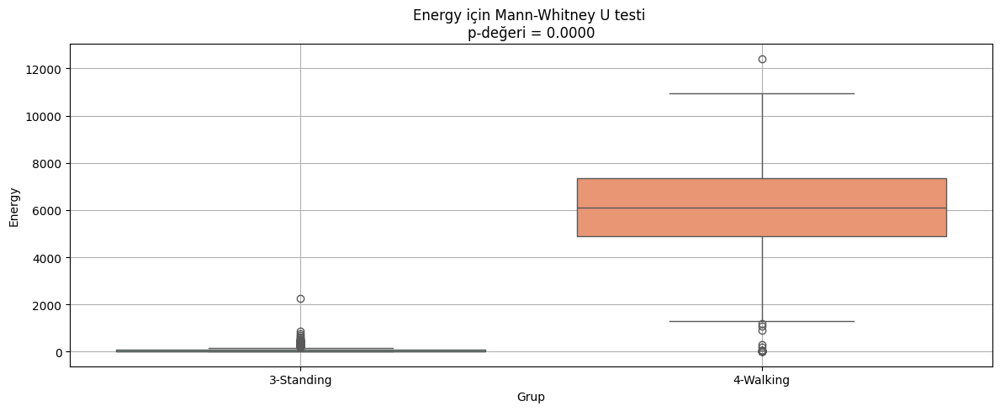

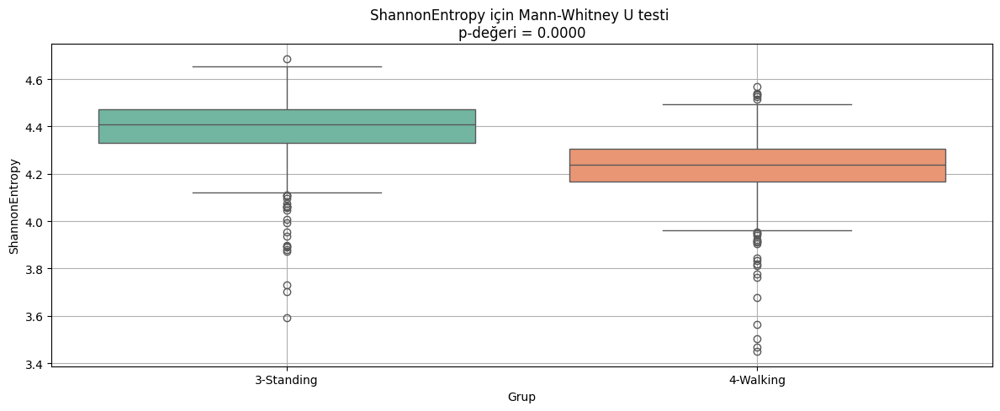

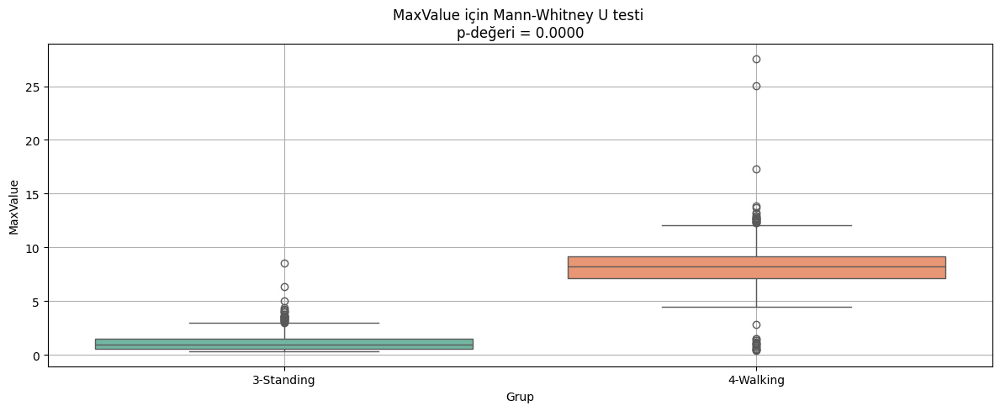

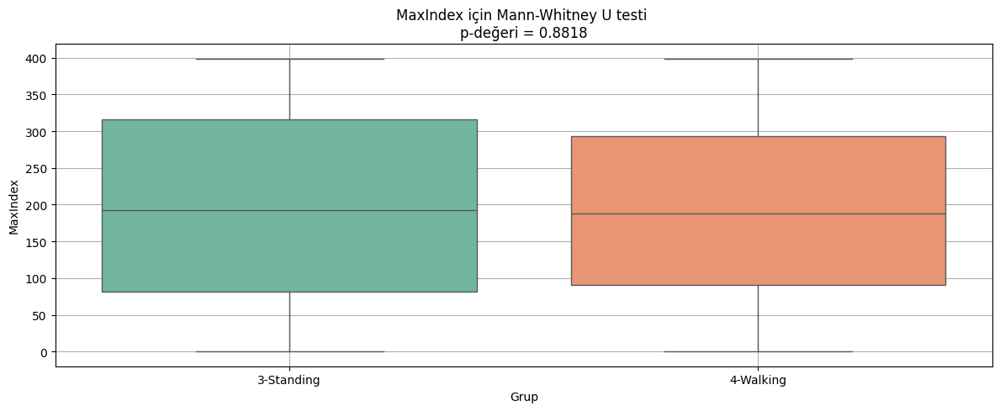

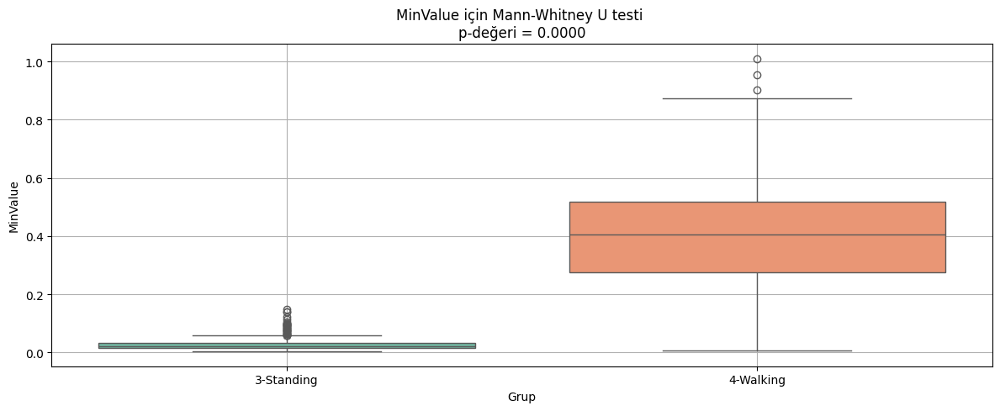

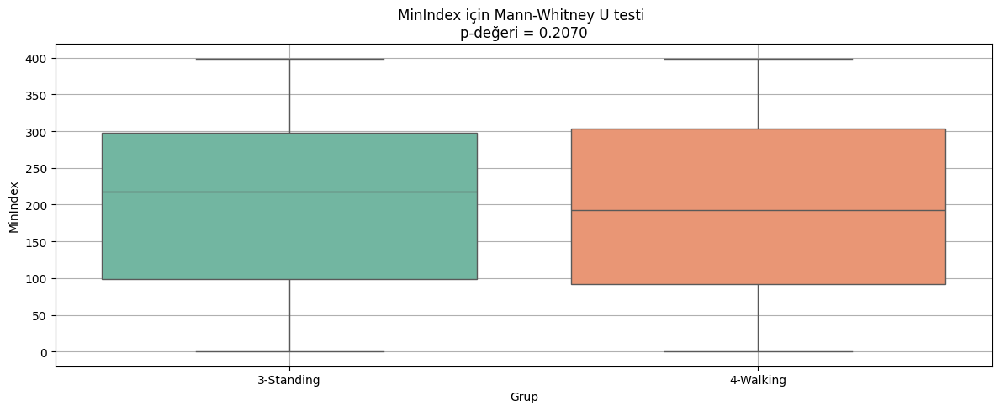

In [ ]:
#Shapiro Wilk testinde p değeri 0.05 ten küçük olduğu için normal dağılmıyor demektir.
#2 bağımsız grup, sayısal veriler içeriyorlar. O yüzeen her özellik için Mann whitney U ile walking ve standing arasında fark olup olmadığına bakacağım.

from scipy.stats import mannwhitneyu

import seaborn as sns
import matplotlib.pyplot as plt

standing= df_walking_standing[df_walking_standing["ActivityID"]==3]
walking= df_walking_standing[df_walking_standing["ActivityID"]==4]

#her özellik için aurı ayrı grupları karşılaştıracağım
for feature in features_ml:
  stat, p = mannwhitneyu(standing[feature], walking[feature], alternative="two-sided")
  print(f"{feature} - Mann-Whitney U p değeri: {p:.4f} -->", "Fark var" if p<0.05 else "Fark yok")

  #görselleştirelim


  plt.figure(figsize=(12,5))
  sns.boxplot(x="ActivityID", y= feature, data=df_walking_standing, palette="Set2")
  plt.xticks([0,1], ["3-Standing", "4-Walking"]) #3 ve 4 yerine otomarik 0 ve 0 etiket oldu
  plt.title(f"{feature} için Mann-Whitney U testi \np-değeri = {p:.4f}")
  plt.ylabel(feature)
  plt.xlabel("Grup")
  plt.grid(True)
  plt.tight_layout()
  plt.show


Energy - Mann-Whitney U p değeri: 0.0000 --> Fark var
ShannonEntropy - Mann-Whitney U p değeri: 0.0000 --> Fark var
MaxValue - Mann-Whitney U p değeri: 0.0000 --> Fark var
MaxIndex - Mann-Whitney U p değeri: 0.8818 --> Fark yok
MinValue - Mann-Whitney U p değeri: 0.0000 --> Fark var
MinIndex - Mann-Whitney U p değeri: 0.2070 --> Fark yok


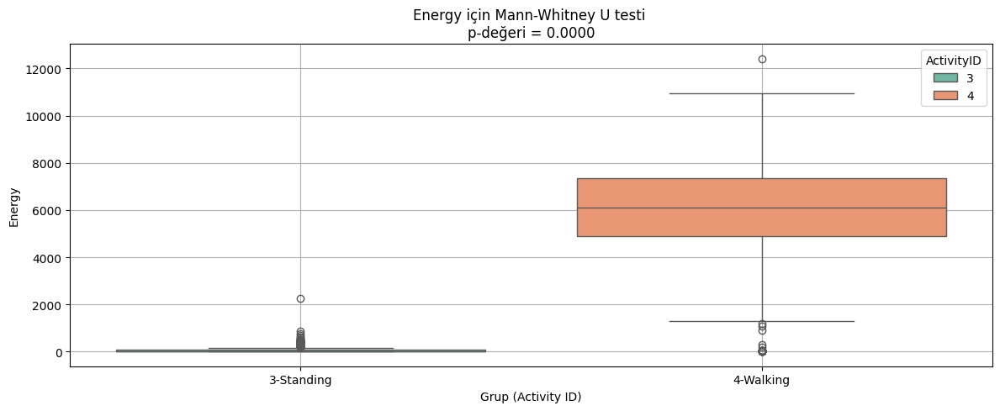

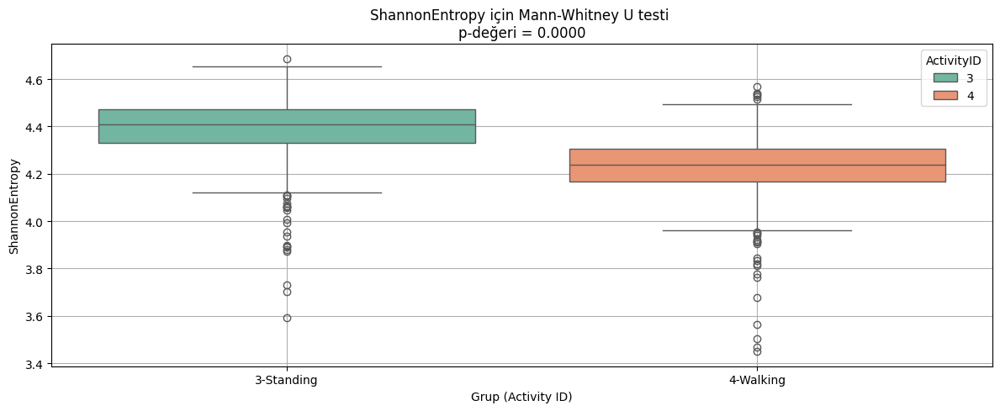

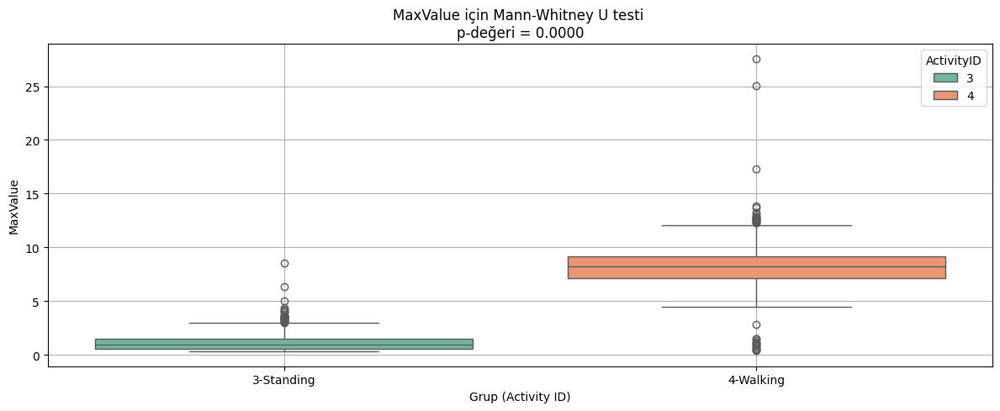

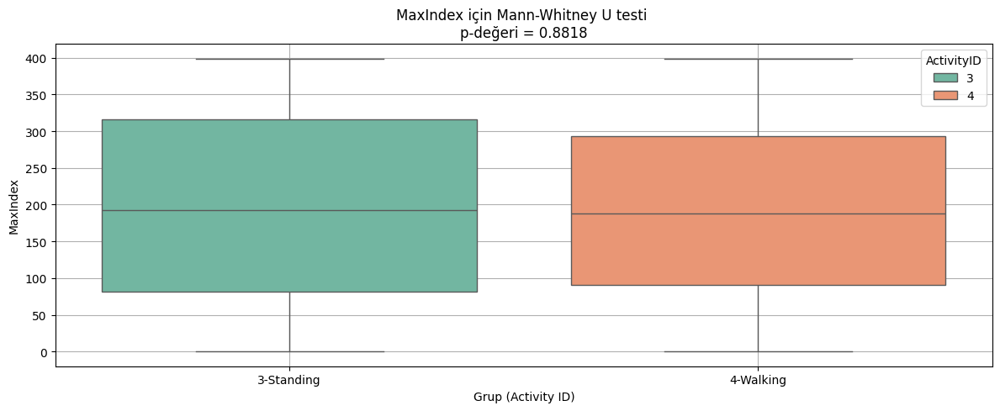

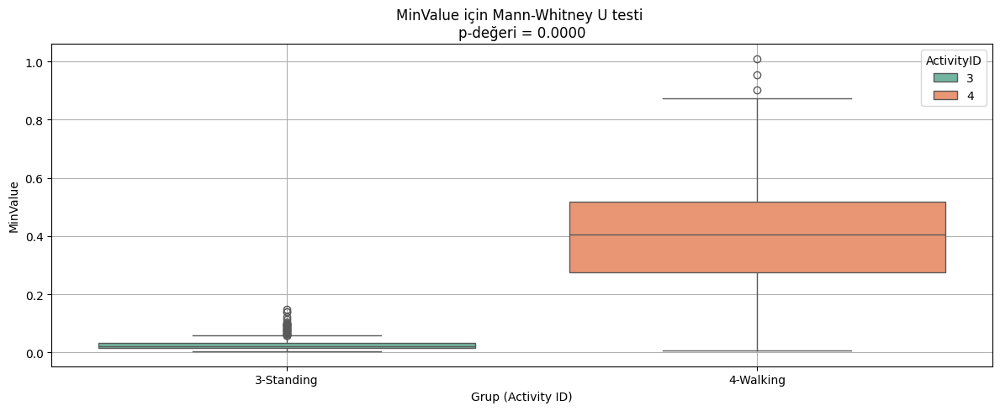

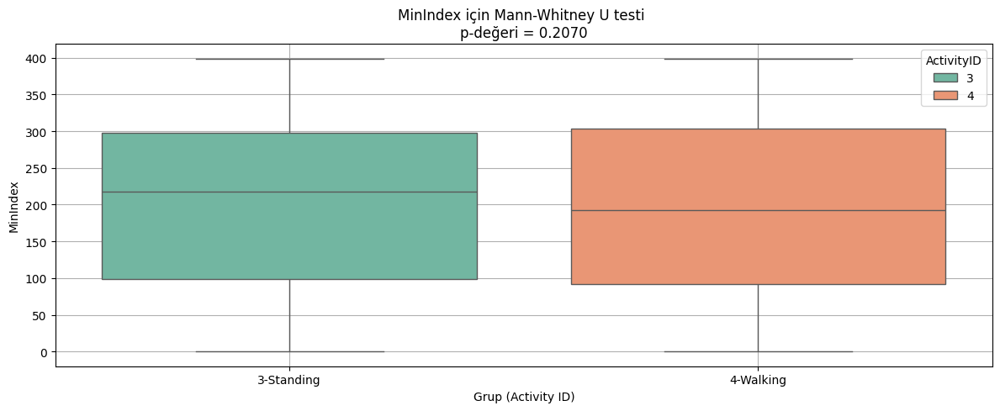

In [ ]:
#veya hue kullanırız:

#Shapiro Wilk testinde p değeri 0.05 ten küçük olduğu için normal dağılmıyor demektir.
#2 bağımsız grup, sayısal veriler içeriyorlar. O yüzeen her özellik için Mann whitney U ile walking ve standing arasında fark olup olmadığına bakacağım.

from scipy.stats import mannwhitneyu

import seaborn as sns
import matplotlib.pyplot as plt

standing= df_walking_standing[df_walking_standing["ActivityID"]==3]
walking= df_walking_standing[df_walking_standing["ActivityID"]==4]

#her özellik için aurı ayrı grupları karşılaştıracağım
for feature in features_ml:
  stat, p = mannwhitneyu(standing[feature], walking[feature], alternative="two-sided")
  print(f"{feature} - Mann-Whitney U p değeri: {p:.4f} -->", "Fark var" if p<0.05 else "Fark yok")

  #görselleştirelim


  plt.figure(figsize=(12,5))
  sns.boxplot(x="ActivityID", y= feature, data=df_walking_standing[df_walking_standing["ActivityID"].isin([3,4])], hue="ActivityID", palette="Set2")
  plt.xticks([0,1], ["3-Standing", "4-Walking"]) #3 ve 4 yerine otomarik 0 ve 0 etiket oldu
  plt.title(f"{feature} için Mann-Whitney U testi \np-değeri = {p:.4f}")
  plt.ylabel(feature)
  plt.xlabel("Grup (Activity ID)")
  plt.grid(True)
  plt.tight_layout()
  plt.show


hue, verileri gruplara ayırarak renklendirmek için kullanılan Seaborn özelliğidir ve genellikle kategorik bir değişkenle grupları renklerle ayırmak için kullanılır.

Senin örneğinde ActivityID grubu (3 = Standing, 4 = Walking) olduğuna göre hue="ActivityID" diyerek renkleri otomatik olarak bu gruplara göre ayarlayabilirsin.

hue ne işe yaradı?
x="ActivityID" → X ekseninde yine 3 ve 4 var
hue="ActivityID" → renkleri gruplara göre otomatik ayırır
Eğer x başka bir değişken olsaydı (örneğin "subject_name" gibi), hue yine grupları renk kodlardı


### ***************************

Detaylı Açıklama:
palette="Set2" → Matplotlib & Seaborn’in ön tanımlı pastel tonlarda bir renk setidir.
Genelde az sayıda kategori (örneğin 2 grup: standing vs walking) için uygundur.
Pastel ve yumuşak renkler içerir, görsel sunumlarda daha okunabilir ve estetik görünür.
🔁 Alternatif Renk Paletleri:
Palette Adı	Özellik
"Set1"	Daha canlı ve koyu renkler
"Set2"	Pastel tonlar (şu an kullandığın)
"Set3"	Daha fazla renk içeren karışık pastel
"pastel"	Hafif renkler
"dark"	Daha koyu, ciddi görünüm
"husl"	Parlak ve ayırt edici
"coolwarm"	Isı haritası gibi (gradient tarzı)

İstersen sana uygun bir özel renk paleti de oluşturabilirim (palette={"Standing": "skyblue", "Walking": "salmon"} gibi). Görsel sunumlar için oldukça faydalı olur.

In [ ]:
[]
{}

# **CHAT GPT KODU BİRAZ TEMİZLEDİ:**
AŞAĞIDAKİ KOD GPT'YE AİT

::


   SVM (Test: subject01) Sonuçları:
Accuracy: 0.9640
Precision: 0.9815
Recall: 0.9464
F1 Score: 0.9636
              precision    recall  f1-score   support

           0       0.95      0.98      0.96        55
           1       0.98      0.95      0.96        56

    accuracy                           0.96       111
   macro avg       0.96      0.96      0.96       111
weighted avg       0.96      0.96      0.96       111



<Figure size 500x500 with 0 Axes>

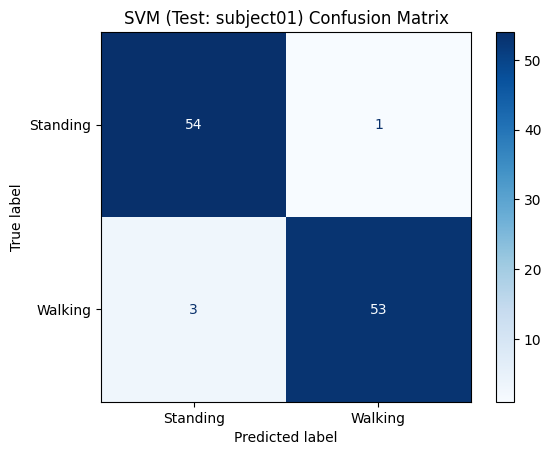


   Random Forest (Test: subject01) Sonuçları:
Accuracy: 0.9730
Precision: 1.0000
Recall: 0.9464
F1 Score: 0.9725
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        55
           1       1.00      0.95      0.97        56

    accuracy                           0.97       111
   macro avg       0.97      0.97      0.97       111
weighted avg       0.97      0.97      0.97       111



<Figure size 500x500 with 0 Axes>

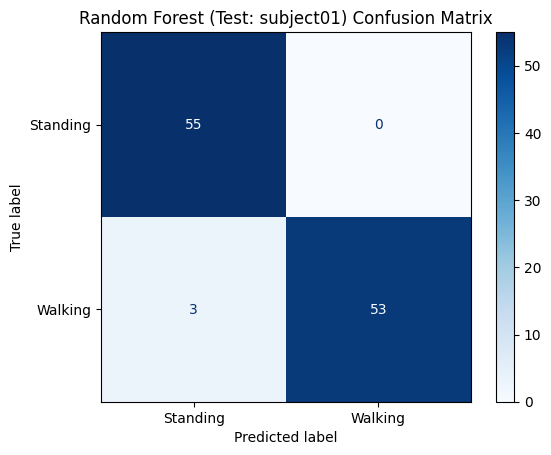

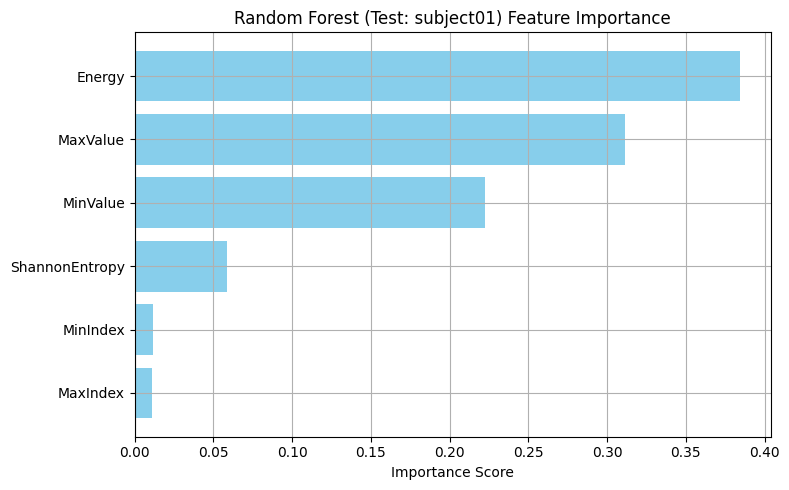


   XGBoost (Test: subject01) Sonuçları:
Accuracy: 0.9730
Precision: 1.0000
Recall: 0.9464
F1 Score: 0.9725
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        55
           1       1.00      0.95      0.97        56

    accuracy                           0.97       111
   macro avg       0.97      0.97      0.97       111
weighted avg       0.97      0.97      0.97       111



/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [09:57:45] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

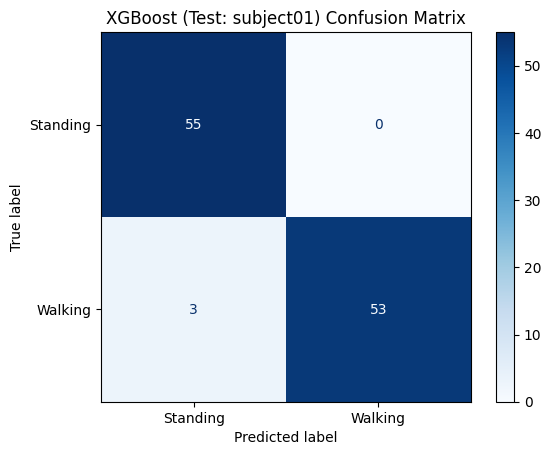

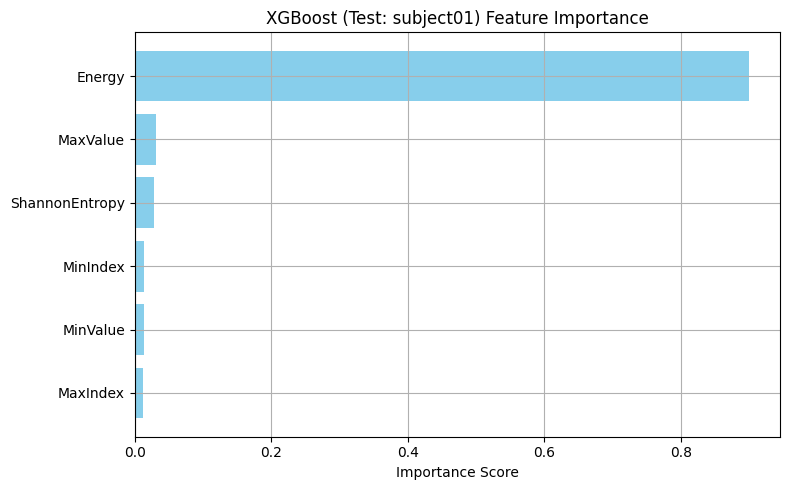


   SVM (Test: subject02) Sonuçları:
Accuracy: 0.9726
Precision: 0.9756
Recall: 0.9756
F1 Score: 0.9756
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        64
           1       0.98      0.98      0.98        82

    accuracy                           0.97       146
   macro avg       0.97      0.97      0.97       146
weighted avg       0.97      0.97      0.97       146



<Figure size 500x500 with 0 Axes>

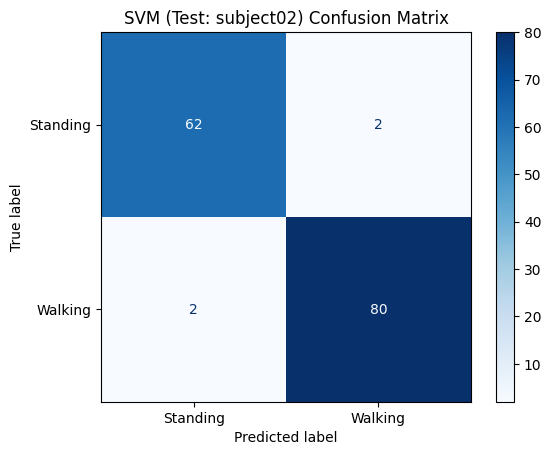


   Random Forest (Test: subject02) Sonuçları:
Accuracy: 0.9795
Precision: 0.9877
Recall: 0.9756
F1 Score: 0.9816
              precision    recall  f1-score   support

           0       0.97      0.98      0.98        64
           1       0.99      0.98      0.98        82

    accuracy                           0.98       146
   macro avg       0.98      0.98      0.98       146
weighted avg       0.98      0.98      0.98       146



<Figure size 500x500 with 0 Axes>

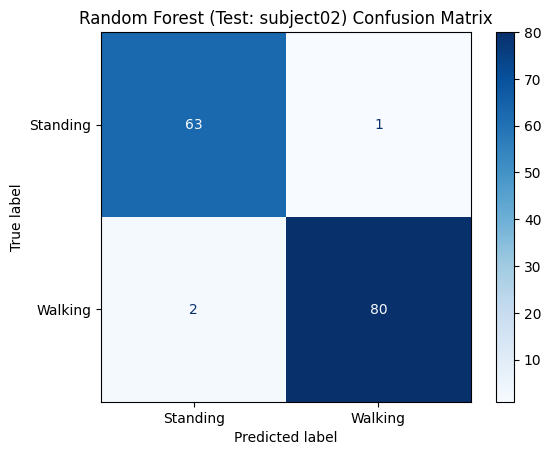

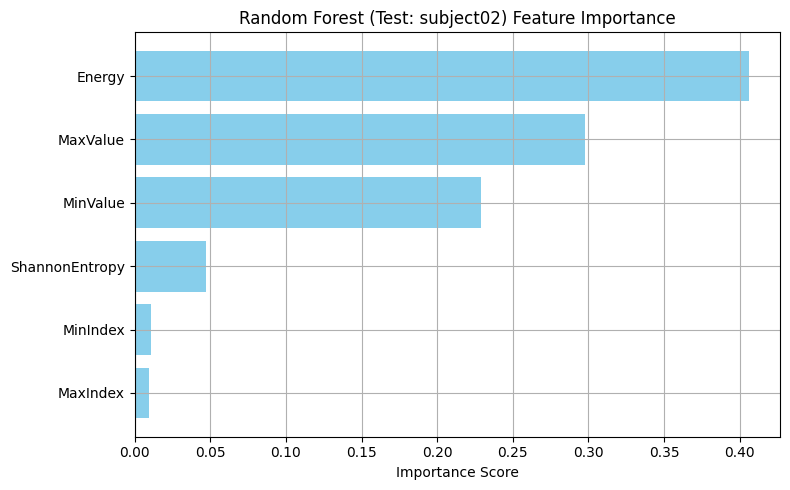


   XGBoost (Test: subject02) Sonuçları:
Accuracy: 0.9795
Precision: 0.9877
Recall: 0.9756
F1 Score: 0.9816
              precision    recall  f1-score   support

           0       0.97      0.98      0.98        64
           1       0.99      0.98      0.98        82

    accuracy                           0.98       146
   macro avg       0.98      0.98      0.98       146
weighted avg       0.98      0.98      0.98       146



/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [09:57:46] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

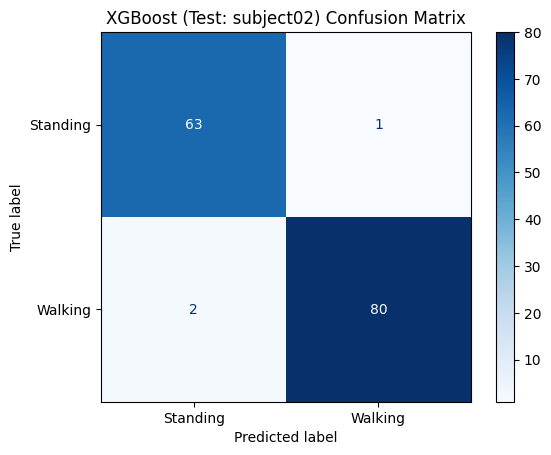

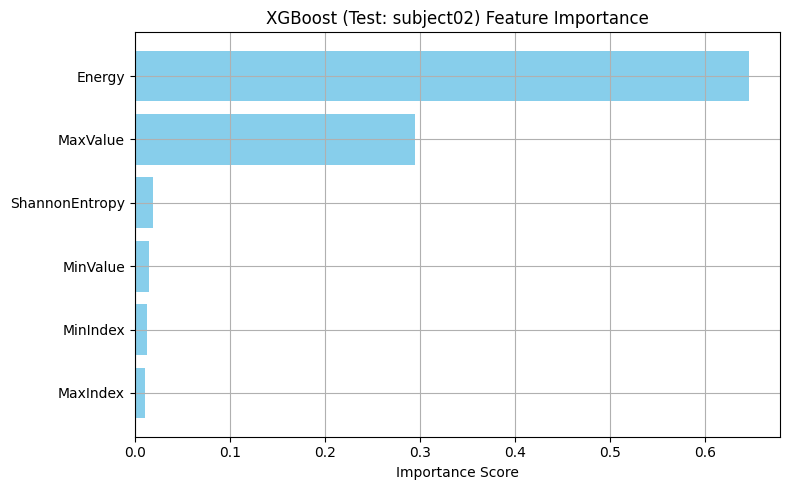


   SVM (Test: subject03) Sonuçları:
Accuracy: 0.9760
Precision: 1.0000
Recall: 0.9589
F1 Score: 0.9790
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        52
           1       1.00      0.96      0.98        73

    accuracy                           0.98       125
   macro avg       0.97      0.98      0.98       125
weighted avg       0.98      0.98      0.98       125



<Figure size 500x500 with 0 Axes>

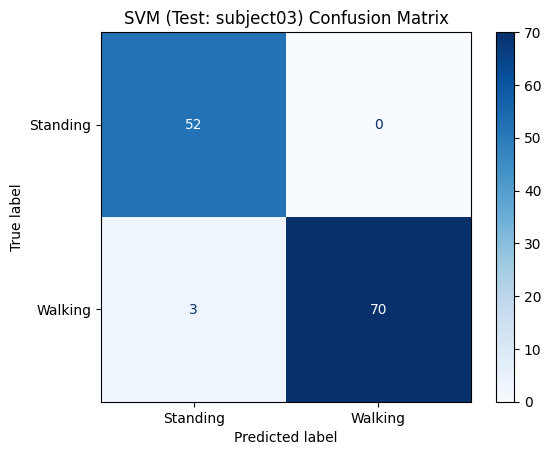


   Random Forest (Test: subject03) Sonuçları:
Accuracy: 0.9920
Precision: 1.0000
Recall: 0.9863
F1 Score: 0.9931
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        52
           1       1.00      0.99      0.99        73

    accuracy                           0.99       125
   macro avg       0.99      0.99      0.99       125
weighted avg       0.99      0.99      0.99       125



<Figure size 500x500 with 0 Axes>

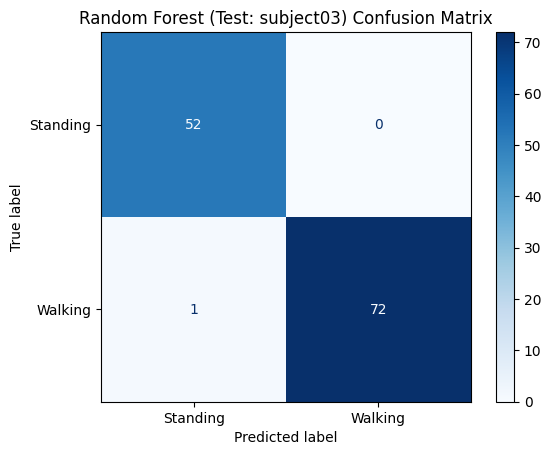

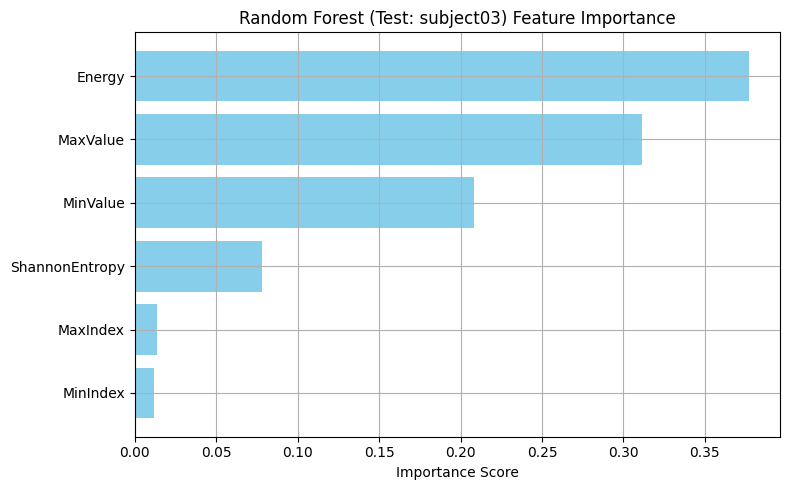

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [09:57:48] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



   XGBoost (Test: subject03) Sonuçları:
Accuracy: 0.9920
Precision: 1.0000
Recall: 0.9863
F1 Score: 0.9931
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        52
           1       1.00      0.99      0.99        73

    accuracy                           0.99       125
   macro avg       0.99      0.99      0.99       125
weighted avg       0.99      0.99      0.99       125



<Figure size 500x500 with 0 Axes>

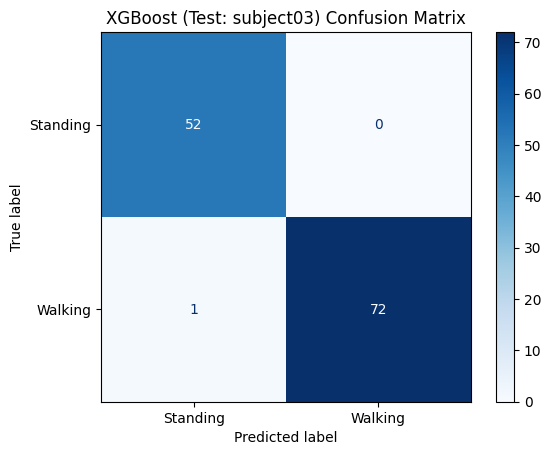

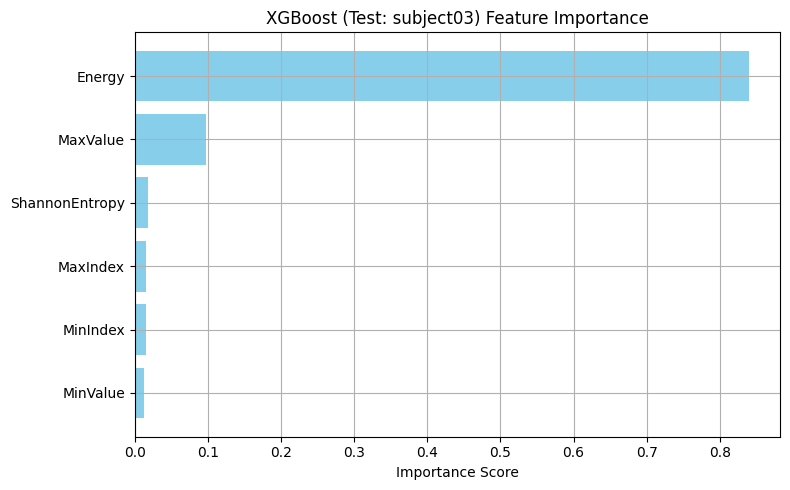


   SVM (Test: subject04) Sonuçları:
Accuracy: 0.9789
Precision: 1.0000
Recall: 0.9625
F1 Score: 0.9809
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        62
           1       1.00      0.96      0.98        80

    accuracy                           0.98       142
   macro avg       0.98      0.98      0.98       142
weighted avg       0.98      0.98      0.98       142



<Figure size 500x500 with 0 Axes>

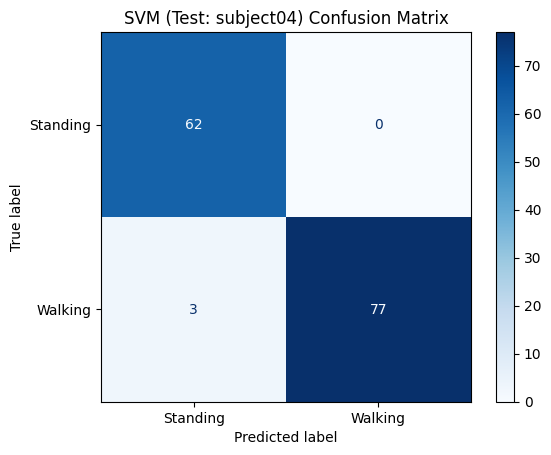


   Random Forest (Test: subject04) Sonuçları:
Accuracy: 0.9859
Precision: 1.0000
Recall: 0.9750
F1 Score: 0.9873
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        62
           1       1.00      0.97      0.99        80

    accuracy                           0.99       142
   macro avg       0.98      0.99      0.99       142
weighted avg       0.99      0.99      0.99       142



<Figure size 500x500 with 0 Axes>

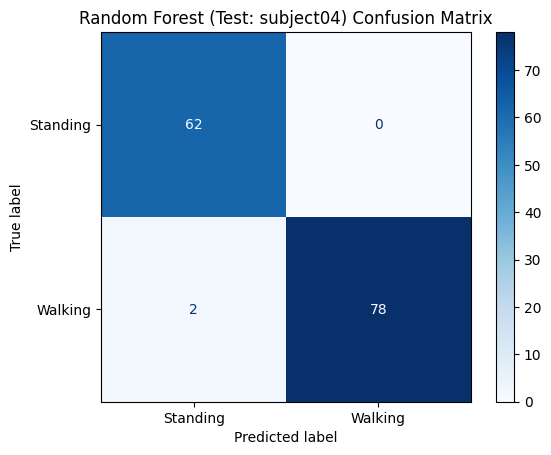

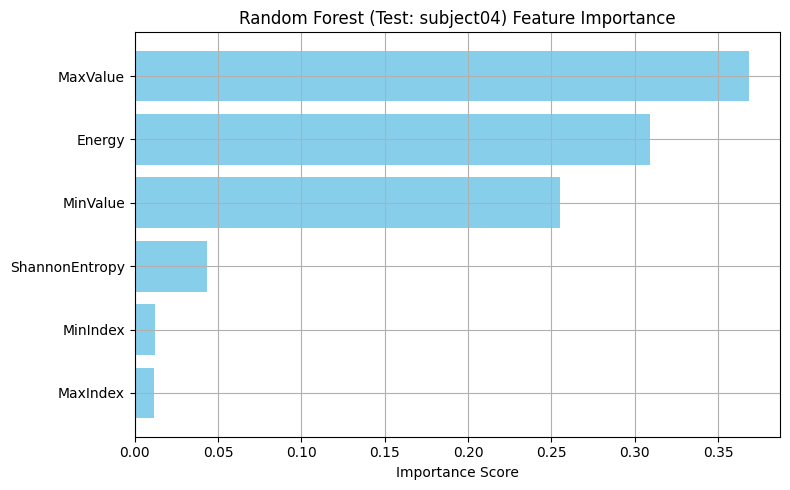


   XGBoost (Test: subject04) Sonuçları:
Accuracy: 0.9859
Precision: 1.0000
Recall: 0.9750
F1 Score: 0.9873
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        62
           1       1.00      0.97      0.99        80

    accuracy                           0.99       142
   macro avg       0.98      0.99      0.99       142
weighted avg       0.99      0.99      0.99       142



/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [09:57:50] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

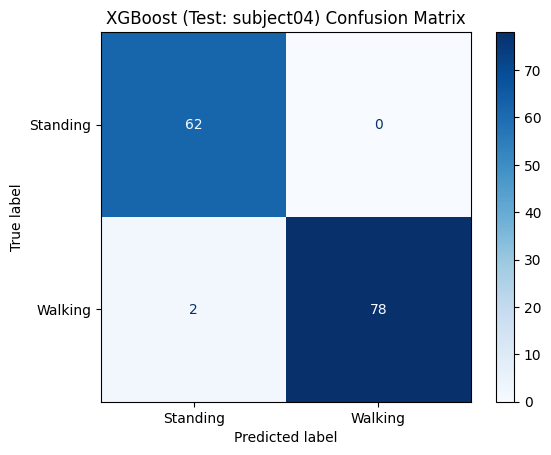

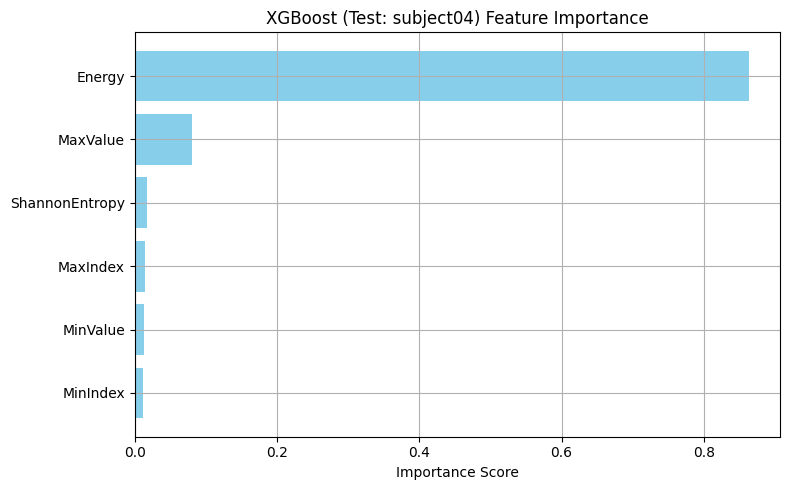


   SVM (Test: subject05) Sonuçları:
Accuracy: 0.9779
Precision: 0.9873
Recall: 0.9750
F1 Score: 0.9811
              precision    recall  f1-score   support

           0       0.96      0.98      0.97        56
           1       0.99      0.97      0.98        80

    accuracy                           0.98       136
   macro avg       0.98      0.98      0.98       136
weighted avg       0.98      0.98      0.98       136



<Figure size 500x500 with 0 Axes>

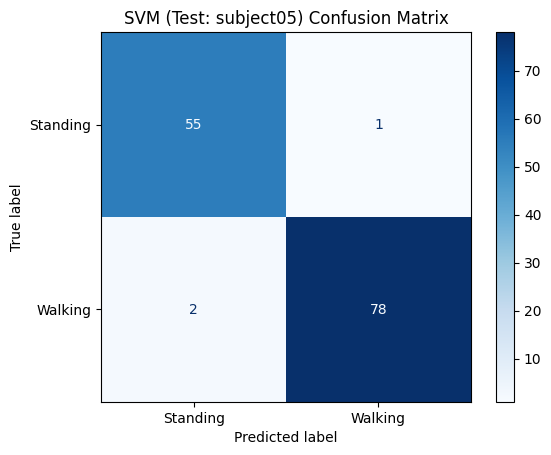


   Random Forest (Test: subject05) Sonuçları:
Accuracy: 0.9779
Precision: 1.0000
Recall: 0.9625
F1 Score: 0.9809
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        56
           1       1.00      0.96      0.98        80

    accuracy                           0.98       136
   macro avg       0.97      0.98      0.98       136
weighted avg       0.98      0.98      0.98       136



<Figure size 500x500 with 0 Axes>

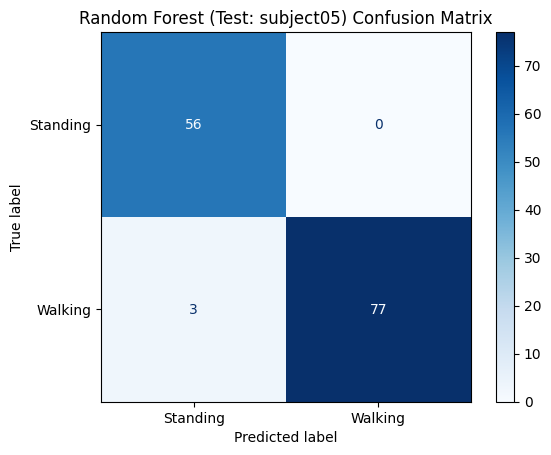

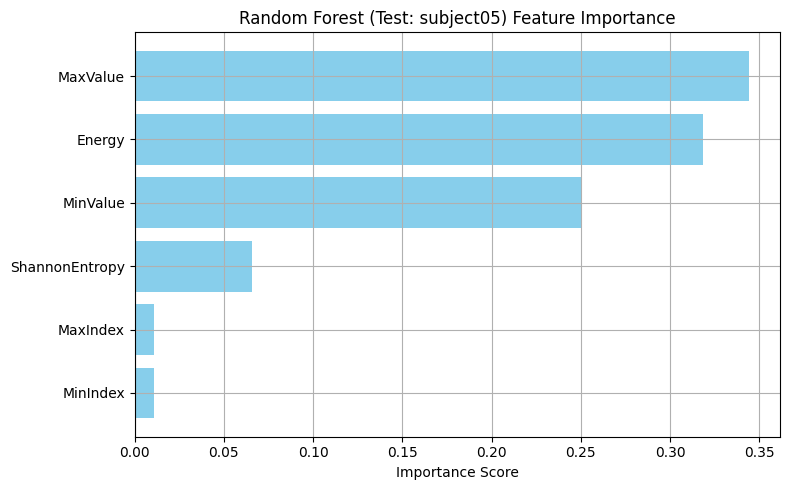

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [09:57:51] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



   XGBoost (Test: subject05) Sonuçları:
Accuracy: 0.9706
Precision: 0.9872
Recall: 0.9625
F1 Score: 0.9747
              precision    recall  f1-score   support

           0       0.95      0.98      0.96        56
           1       0.99      0.96      0.97        80

    accuracy                           0.97       136
   macro avg       0.97      0.97      0.97       136
weighted avg       0.97      0.97      0.97       136



<Figure size 500x500 with 0 Axes>

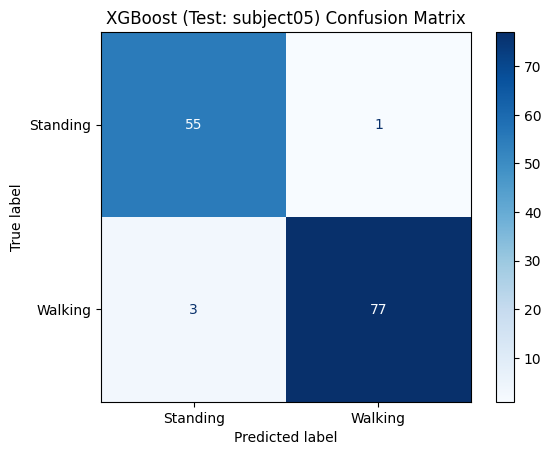

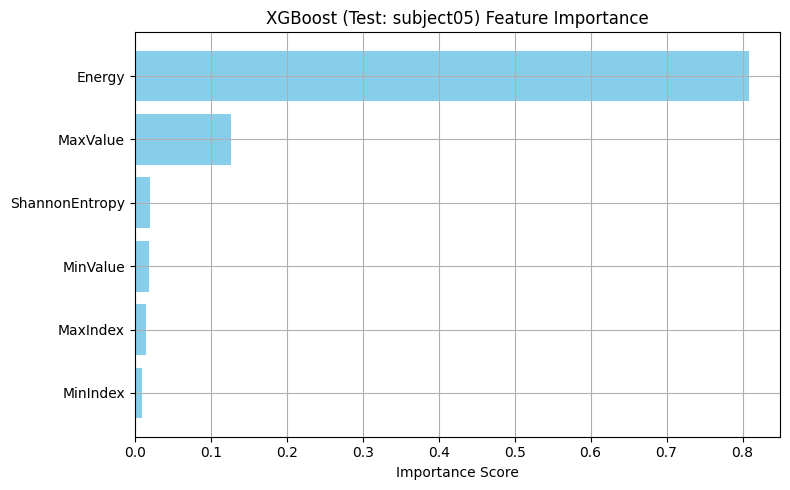


   SVM (Test: subject06) Sonuçları:
Accuracy: 0.9841
Precision: 0.9846
Recall: 0.9846
F1 Score: 0.9846
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        61
           1       0.98      0.98      0.98        65

    accuracy                           0.98       126
   macro avg       0.98      0.98      0.98       126
weighted avg       0.98      0.98      0.98       126



<Figure size 500x500 with 0 Axes>

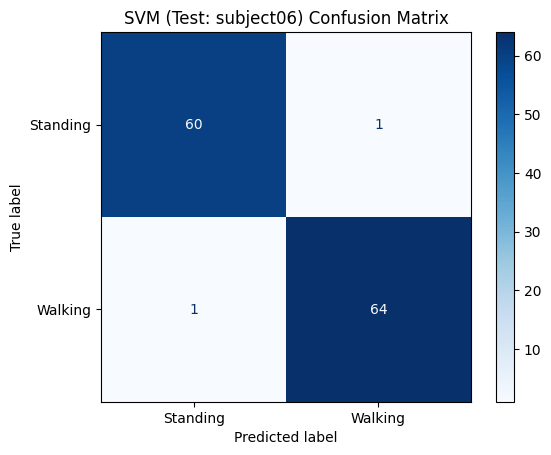


   Random Forest (Test: subject06) Sonuçları:
Accuracy: 0.9603
Precision: 0.9545
Recall: 0.9692
F1 Score: 0.9618
              precision    recall  f1-score   support

           0       0.97      0.95      0.96        61
           1       0.95      0.97      0.96        65

    accuracy                           0.96       126
   macro avg       0.96      0.96      0.96       126
weighted avg       0.96      0.96      0.96       126



<Figure size 500x500 with 0 Axes>

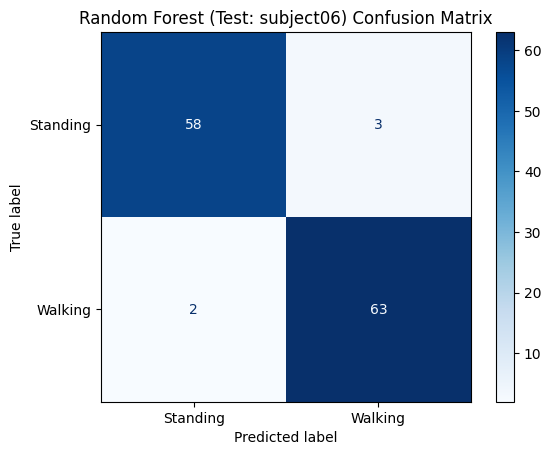

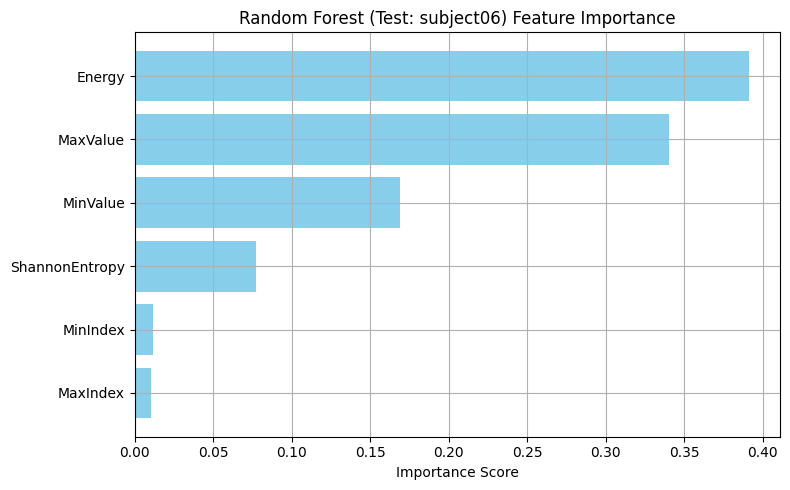


   XGBoost (Test: subject06) Sonuçları:
Accuracy: 0.9762
Precision: 0.9697
Recall: 0.9846
F1 Score: 0.9771
              precision    recall  f1-score   support

           0       0.98      0.97      0.98        61
           1       0.97      0.98      0.98        65

    accuracy                           0.98       126
   macro avg       0.98      0.98      0.98       126
weighted avg       0.98      0.98      0.98       126



/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [09:57:53] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

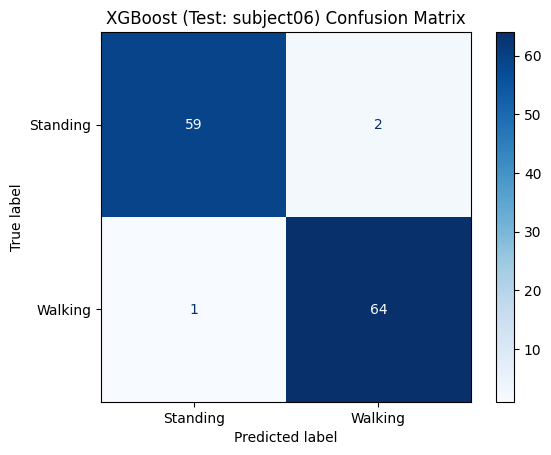

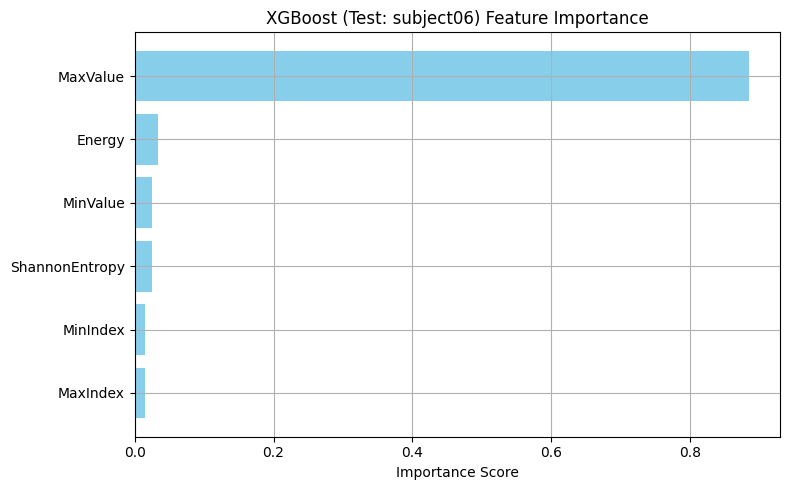


   SVM (Test: subject07) Sonuçları:
Accuracy: 0.9866
Precision: 1.0000
Recall: 0.9762
F1 Score: 0.9880
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        65
           1       1.00      0.98      0.99        84

    accuracy                           0.99       149
   macro avg       0.99      0.99      0.99       149
weighted avg       0.99      0.99      0.99       149



<Figure size 500x500 with 0 Axes>

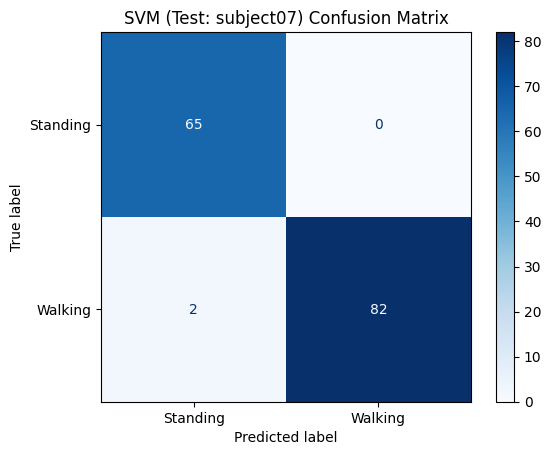


   Random Forest (Test: subject07) Sonuçları:
Accuracy: 0.9866
Precision: 1.0000
Recall: 0.9762
F1 Score: 0.9880
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        65
           1       1.00      0.98      0.99        84

    accuracy                           0.99       149
   macro avg       0.99      0.99      0.99       149
weighted avg       0.99      0.99      0.99       149



<Figure size 500x500 with 0 Axes>

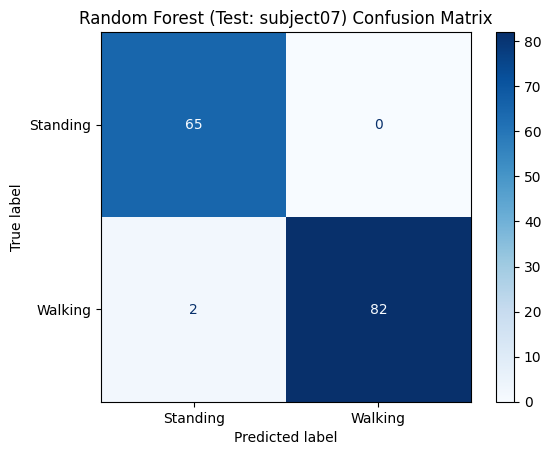

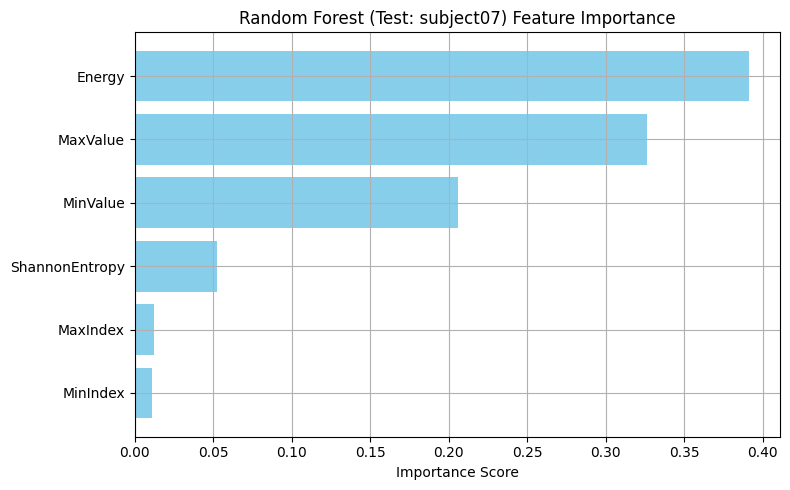


   XGBoost (Test: subject07) Sonuçları:
Accuracy: 0.9799
Precision: 0.9880
Recall: 0.9762
F1 Score: 0.9820
              precision    recall  f1-score   support

           0       0.97      0.98      0.98        65
           1       0.99      0.98      0.98        84

    accuracy                           0.98       149
   macro avg       0.98      0.98      0.98       149
weighted avg       0.98      0.98      0.98       149



/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [09:57:54] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

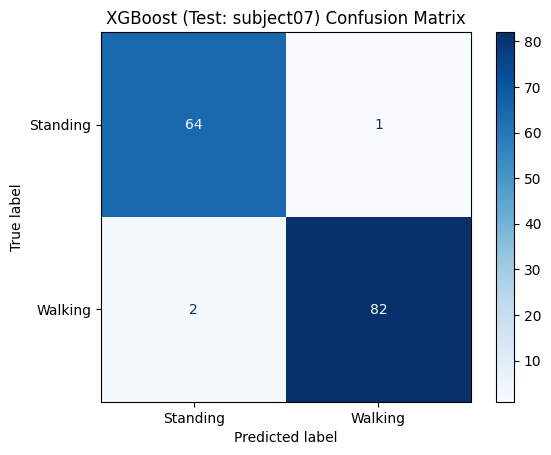

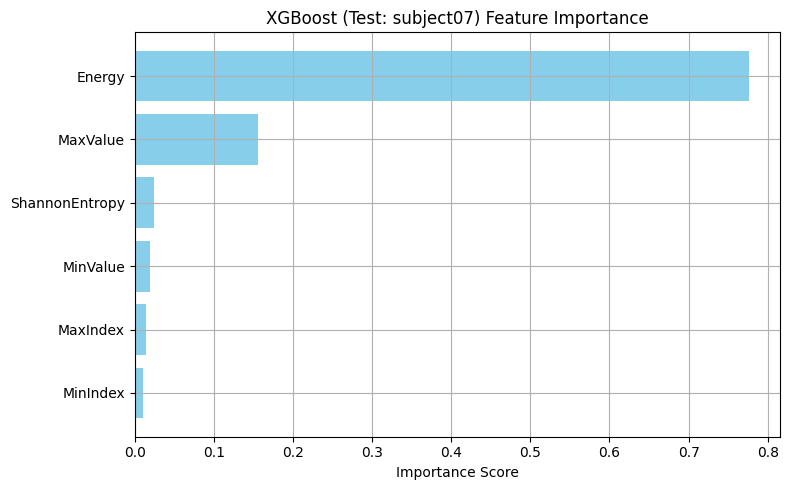


   SVM (Test: subject08) Sonuçları:
Accuracy: 0.9787
Precision: 1.0000
Recall: 0.9615
F1 Score: 0.9804
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        63
           1       1.00      0.96      0.98        78

    accuracy                           0.98       141
   macro avg       0.98      0.98      0.98       141
weighted avg       0.98      0.98      0.98       141



<Figure size 500x500 with 0 Axes>

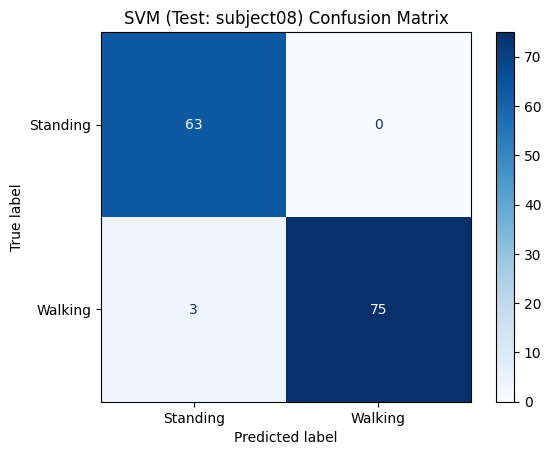


   Random Forest (Test: subject08) Sonuçları:
Accuracy: 0.9858
Precision: 1.0000
Recall: 0.9744
F1 Score: 0.9870
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        63
           1       1.00      0.97      0.99        78

    accuracy                           0.99       141
   macro avg       0.98      0.99      0.99       141
weighted avg       0.99      0.99      0.99       141



<Figure size 500x500 with 0 Axes>

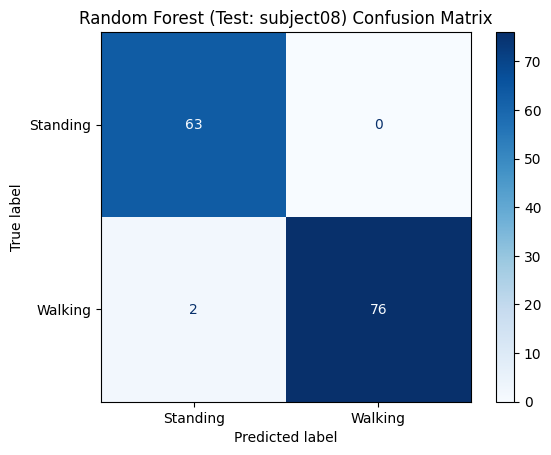

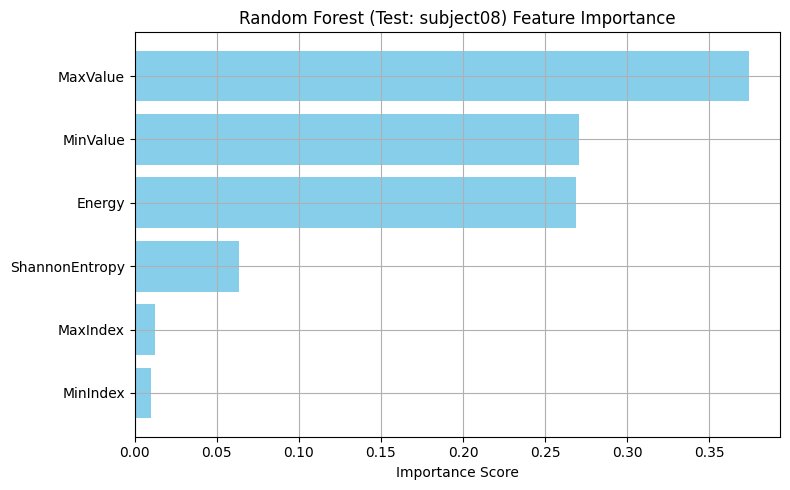


   XGBoost (Test: subject08) Sonuçları:
Accuracy: 0.9858
Precision: 1.0000
Recall: 0.9744
F1 Score: 0.9870
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        63
           1       1.00      0.97      0.99        78

    accuracy                           0.99       141
   macro avg       0.98      0.99      0.99       141
weighted avg       0.99      0.99      0.99       141



/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [09:57:55] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<Figure size 500x500 with 0 Axes>

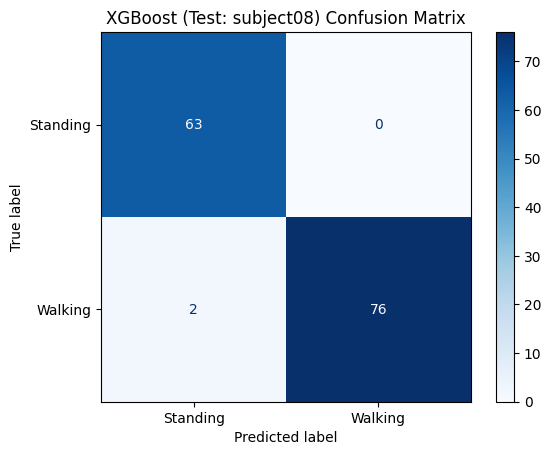

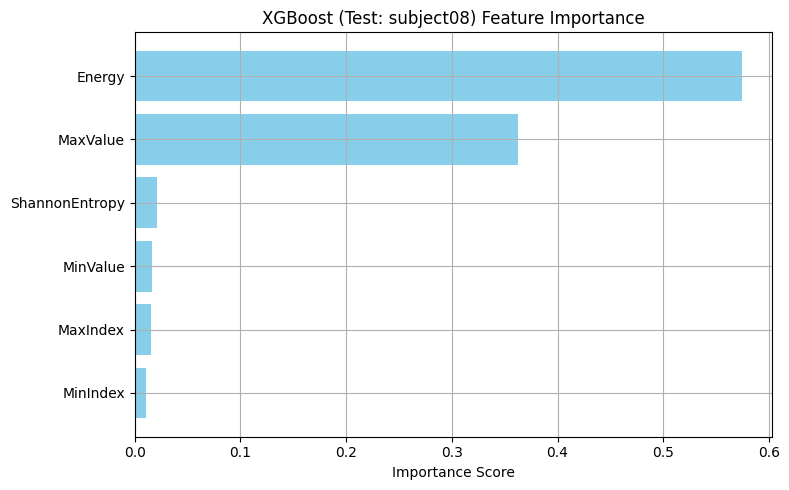


=== Ortalama LOSO Sonuçları ===

        acc    prec     rec      f1
SVM  0.9774  0.9911  0.9676  0.9792
RF   0.9801  0.9928  0.9707  0.9815
XGB  0.9804  0.9916  0.9726  0.9819


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay
)
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# Veri yükle
df = pd.read_csv("walking_standing_feature_matrix-2.csv", index_col=0)

# Özellik isimleri
features_ml = ["Energy", "ShannonEntropy", "MaxValue", "MaxIndex", "MinValue", "MinIndex"]
subject_names = df["subject_name"].unique()

# Metriklerin tutulacağı sözlük
results = {
    "SVM": {"acc": [], "prec": [], "rec": [], "f1": []},
    "RF": {"acc": [], "prec": [], "rec": [], "f1": []},
    "XGB": {"acc": [], "prec": [], "rec": [], "f1": []}
}

# Değerlendirme fonksiyonu
def evaluate_model(model, X_train, y_train, X_test, y_test, model_name="", display_label=["Standing", "Walking"], show_cm=True, show_importance=False, features=None):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    print("\n" + "="*40)
    print(f"   \033[31m{model_name} Sonuçları:\033[0m")
    print("="*40)
    print(f"Accuracy: {acc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall: {rec:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(classification_report(y_test, y_pred))

    if show_cm:
        cm = confusion_matrix(y_test, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=display_label)
        plt.figure(figsize=(5, 5))
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f"{model_name} Confusion Matrix")
        plt.grid(False)
        plt.show()

    if show_importance and hasattr(model, 'feature_importances_'):
        importances = model.feature_importances_
        feat_imp_df = pd.DataFrame({
            "Feature": features,
            "Importance": importances
        }).sort_values(by="Importance", ascending=False)
        plt.figure(figsize=(8, 5))
        plt.barh(feat_imp_df["Feature"], feat_imp_df["Importance"], color="skyblue")
        plt.xlabel("Importance Score")
        plt.title(f"{model_name} Feature Importance")
        plt.gca().invert_yaxis()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    return acc, prec, rec, f1

# LOSO-CV döngüsü
for subject in subject_names:
    df_train = df[df["subject_name"] != subject]
    df_test = df[df["subject_name"] == subject]

    X_train = df_train[features_ml]
    y_train = df_train["ActivityID"].replace({3: 0, 4: 1})
    X_test = df_test[features_ml]
    y_test = df_test["ActivityID"].replace({3: 0, 4: 1})

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # SVM
    svm_model = SVC()
    acc, prec, rec, f1 = evaluate_model(svm_model, X_train_scaled, y_train, X_test_scaled, y_test, model_name=f"SVM (Test: {subject})")
    results["SVM"]["acc"].append(acc)
    results["SVM"]["prec"].append(prec)
    results["SVM"]["rec"].append(rec)
    results["SVM"]["f1"].append(f1)

    # Random Forest
    rf_model = RandomForestClassifier()
    acc, prec, rec, f1 = evaluate_model(rf_model, X_train_scaled, y_train, X_test_scaled, y_test, model_name=f"Random Forest (Test: {subject})", show_importance=True, features=features_ml)
    results["RF"]["acc"].append(acc)
    results["RF"]["prec"].append(prec)
    results["RF"]["rec"].append(rec)
    results["RF"]["f1"].append(f1)

    # XGBoost
    xgb_model = XGBClassifier(use_label_encoder=False, eval_metric="logloss")
    acc, prec, rec, f1 = evaluate_model(xgb_model, X_train_scaled, y_train, X_test_scaled, y_test, model_name=f"XGBoost (Test: {subject})", show_importance=True, features=features_ml)
    results["XGB"]["acc"].append(acc)
    results["XGB"]["prec"].append(prec)
    results["XGB"]["rec"].append(rec)
    results["XGB"]["f1"].append(f1)

# Ortalama metrikleri hesapla
mean_results = {
    model: {
        metric: np.mean(scores) for metric, scores in metrics.items()
    } for model, metrics in results.items()
}

# Sonuçları tablo halinde göster
print("\n=== Ortalama LOSO Sonuçları ===\n")
df_mean = pd.DataFrame(mean_results).T.round(4)
print(df_mean)
